# TRABAJO FINAL




---


Caso de estudio: 'Credit Card customers'


---


*   Enlace: 'https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers'


---


Integrantes:
*   Campos Nuñez Nicole Margarita
*   Lino Moreno Smith Eusebio







---


Problemática:
El banco enfrenta un incremento sostenido en la deserción de clientes que optan por cancelar sus servicios de tarjeta de crédito. Esta tendencia genera preocupación en la gerencia, que busca implementar estrategias proactivas para mejorar la experiencia del cliente y ofrecer propuestas de valor que contribuyan a retenerlos y revertir esta situación.




---

Variables

1.	Identificación y Estado:

*   CLIENTNUM: Número único de cliente
*   Attrition_Flag: Indica si el cliente es existente o attrited o	(abandonó)

2.	Datos Demográficos:

*   Customer_Age: Edad del cliente
*   Gender: Género (M/F)
*   Dependent_count: Número de dependientes
*   Education_Level: Nivel educativo
*   Marital_Status: Estado civil
*   Income_Category: Rango de ingresos

3.	Datos de Productos Bancarios:

*   Card_Category: Tipo de tarjeta (Blue, Silver, Gold, Platinum)
*   Months_on_book: Meses como cliente
*   Total_Relationship_Count: Número de productos bancarios del cliente

4.	Comportamiento:

*   Months_Inactive_12_mon: Meses inactivos en último año
*   Contacts_Count_12_mon: Contactos con el banco en último año

5.	Datos Financieros:

*   Credit_Limit: Límite de crédito
*   Total_Revolving_Bal: Saldo revolvente
*   Avg_Open_To_Buy: Crédito disponible
*   Total_Trans_Amt: Volumen total de transacciones
*   Total_Trans_Ct: Cantidad total de transacciones
*   Avg_Utilization_Ratio: Utilización promedio del crédito

# 1. Carga de datos

In [ ]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

In [ ]:
# Importar los datos desde el repositorio
banco = pd.read_csv("/content/BankChurners.csv", sep = ",")
banco.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [ ]:
#Eliminando variables columnas de modelos que se trabajaron y se guardaron en el dataset

eliminar_variables = ['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
                  'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']
banco = banco.drop(eliminar_variables, axis = 1)
banco.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# 2. Análisis exploratorio de los datos (EDA)

### 2.1. Inspección

In [ ]:
#Estructura de los datos
banco.shape

(10127, 21)

In [ ]:
banco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Se observa 10127 registros en 21 features

Se observa 6 variables tipo object (Categoricas) y 15 variables numericas

In [ ]:
# Valores nulos
print("Valores nulos por columna:")
print(banco.isnull().sum())


Valores nulos por columna:
CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64


In [ ]:
# Valores nulos
#¿Existen clientes Duplicados?
print("\nClientes duplicados:", banco.duplicated(subset=['CLIENTNUM']).sum())
# Si hay duplicados:
banco = banco.drop_duplicates(subset=['CLIENTNUM'])


Clientes duplicados: 0


Por lo tanto se observa que tenemos 10127 clientes unicos dentro de nuestra base de los cuales poseemos 6 variables categoricas y 15 variables numericas

### 2.2. Preprocesamiento

In [ ]:
# copia de data
banco_codi = banco.copy()

In [ ]:
# Definimos las variables categóricas
varCategoricas = [
    'Attrition_Flag',       # Cliente activo o inactivo
    'Gender',               # Género
    'Education_Level',      # Nivel educativo
    'Marital_Status',       # Estado civil
    'Income_Category',      # Categoría de ingresos
    'Card_Category'         # Tipo de tarjeta
]

# Definimos las variables numéricas
varNumericas = [
    #'CLIENTNUM',                # ID del cliente
    'Customer_Age',             # Edad
    'Dependent_count',          # Número de dependientes
    'Months_on_book',           # Antigüedad con el banco
    'Total_Relationship_Count', # Número de productos con el banco
    'Months_Inactive_12_mon',   # Meses inactivo en el último año
    'Contacts_Count_12_mon',    # Contactos en el último año
    'Credit_Limit',             # Límite de crédito
    'Total_Revolving_Bal',      # Saldo revolving
    'Avg_Open_To_Buy',          # Crédito disponible promedio
    'Total_Amt_Chng_Q4_Q1',     # Cambio en monto de transacciones
    'Total_Trans_Amt',          # Monto total de transacciones
    'Total_Trans_Ct',           # Número total de transacciones
    'Total_Ct_Chng_Q4_Q1',      # Cambio en número de transacciones
    'Avg_Utilization_Ratio'     # Ratio de utilización
]


In [ ]:
valores_unicos = {
    var: sorted(banco_codi[var].dropna().unique().tolist())
    for var in varCategoricas
}
for var, valores in valores_unicos.items():
    print(f"{var}:")
    for val in valores:
        print(f"  - {val}")
    print()

Attrition_Flag:
  - Attrited Customer
  - Existing Customer

Gender:
  - F
  - M

Education_Level:
  - College
  - Doctorate
  - Graduate
  - High School
  - Post-Graduate
  - Uneducated
  - Unknown

Marital_Status:
  - Divorced
  - Married
  - Single
  - Unknown

Income_Category:
  - $120K +
  - $40K - $60K
  - $60K - $80K
  - $80K - $120K
  - Less than $40K
  - Unknown

Card_Category:
  - Blue
  - Gold
  - Platinum
  - Silver



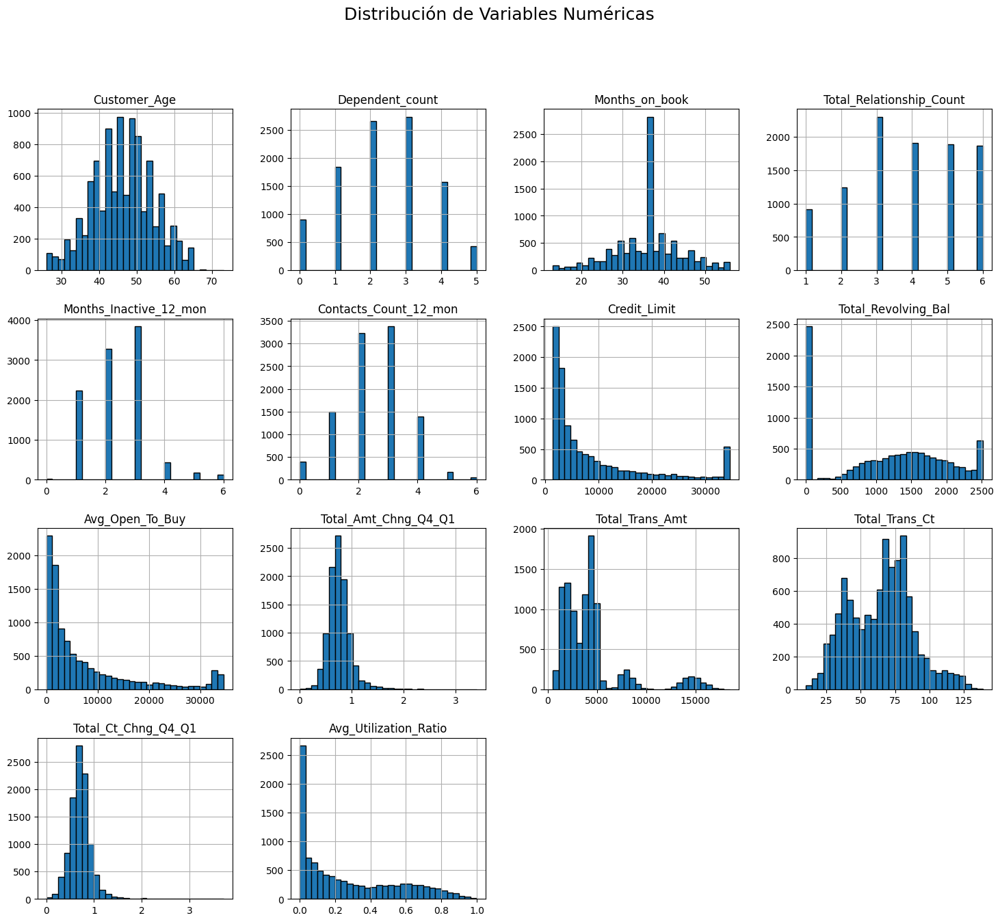

In [ ]:
banco_codi[varNumericas].hist(bins=30, figsize=(18, 15), edgecolor='black')
plt.suptitle("Distribución de Variables Numéricas", fontsize=18)
plt.show()

In [ ]:
# Extraer mínimos y máximos de cada variable numérica
min_max = banco_codi[varNumericas].agg(['min', 'max']).T

min_max.columns = ['Valor mínimo', 'Valor máximo']

print("Valores mínimos y máximos por variable:")
display(min_max)


Valores mínimos y máximos por variable:


,Valor mínimo,Valor máximo
Customer_Age,26.0,73.000
Dependent_count,0.0,5.000
Months_on_book,13.0,56.000
Total_Relationship_Count,1.0,6.000
Months_Inactive_12_mon,0.0,6.000
Contacts_Count_12_mon,0.0,6.000
Credit_Limit,1438.3,34516.000
Total_Revolving_Bal,0.0,2517.000
Avg_Open_To_Buy,3.0,34516.000
Total_Amt_Chng_Q4_Q1,0.0,3.397


In [ ]:
# Revision de valores imputables de las variables

# Conteo de 'Unknown' en todas las columnas
unknown_counts = (banco == "Unknown").sum()

# Filtrar solo las columnas donde existe al menos un 'Unknown'
unknown_counts = unknown_counts[unknown_counts > 0]

print(unknown_counts)

Education_Level    1519
Marital_Status      749
Income_Category    1112
dtype: int64


Columnas no numéricas después de la codificación: Index([], dtype='object')


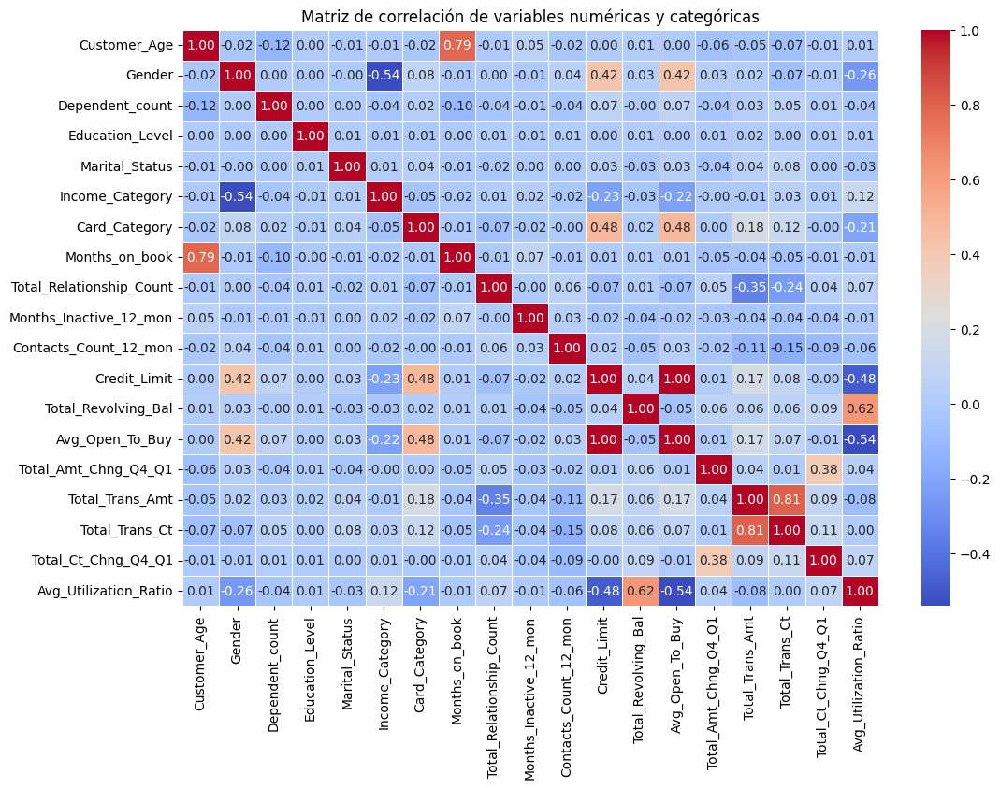

In [ ]:
# Matriz de correlacion de variables para poder realizar la imputacion de datos

from sklearn.preprocessing import LabelEncoder

# Variables a excluir del análisis
exclude_variables = ['Attrition_Flag', 'CLIENTNUM']

# Creamos una copia del dataframe sin las variables a excluir
banco_codi_filtered = banco_codi.drop(columns=exclude_variables, errors='ignore')

# Identificamos todas las columnas categóricas
categorical_cols = banco_codi_filtered.select_dtypes(include=['object']).columns

# Codificamos todas las columnas categóricas con LabelEncoder
le = LabelEncoder()
for col in categorical_cols:
    banco_codi_filtered[col] = le.fit_transform(banco_codi_filtered[col].astype(str))

# Verificamos si todas las columnas ahora son numéricas
non_numeric_cols = banco_codi_filtered.select_dtypes(exclude=[np.number]).columns
print("Columnas no numéricas después de la codificación:", non_numeric_cols)

# Matriz de correlacion
corr_matrix = banco_codi_filtered.corr()

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Matriz de correlación de variables numéricas y categóricas")
plt.show()



Variables correlacionadas con Education_Code:
Variable             Correlación
--------------------------------
Total_Trans_Amt          0.0153 (directa)
Marital_Code             0.0147 (directa)
Total_Relationship_Count     0.0096 (directa)
Contacts_Count_12_mon     0.0085 (directa)
Total_Revolving_Bal      0.0080 (directa)
Total_Ct_Chng_Q4_Q1      0.0073 (directa)
Avg_Utilization_Ratio     0.0065 (directa)
Total_Amt_Chng_Q4_Q1     0.0055 (directa)
Months_Inactive_12_mon    -0.0081 (inversa)
Income_Code             -0.0104 (inversa)

Variables correlacionadas con Marital_Code:
Variable             Correlación
--------------------------------
Total_Trans_Ct           0.0759 (directa)
Total_Trans_Amt          0.0446 (directa)
Avg_Open_To_Buy          0.0336 (directa)
Credit_Limit             0.0313 (directa)
Education_Code           0.0147 (directa)
Income_Code              0.0097 (directa)
Customer_Age            -0.0113 (inversa)
Months_on_book          -0.0121 (inversa)
Total_Relati

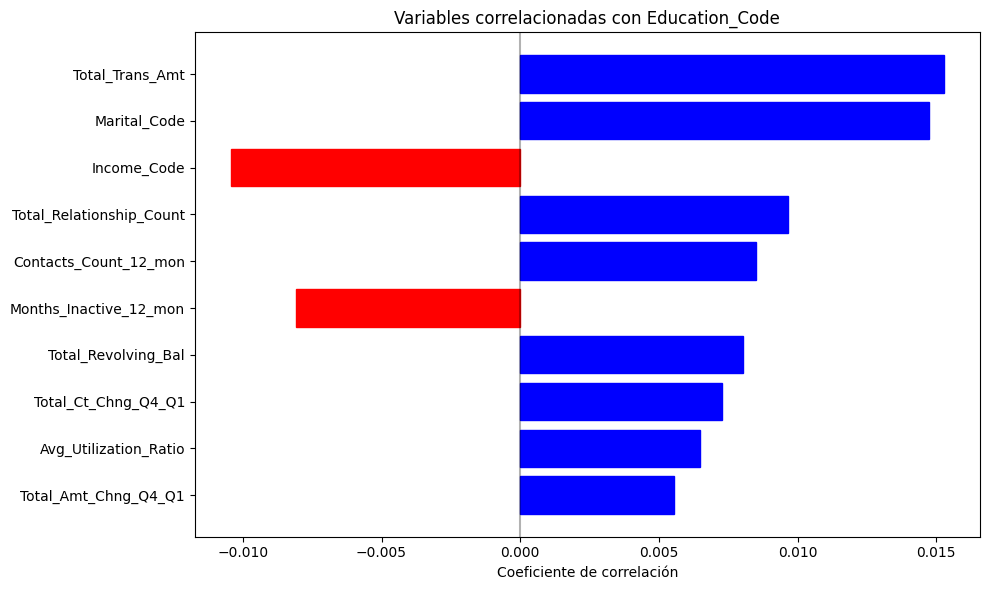

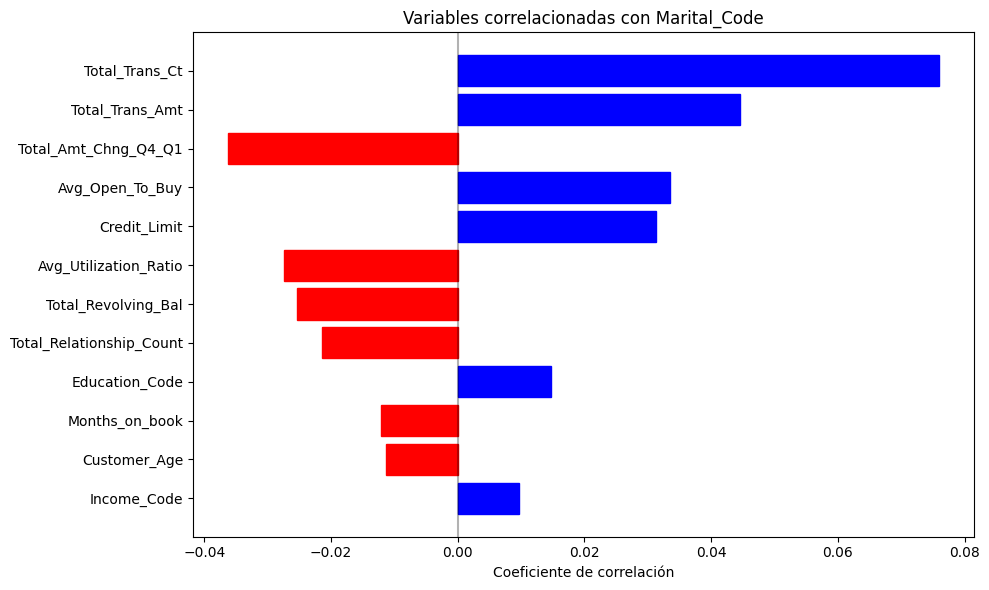

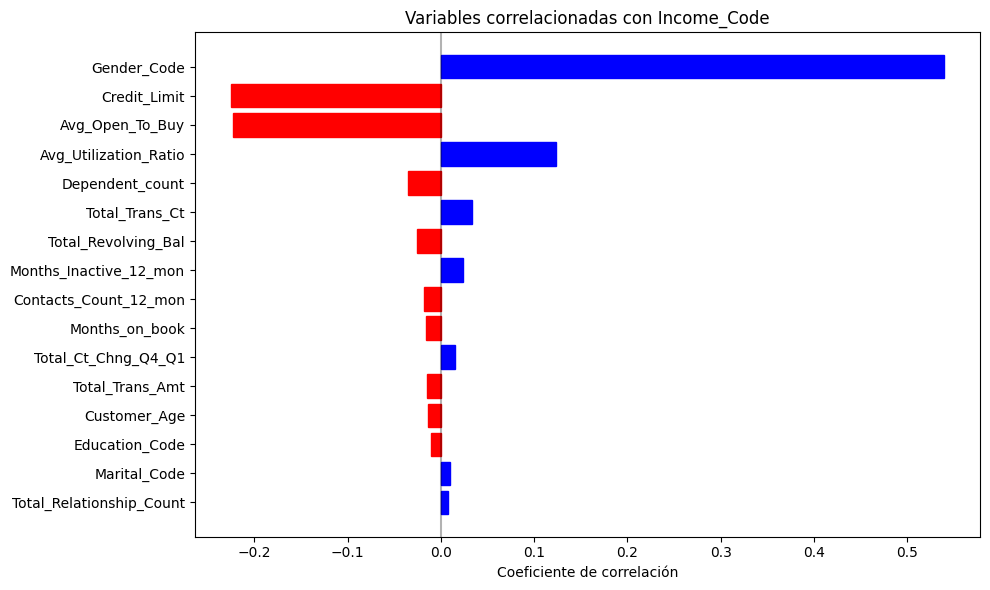

In [ ]:
# categóricas
target_variables_original = ['Education_Level', 'Marital_Status', 'Income_Category']

# Variables a excluir del análisis
exclude_variables = ['Attrition_Flag', 'CLIENTNUM']

# Copia del dataframe sin variables excluidas
banco_codi_filtered = banco_codi.drop(columns=exclude_variables, errors='ignore')

# Codificación de variables categóricas necesarias
# Codificamos 'Gender' como binaria
banco_codi_filtered['Gender_Code'] = banco_codi_filtered['Gender'].map({'M': 0, 'F': 1})

# Codificamos variables objetivo como numéricas
banco_codi_filtered['Education_Code'] = banco_codi_filtered['Education_Level'].astype('category').cat.codes
banco_codi_filtered['Marital_Code'] = banco_codi_filtered['Marital_Status'].astype('category').cat.codes
banco_codi_filtered['Income_Code'] = banco_codi_filtered['Income_Category'].astype('category').cat.codes

# Redefinimos las variables objetivo ya codificadas
target_variables = ['Education_Code', 'Marital_Code', 'Income_Code']

# Filtramos solo columnas numéricas para la correlación
banco_numeric = banco_codi_filtered.select_dtypes(include='number')

# Calculamos la matriz de correlación
corr_matrix = banco_numeric.corr()

# Definimos umbral de correlación
threshold = 0.005

# Diccionario para almacenar correlaciones
correlated_vars = {}

# Análisis de correlación por variable objetivo
for target in target_variables:
    correlations = corr_matrix[target].sort_values(ascending=False)
    strong_correlations = correlations[(correlations.abs() > threshold) & (correlations.index != target)]
    correlated_vars[target] = strong_correlations

    print(f"\nVariables correlacionadas con {target}:")
    print(f"{'Variable':<20} {'Correlación':>10}")
    print("-" * 32)
    for var, corr in strong_correlations.items():
        tipo = "directa" if corr > 0 else "inversa"
        print(f"{var:<20} {corr:>10.4f} ({tipo})")

# Visualización de correlaciones
for target in target_variables:
    plt.figure(figsize=(10, 6))
    corr_vars = correlated_vars[target]

    if len(corr_vars) > 0:
        corr_vars = corr_vars.reindex(corr_vars.abs().sort_values().index)
        bars = plt.barh(corr_vars.index, corr_vars.values)

        for i, bar in enumerate(bars):
            bar.set_color('red' if corr_vars.values[i] < 0 else 'blue')

        plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
        plt.title(f'Variables correlacionadas con {target}')
        plt.xlabel('Coeficiente de correlación')
        plt.tight_layout()
        plt.show()
    else:
        print(f"No hay variables correlacionadas con {target} por encima del umbral {threshold}")


**Imputación de datos de variables categóricas**

Se realizará imputación para las siguientes variables categóricas codificadas con valores faltantes o inconsistentes:

- `Education_Code`
- `Marital_Code`
- `Income_Code`

El valor a imputar será `"Unknown"`. Para mejorar la precisión del proceso, se utilizarán variables predictoras seleccionadas según su correlación, considerando valores absolutos mayores a 0.005.

---

Variables correlacionadas con `Education_Code`

| Variable                 | Correlación | Tipo     |
|--------------------------|-------------|----------|
| Total_Trans_Amt          | 0.0153      | Directa  |
| Marital_Code             | 0.0147      | Directa  |
| Total_Relationship_Count | 0.0096      | Directa  |
| Contacts_Count_12_mon    | 0.0085      | Directa  |
| Total_Revolving_Bal      | 0.0080      | Directa  |
| Total_Ct_Chng_Q4_Q1      | 0.0073      | Directa  |
| Avg_Utilization_Ratio    | 0.0065      | Directa  |
| Total_Amt_Chng_Q4_Q1     | 0.0055      | Directa  |
| Months_Inactive_12_mon   | -0.0081     | Inversa  |
| Income_Code              | -0.0104     | Inversa  |

---

Variables correlacionadas con `Marital_Code`

| Variable                 | Correlación | Tipo     |
|--------------------------|-------------|----------|
| Total_Trans_Ct           | 0.0759      | Directa  |
| Total_Trans_Amt          | 0.0446      | Directa  |
| Avg_Open_To_Buy          | 0.0336      | Directa  |
| Credit_Limit             | 0.0313      | Directa  |
| Education_Code           | 0.0147      | Directa  |
| Income_Code              | 0.0097      | Directa  |
| Customer_Age             | -0.0113     | Inversa  |
| Months_on_book           | -0.0121     | Inversa  |
| Total_Relationship_Count | -0.0214     | Inversa  |
| Total_Revolving_Bal      | -0.0254     | Inversa  |
| Avg_Utilization_Ratio    | -0.0275     | Inversa  |
| Total_Amt_Chng_Q4_Q1     | -0.0362     | Inversa  |

---

Variables correlacionadas con `Income_Code`

| Variable                 | Correlación | Tipo     |
|--------------------------|-------------|----------|
| Gender_Code              | 0.5397      | Directa  |
| Avg_Utilization_Ratio    | 0.1233      | Directa  |
| Total_Trans_Ct           | 0.0335      | Directa  |
| Months_Inactive_12_mon   | 0.0240      | Directa  |
| Total_Ct_Chng_Q4_Q1      | 0.0149      | Directa  |
| Marital_Code             | 0.0097      | Directa  |
| Total_Relationship_Count | 0.0081      | Directa  |
| Education_Code           | -0.0104     | Inversa  |
| Customer_Age             | -0.0135     | Inversa  |
| Total_Trans_Amt          | -0.0147     | Inversa  |
| Months_on_book           | -0.0164     | Inversa  |
| Contacts_Count_12_mon    | -0.0184     | Inversa  |
| Total_Revolving_Bal      | -0.0258     | Inversa  |
| Dependent_count          | -0.0354     | Inversa  |
| Avg_Open_To_Buy          | -0.2230     | Inversa  |
| Credit_Limit             | -0.2254     | Inversa  |

---

Estas correlaciones serán utilizadas como variables predictoras para realizar el proceso de imputación de datos categóricos, priorizando aquellas con mayor impacto explicativo.



**Proceso de imputacion de las variables que contienen "*Unknown*"**

In [ ]:
# Librerias para imputacion de datos
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Copia del DataFrame original
work = banco.copy()

In [ ]:
# Configuración de variables
exclude_vars = ['Attrition_Flag', 'CLIENTNUM']

# Categóricas
cat_cols_all = ['Education_Level', 'Marital_Status', 'Income_Category', 'Gender', 'Card_Category']

# Variables a imputar "Unknown"
cat_targets = ['Education_Level', 'Marital_Status', 'Income_Category']

# Variables numéricas
num_cols_for_knn = [
    'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'
]

# Mapa de predictores por cada objetivo a partir del mapa de correlación
predictors_by_target = {
    'Education_Level': [
        'Total_Trans_Amt',
        'Total_Relationship_Count',
        'Contacts_Count_12_mon',
        'Total_Revolving_Bal',
        'Total_Ct_Chng_Q4_Q1',
        'Avg_Utilization_Ratio',
        'Total_Amt_Chng_Q4_Q1',
        'Months_Inactive_12_mon'
    ],
    'Marital_Status': [
        'Total_Trans_Ct',
        'Total_Trans_Amt',
        'Avg_Open_To_Buy',
        'Credit_Limit',
        'Customer_Age',
        'Months_on_book',
        'Total_Relationship_Count',
        'Total_Revolving_Bal',
        'Avg_Utilization_Ratio',
        'Total_Amt_Chng_Q4_Q1'
    ],
    'Income_Category': [
        'Avg_Utilization_Ratio',
        'Total_Trans_Ct',
        'Months_Inactive_12_mon',
        'Total_Ct_Chng_Q4_Q1',
        'Total_Relationship_Count',
        'Customer_Age',
        'Total_Trans_Amt',
        'Months_on_book',
        'Contacts_Count_12_mon',
        'Total_Revolving_Bal',
        'Dependent_count',
        'Avg_Open_To_Buy',
        'Credit_Limit',
        'Gender_Code'
    ]
}


In [ ]:
# Codificar 'Gender' como binaria
if 'Gender' in work.columns:
    work['Gender_Code'] = work['Gender'].map({'M': 1, 'F': 0})


In [ ]:
# Reemplazar "Unknown" por NaN para imputación
for col in cat_targets:
    work[col] = work[col].replace("Unknown", np.nan)

In [ ]:
# Imputación supervisada con RandomForestClassifier
label_encoders = {}
imputadores = {}

for target in cat_targets:
    predictors = predictors_by_target[target]

    # Reemplazar Unknown por NaN
    work[target] = work[target].replace("Unknown", np.nan)

    # Filtrar registros con y sin NaN
    df_train = work[work[target].notna()]
    df_pred = work[work[target].isna()]

    # Si no hay nada que imputar, saltar
    if df_pred.empty:
        print(f"{target}: no hay valores a imputar, se omite.")
        continue

    # Codificar variable objetivo
    le = LabelEncoder()
    y_train = le.fit_transform(df_train[target])
    label_encoders[target] = le

    # Entrenar modelo
    X_train = df_train[predictors]
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Predecir valores faltantes
    X_pred = df_pred[predictors]
    y_pred = model.predict(X_pred)
    imputados = le.inverse_transform(y_pred)

    # Asignar valores imputados
    work.loc[work[target].isna(), target] = imputados
    imputadores[target] = model



In [ ]:
# Validacion de valores faltantes
for col in cat_targets:
    unknown_count = (work[col] == "Unknown").sum()
    nan_count = work[col].isna().sum()
    print(f"{col} → Unknown imputado: {unknown_count} | NaN restantes: {nan_count}")


Education_Level → Unknown imputado: 0 | NaN restantes: 0
Marital_Status → Unknown imputado: 0 | NaN restantes: 0
Income_Category → Unknown imputado: 0 | NaN restantes: 0


In [ ]:
work.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_Code
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,769911858,Existing Customer,40,F,4,High School,Married,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [ ]:
# Revision de 'Unknown' dentro las las variables objetivos
valores_unicos = {
    var: sorted(work[var].dropna().unique().tolist())
    for var in cat_targets
}
for var, valores in valores_unicos.items():
    print(f"{var}:")
    for val in valores:
        print(f"  - {val}")
    print()

Education_Level:
  - College
  - Doctorate
  - Graduate
  - High School
  - Post-Graduate
  - Uneducated

Marital_Status:
  - Divorced
  - Married
  - Single

Income_Category:
  - $120K +
  - $40K - $60K
  - $60K - $80K
  - $80K - $120K
  - Less than $40K



In [ ]:
# Eliminar la columna Gender_Code de work
work = work.drop(columns=['Gender_Code'], errors='ignore')


In [ ]:
# Proceso de codificacion de variables

# Codificacion Label Encoding manual de variables categoricas

# Realizamos una copia
work_codificado = work.copy()

codificacion_categoricas = {
    'Attrition_Flag': {
        'Attrited Customer': 0,
        'Existing Customer': 1
    },
    'Gender': {
        'F': 1,  # Femenino
        'M': 0   # Masculino
    },
    'Education_Level': {
        'College': 0,
        'Doctorate': 1,
        'Graduate': 2,
        'High School': 3,
        'Post-Graduate': 4,
        'Uneducated': 5
    },
    'Marital_Status': {
        'Divorced': 0,
        'Married': 1,
        'Single': 2
    },
    'Income_Category': {
        '$120K +': 0,
        '$40K - $60K': 1,
        '$60K - $80K': 2,
        '$80K - $120K': 3,
        'Less than $40K': 4
    },
    'Card_Category': {
        'Blue': 0,
        'Gold': 1,
        'Platinum': 2,
        'Silver': 3
    }
}

In [ ]:
# Aplicar codificación categórica
for col, mapping in codificacion_categoricas.items():
    work_codificado[col] = work_codificado[col].map(mapping)

**Binning de VarNumericas**

| Variable                   | Bin 1                          | Bin 2                            | Bin 3                            | Bin 4                            |
|----------------------------|--------------------------------|----------------------------------|----------------------------------|----------------------------------|
| Customer_Age               | 0–19 → Joven                   | 20–38 → Adulto joven             | 39–57 → Adulto                   | ≥58 → Adulto mayor               |
| Dependent_count            | 0–2 → Sin/pocos dependientes   | 3–4 → Familia pequeña            | 5–6 → Familia mediana            | ≥7 → Familia numerosa            |
| Months_on_book             | 0–15 → Cliente nuevo           | 16–30 → Relación media           | 31–45 → Cliente consolidado      | ≥46 → Cliente histórico          |
| Total_Relationship_Count   | 0–2 → Poca vinculación         | 3–4 → Relación moderada          | 5–6 → Relación consolidada       | ≥7 → Relación intensiva / full   |
| Months_Inactive_12_mon     | 0–2 → Inactividad baja         | 3–4 → Inactividad moderada       | 5–6 → Inactividad alta           | ≥7 → Inactividad crítica         |
| Contacts_Count_12_mon      | 0–2 → Seguimiento bajo         | 3–4 → Seguimiento moderado       | 5–6 → Seguimiento alto           | ≥7 → Seguimiento intensivo       |
| Credit_Limit               | 0–8750 → Límite bajo           | 8751–17500 → Límite medio        | 17501–26250 → Límite alto        | ≥26251 → Límite premium          |
| Total_Revolving_Bal        | 0–630 → Saldo bajo             | 631–1260 → Saldo medio           | 1261–1890 → Saldo alto           | ≥1891 → Saldo elevado            |
| Avg_Open_To_Buy            | 0–8750 → Capacidad baja        | 8751–17500 → Capacidad media     | 17501–26250 → Capacidad alta     | ≥26251 → Capacidad premium       |
| Total_Amt_Chng_Q4_Q1       | 0–0.85 → Cambio leve           | 0.86–1.7 → Cambio moderado       | 1.8–2.55 → Cambio alto           | ≥2.56 → Cambio muy alto          |
| Total_Trans_Amt            | 0–5000 → Volumen bajo          | 5001–10000 → Volumen medio       | 10001–15000 → Volumen alto       | ≥15001 → Volumen muy alto        |
| Total_Trans_Ct             | 0–35 → Pocas transacciones     | 36–70 → Frecuencia media         | 71–105 → Frecuencia alta         | ≥106 → Frecuencia intensiva      |
| Total_Ct_Chng_Q4_Q1        | 0–0.95 → Cambio leve           | 0.96–1.9 → Cambio moderado       | 2.0–2.85 → Cambio alto           | ≥2.86 → Cambio muy alto          |
| Avg_Utilization_Ratio      | 0–0.25 → Baja utilización      | 0.26–0.5 → Uso moderado          | 0.51–0.76 → Uso alto             | ≥0.77 → Uso intensivo            |


In [ ]:
# Diccionario de binning numérico (rangos → 1, 2, 3, 4)

binning_numericas = {
    'Customer_Age': [(0, 19), (20, 38), (39, 57), (58, np.inf)],
    'Dependent_count': [(0, 2), (3, 4), (5, 6), (7, np.inf)],
    'Months_on_book': [(0, 15), (16, 30), (31, 45), (46, np.inf)],
    'Total_Relationship_Count': [(0, 2), (3, 4), (5, 6), (7, np.inf)],
    'Months_Inactive_12_mon': [(0, 2), (3, 4), (5, 6), (7, np.inf)],
    'Contacts_Count_12_mon': [(0, 2), (3, 4), (5, 6), (7, np.inf)],
    'Credit_Limit': [(0, 8750), (8751, 17500), (17501, 26250), (26251, np.inf)],
    'Total_Revolving_Bal': [(0, 630), (631, 1260), (1261, 1890), (1891, np.inf)],
    'Avg_Open_To_Buy': [(0, 8750), (8751, 17500), (17501, 26250), (26251, np.inf)],
    'Total_Amt_Chng_Q4_Q1': [(0, 0.85), (0.86, 1.7), (1.8, 2.55), (2.56, np.inf)],
    'Total_Trans_Amt': [(0, 5000), (5001, 10000), (10001, 15000), (15001, np.inf)],
    'Total_Trans_Ct': [(0, 35), (36, 70), (71, 105), (106, np.inf)],
    'Total_Ct_Chng_Q4_Q1': [(0, 0.95), (0.96, 1.9), (2.0, 2.85), (2.86, np.inf)],
    'Avg_Utilization_Ratio': [(0, 0.25), (0.26, 0.5), (0.51, 0.76), (0.77, np.inf)]
}


In [ ]:
# Aplicar binning
for col, rangos in binning_numericas.items():
    # Extraer límites
    limites = [r[0] for r in rangos] + [rangos[-1][1]]
    etiquetas = [1, 2, 3, 4]  # ordinales
    work_codificado[col] = pd.cut(
        work_codificado[col],
        bins=limites,
        labels=etiquetas,
        include_lowest=True,
        right=False
    ).astype(int)

In [ ]:
work_codificado.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,1,3,0,2,3,1,2,0,3,...,1,2,2,2,2,2,1,2,2,1
1,818770008,1,3,1,3,2,2,4,0,3,...,1,1,1,2,1,2,1,1,4,1
2,713982108,1,3,0,2,2,1,3,0,3,...,1,1,1,1,1,4,1,1,3,1
3,769911858,1,3,1,2,3,1,4,0,3,...,2,1,1,4,1,2,1,1,3,3
4,709106358,1,3,0,2,5,1,2,0,2,...,1,1,1,1,1,3,1,1,3,1


In [ ]:
print(work_codificado['Customer_Age'].value_counts().sort_index())


Customer_Age
2    1703
3    7578
4     846
Name: count, dtype: int64


In [ ]:
# Para realizar los analisis univariado vamos a crear una copia para revirtir el proceso anterior de coding y binning


# Copia del DataFrame codificado
univariado = work_codificado.copy()

# Diccionarios inversos para categóricas
map_categoricas_inv = {
    'Attrition_Flag': {0: 'Attrited Customer', 1: 'Existing Customer'},
    'Gender': {1: 'F', 0: 'M'},
    'Education_Level': {
        0: 'College', 1: 'Doctorate', 2: 'Graduate',
        3: 'High School', 4: 'Post-Graduate', 5: 'Uneducated'
    },
    'Marital_Status': {0: 'Divorced', 1: 'Married', 2: 'Single'},
    'Income_Category': {
        0: '$120K +', 1: '$40K - $60K', 2: '$60K - $80K',
        3: '$80K - $120K', 4: 'Less than $40K'
    },
    'Card_Category': {0: 'Blue', 1: 'Gold', 2: 'Platinum', 3: 'Silver'}
}

# Diccionarios inversos para numéricas binned
# Diccionarios inversos para numéricas binned (solo etiquetas)
map_binning_inv = {
    'Customer_Age': {
        1: 'Joven',
        2: 'Adulto joven',
        3: 'Adulto',
        4: 'Adulto mayor'
    },
    'Dependent_count': {
        1: 'Sin/pocos dependientes',
        2: 'Familia pequeña',
        3: 'Familia mediana',
        4: 'Familia numerosa'
    },
    'Months_on_book': {
        1: 'Cliente nuevo',
        2: 'Relación media',
        3: 'Cliente consolidado',
        4: 'Cliente histórico'
    },
    'Total_Relationship_Count': {
        1: 'Poca vinculación',
        2: 'Relación moderada',
        3: 'Relación consolidada',
        4: 'Relación intensiva / full'
    },
    'Months_Inactive_12_mon': {
        1: 'Inactividad baja',
        2: 'Inactividad moderada',
        3: 'Inactividad alta',
        4: 'Inactividad crítica'
    },
    'Contacts_Count_12_mon': {
        1: 'Seguimiento bajo',
        2: 'Seguimiento moderado',
        3: 'Seguimiento alto',
        4: 'Seguimiento intensivo'
    },
    'Credit_Limit': {
        1: 'Límite bajo',
        2: 'Límite medio',
        3: 'Límite alto',
        4: 'Límite premium'
    },
    'Total_Revolving_Bal': {
        1: 'Saldo bajo',
        2: 'Saldo medio',
        3: 'Saldo alto',
        4: 'Saldo elevado'
    },
    'Avg_Open_To_Buy': {
        1: 'Capacidad baja',
        2: 'Capacidad media',
        3: 'Capacidad alta',
        4: 'Capacidad premium'
    },
    'Total_Amt_Chng_Q4_Q1': {
        1: 'Cambio leve',
        2: 'Cambio moderado',
        3: 'Cambio alto',
        4: 'Cambio muy alto'
    },
    'Total_Trans_Amt': {
        1: 'Volumen bajo',
        2: 'Volumen medio',
        3: 'Volumen alto',
        4: 'Volumen muy alto'
    },
    'Total_Trans_Ct': {
        1: 'Pocas transacciones',
        2: 'Frecuencia media',
        3: 'Frecuencia alta',
        4: 'Frecuencia intensiva'
    },
    'Total_Ct_Chng_Q4_Q1': {
        1: 'Cambio leve',
        2: 'Cambio moderado',
        3: 'Cambio alto',
        4: 'Cambio muy alto'
    },
    'Avg_Utilization_Ratio': {
        1: 'Baja utilización',
        2: 'Uso moderado',
        3: 'Uso alto',
        4: 'Uso intensivo'
    }
}

# Aplicar mapeos inversos
for col, mapping in map_categoricas_inv.items():
    if col in univariado.columns:
        univariado[col] = univariado[col].map(mapping)

for col, mapping in map_binning_inv.items():
    if col in univariado.columns:
        univariado[col] = univariado[col].map(mapping)


### 2.3. Análisis univariado


In [ ]:
! pip install pywaffle


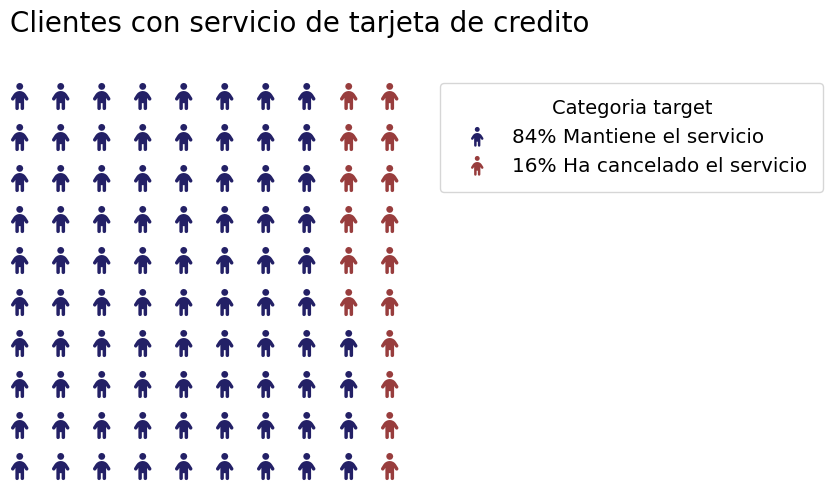

In [ ]:
from pywaffle import Waffle
group_Flag= univariado.groupby('Attrition_Flag')['CLIENTNUM'].count()/len(banco) * 100


data = {'84% Mantiene el servicio': group_Flag[1],'16% Ha cancelado el servicio': group_Flag[0]}
fig = plt.figure(
   FigureClass=Waffle,
    rows=10,
    figsize=(10, 5),
    values=data,
    colors=("#232066", "#983D3D"),
    legend={'loc': 'upper left', 'bbox_to_anchor': (1.04, 1),'borderpad':0.8,
            'fontsize': 12,'title':'Categoria target','fontsize':'x-large','title_fontsize':14
           },
    icons='child', icon_size=20,
    icon_legend=True,
    title = {'label': 'Clientes con servicio de tarjeta de credito \n', 'loc': 'left','fontsize': 20}
)

**Comentario:** De nuestra variable objetivo se observa que el 84% de los clientes dentro de nuestra base de análisis se mantienen dentro del servicio de tarjetas de crédito del banco, mientras que el 16% fuga.

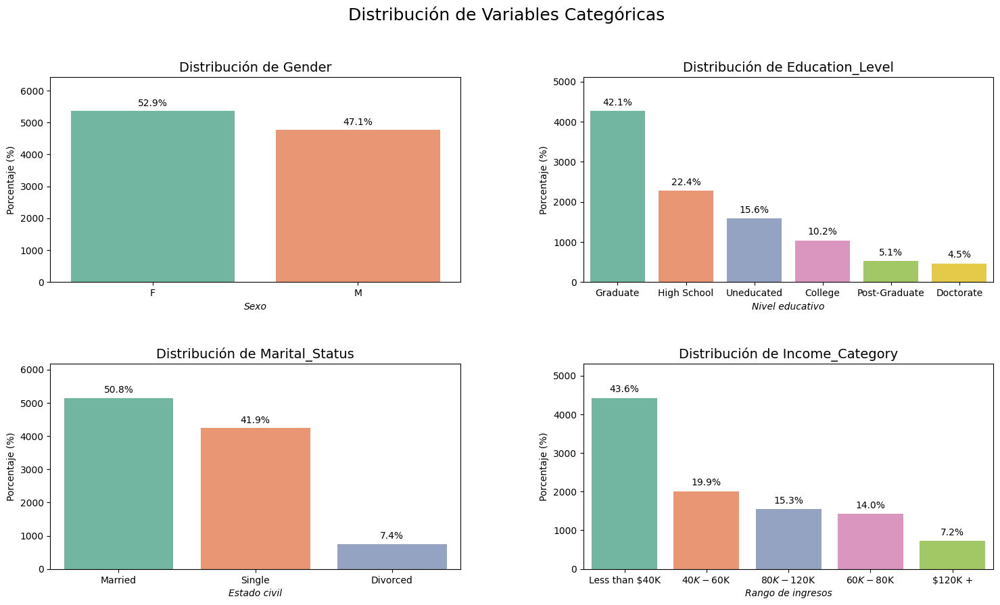

In [ ]:
# Variables categóricas
categorical_vars = ["Gender", "Education_Level", "Marital_Status", "Income_Category"]

# Diccionario de unidades para eje X
x_units_cat = {
    'Gender': 'Sexo',
    'Education_Level': 'Nivel educativo',
    'Marital_Status': 'Estado civil',
    'Income_Category': 'Rango de ingresos'
}

# Crear figura con tamaño ajustado
fig, axes = plt.subplots(2, 2, figsize=(18, 8))
axes = axes.flatten()

# Total de observaciones
total = len(univariado)

# Iterar sobre las variables categóricas y graficar
for i, var in enumerate(categorical_vars):
    ax = axes[i]
    order = univariado[var].value_counts().index
    plot = sns.countplot(
        data=univariado,
        x=var,
        order=order,
        ax=ax,
        palette="Set2"
    )

    # Título principal
    ax.set_title(f"Distribución de {var}", fontsize=14, fontweight="normal")

    # Unidad en cursiva en el eje X
    ax.set_xlabel(f"{x_units_cat[var]}", fontsize=10, style='italic')
    ax.set_ylabel("Porcentaje (%)")
    ax.tick_params(axis='x', rotation=0)
    ax.margins(y=0.2)

    # Añadir los valores en porcentaje encima de cada barra
    for p in plot.patches:
        porcentaje = 100 * p.get_height() / total
        plot.annotate(
            f"{porcentaje:.1f}%",
            (p.get_x() + p.get_width() / 2., p.get_height() + (total * 0.01)),
            ha='center', va='bottom',
            fontsize=10, color="black", fontweight="normal"
        )

# Ajuste de espaciado entre subplots
plt.subplots_adjust(hspace=0.4, wspace=0.3, top=1.02)

# Título general más cercano a las gráficas
plt.suptitle("Distribución de Variables Categóricas", fontsize=18, fontweight="normal", y=1.15)

plt.show()



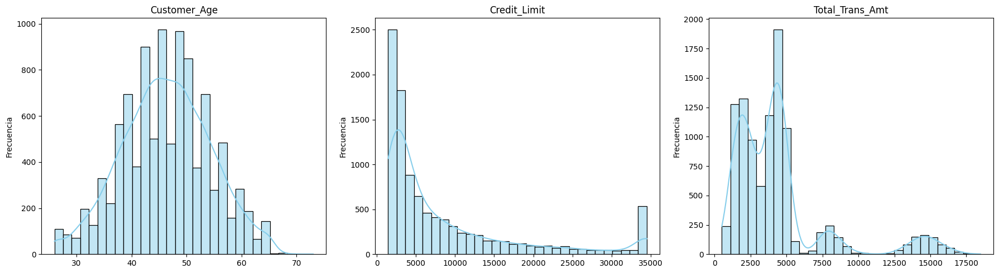

In [ ]:
# Variables numericas

num_vars = ["Customer_Age", "Credit_Limit", "Total_Trans_Amt"]

plt.figure(figsize=(18, 5))

for i, var in enumerate(num_vars, 1):
    plt.subplot(1, 3, i)  # 1 fila, 3 columnas
    sns.histplot(banco_codi[var], bins=30, kde=True, color="skyblue")
    plt.title(var, fontsize=12, fontweight="normal")
    plt.xlabel("")
    plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()


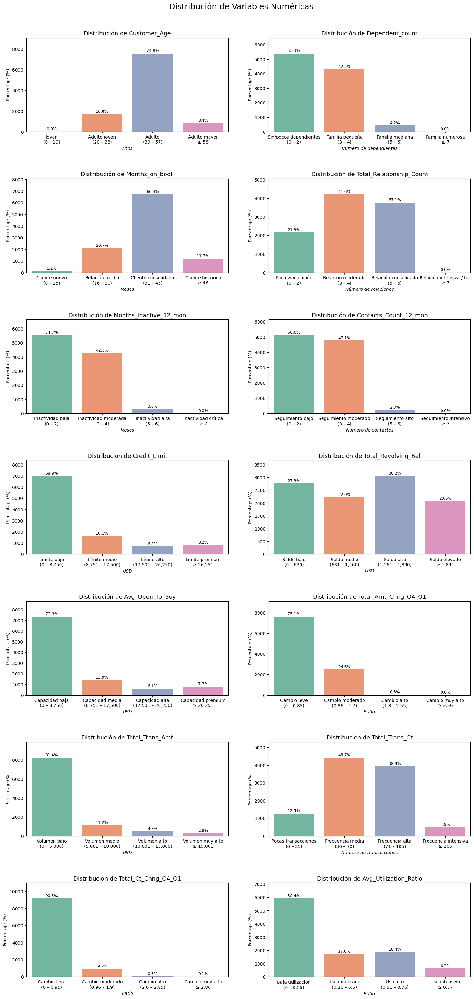

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Variables numéricas binned (texto en work_revertido)
numeric_binned_vars = [
    'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'
]

# Diccionario: etiqueta
bin_ranges = {
    'Customer_Age': {
        'Joven': '(0 – 19)',
        'Adulto joven': '(20 – 38)',
        'Adulto': '(39 – 57)',
        'Adulto mayor': '≥ 58'
    },
    'Dependent_count': {
        'Sin/pocos dependientes': '(0 – 2)',
        'Familia pequeña': '(3 – 4)',
        'Familia mediana': '(5 – 6)',
        'Familia numerosa': '≥ 7'
    },
    'Months_on_book': {
        'Cliente nuevo': '(0 – 15)',
        'Relación media': '(16 – 30)',
        'Cliente consolidado': '(31 – 45)',
        'Cliente histórico': '≥ 46'
    },
    'Total_Relationship_Count': {
        'Poca vinculación': '(0 – 2)',
        'Relación moderada': '(3 – 4)',
        'Relación consolidada': '(5 – 6)',
        'Relación intensiva / full': '≥ 7'
    },
    'Months_Inactive_12_mon': {
        'Inactividad baja': '(0 – 2)',
        'Inactividad moderada': '(3 – 4)',
        'Inactividad alta': '(5 – 6)',
        'Inactividad crítica': '≥ 7'
    },
    'Contacts_Count_12_mon': {
        'Seguimiento bajo': '(0 – 2)',
        'Seguimiento moderado': '(3 – 4)',
        'Seguimiento alto': '(5 – 6)',
        'Seguimiento intensivo': '≥ 7'
    },
    'Credit_Limit': {
        'Límite bajo': '(0 – 8,750)',
        'Límite medio': '(8,751 – 17,500)',
        'Límite alto': '(17,501 – 26,250)',
        'Límite premium': '≥ 26,251'
    },
    'Total_Revolving_Bal': {
        'Saldo bajo': '(0 – 630)',
        'Saldo medio': '(631 – 1,260)',
        'Saldo alto': '(1,261 – 1,890)',
        'Saldo elevado': '≥ 1,891'
    },
    'Avg_Open_To_Buy': {
        'Capacidad baja': '(0 – 8,750)',
        'Capacidad media': '(8,751 – 17,500)',
        'Capacidad alta': '(17,501 – 26,250)',
        'Capacidad premium': '≥ 26,251'
    },
    'Total_Amt_Chng_Q4_Q1': {
        'Cambio leve': '(0 – 0.85)',
        'Cambio moderado': '(0.86 – 1.7)',
        'Cambio alto': '(1.8 – 2.55)',
        'Cambio muy alto': '≥ 2.56'
    },
    'Total_Trans_Amt': {
        'Volumen bajo': '(0 – 5,000)',
        'Volumen medio': '(5,001 – 10,000)',
        'Volumen alto': '(10,001 – 15,000)',
        'Volumen muy alto': '≥ 15,001'
    },
    'Total_Trans_Ct': {
        'Pocas transacciones': '(0 – 35)',
        'Frecuencia media': '(36 – 70)',
        'Frecuencia alta': '(71 – 105)',
        'Frecuencia intensiva': '≥ 106'
    },
    'Total_Ct_Chng_Q4_Q1': {
        'Cambio leve': '(0 – 0.95)',
        'Cambio moderado': '(0.96 – 1.9)',
        'Cambio alto': '(2.0 – 2.85)',
        'Cambio muy alto': '≥ 2.86'
    },
    'Avg_Utilization_Ratio': {
        'Baja utilización': '(0 – 0.25)',
        'Uso moderado': '(0.26 – 0.5)',
        'Uso alto': '(0.51 – 0.76)',
        'Uso intensivo': '≥ 0.77'
    }
}



# Unidades para el eje X
x_units = {
    'Customer_Age': 'Años',
    'Dependent_count': 'Número de dependientes',
    'Months_on_book': 'Meses',
    'Total_Relationship_Count': 'Número de relaciones',
    'Months_Inactive_12_mon': 'Meses',
    'Contacts_Count_12_mon': 'Número de contactos',
    'Credit_Limit': 'USD',
    'Total_Revolving_Bal': 'USD',
    'Avg_Open_To_Buy': 'USD',
    'Total_Amt_Chng_Q4_Q1': 'Ratio',
    'Total_Trans_Amt': 'USD',
    'Total_Trans_Ct': 'Número de transacciones',
    'Total_Ct_Chng_Q4_Q1': 'Ratio',
    'Avg_Utilization_Ratio': 'Ratio'
}

vars_binned = numeric_binned_vars
total = len(univariado)

# Configuración de layout
ncols = 2
nrows = (len(vars_binned) + 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(18, nrows * 5.2))
axes = axes.flatten()

for i, var in enumerate(vars_binned):
    ax = axes[i]

    # Orden fijo de categorías
    categorias = list(bin_ranges[var].keys())
    etiquetas_completas = [f"{cat}\n{bin_ranges[var][cat]}" for cat in categorias]

    # Forzar categorías aunque no existan en los datos
    temp_series = univariado[var].astype(pd.CategoricalDtype(categories=categorias, ordered=True))
    temp_series = temp_series.map(lambda x: f"{x}\n{bin_ranges[var][x]}" if pd.notna(x) else None)

    # Graficar
    sns.countplot(
        x=temp_series,
        order=etiquetas_completas,
        ax=ax,
        palette="Set2"
    )

    # Título principal
    ax.set_title(f"Distribución de {var}", fontsize=13)

    # Unidad en cursiva en el eje X
    ax.set_xlabel(f"{x_units[var]}", fontsize=10, style='italic')
    ax.set_ylabel("Porcentaje (%)")
    ax.tick_params(axis='x', rotation=0)

    # Porcentajes sobre las barras
    counts = temp_series.value_counts().reindex(etiquetas_completas, fill_value=0)
    for j, val in enumerate(counts):
        porcentaje = 100 * val / total
        ax.text(j, val + (max(counts) * 0.02), f"{porcentaje:.1f}%", ha='center', fontsize=9)

    # Ajustar altura del eje Y
    ax.set_ylim(0, max(counts) * 1.2 if max(counts) > 0 else 1)

# Eliminar ejes vacíos si sobran
for k in range(len(vars_binned), len(axes)):
    fig.delaxes(axes[k])

# Espaciado entre gráficas
plt.subplots_adjust(hspace=0.5, wspace=0.2, top=0.92)

# Título general
plt.suptitle("Distribución de Variables Numéricas", fontsize=18, y=0.95)
plt.show()



**Comentarios:**
- La edad promedio de los clientes es de 46 años, sin valores extremos (rango 26–73).  
- La antigüedad con el banco está entre 13 y 56 meses (≈ 1–5 años).  
- El límite de crédito presenta alta dispersión (media ≈ 8,600, rango 1,438–34,516).  
- La utilización promedio del crédito es baja (0.27), con pocos clientes cercanos al 1.  
- El 16% de los clientes canceló su tarjeta, confirmando desbalance de clases.

### 2.4. Análisis bivariado

In [ ]:
demograficas = univariado[['Customer_Age', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Attrition_Flag']]

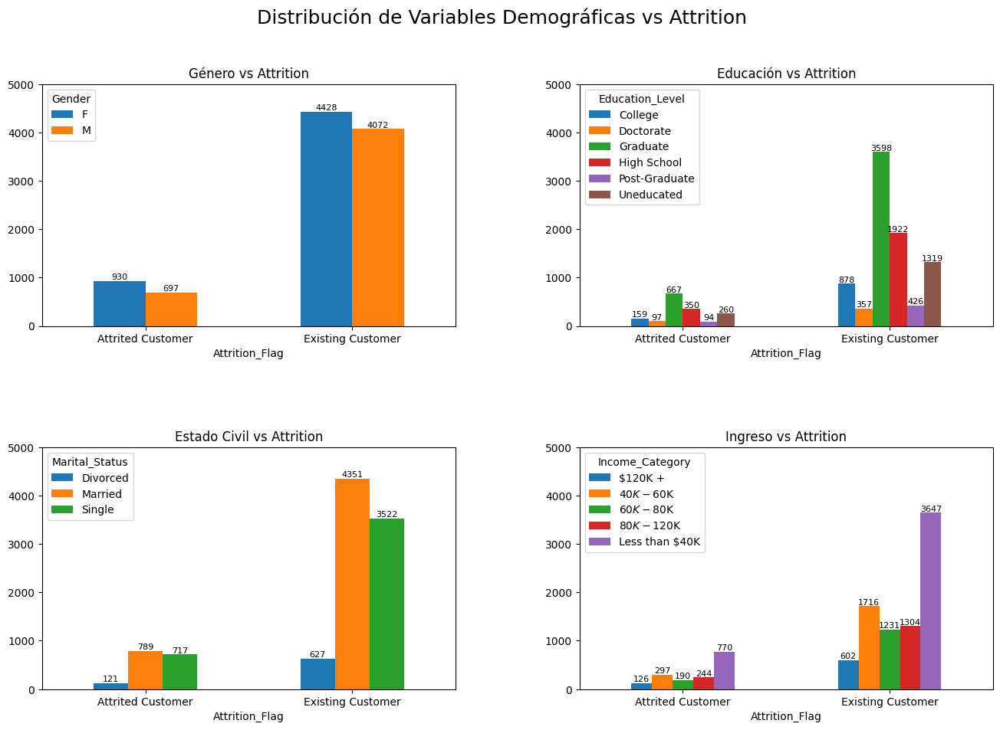

In [ ]:
# Crosstabs por variable demográfica usando 'univariado'
ct_gender = pd.crosstab(univariado['Attrition_Flag'], univariado['Gender'])
ct_edu = pd.crosstab(univariado['Attrition_Flag'], univariado['Education_Level'])
ct_marital = pd.crosstab(univariado['Attrition_Flag'], univariado['Marital_Status'])
ct_income = pd.crosstab(univariado['Attrition_Flag'], univariado['Income_Category'])

# Crear figura con 2 filas y 2 columnas
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))
axes = axes.flatten()

# Función para agregar etiquetas en cada barra
def add_labels(ax):
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=8)

# Gráfico 1: Género
ct_gender.plot(kind='bar', ax=axes[0], ylim=[0, 5000], legend=True, title='Género vs Attrition', rot=0)
add_labels(axes[0])

# Gráfico 2: Nivel educativo
ct_edu.plot(kind='bar', ax=axes[1], ylim=[0, 5000], legend=True, title='Educación vs Attrition', rot=0)
add_labels(axes[1])

# Gráfico 3: Estado civil
ct_marital.plot(kind='bar', ax=axes[2], ylim=[0, 5000], legend=True, title='Estado Civil vs Attrition', rot=0)
add_labels(axes[2])

# Gráfico 4: Categoría de ingreso
ct_income.plot(kind='bar', ax=axes[3], ylim=[0, 5000], legend=True, title='Ingreso vs Attrition', rot=0)
add_labels(axes[3])

# Ajuste de layout
plt.subplots_adjust(hspace=0.5, wspace=0.3, top=0.9)
plt.suptitle("Distribución de Variables Demográficas vs Attrition", fontsize=18, y=1)
plt.show()



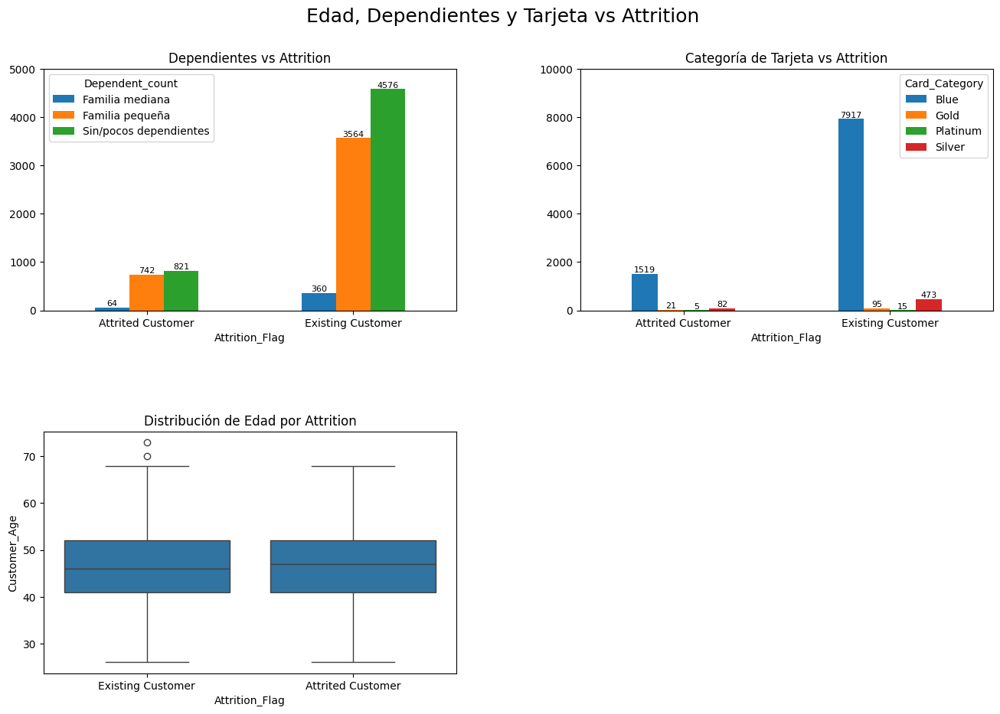

In [ ]:
# Edad y tipo de tarjeta

# Crosstabs
ct_dependents = pd.crosstab(univariado['Attrition_Flag'], univariado['Dependent_count'])
ct_card = pd.crosstab(univariado['Attrition_Flag'], univariado['Card_Category'])

# Crear figura con 2 filas y 2 columnas
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))
axes = axes.flatten()

# Función para agregar etiquetas
def add_labels(ax):
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=8)

# Gráfico 1: Dependientes
ct_dependents.plot(kind='bar', ax=axes[0], ylim=[0, 5000], legend=True, title='Dependientes vs Attrition', rot=0)
add_labels(axes[0])

# Gráfico 2: Categoría de tarjeta
ct_card.plot(kind='bar', ax=axes[1], ylim=[0, 10000], legend=True, title='Categoría de Tarjeta vs Attrition', rot=0)
add_labels(axes[1])

# Gráfico 3: Boxplot de edad usando banco
sns.boxplot(data=work, x='Attrition_Flag', y='Customer_Age', ax=axes[2])
axes[2].set_title('Distribución de Edad por Attrition')
axes[2].tick_params(axis='x', rotation=0)

# Eliminar el subplot vacío si no se usa
fig.delaxes(axes[3])

# Ajuste de layout
plt.subplots_adjust(hspace=0.5, wspace=0.3, top=0.9)
plt.suptitle("Edad, Dependientes y Tarjeta vs Attrition", fontsize=18, y=0.98)
plt.show()



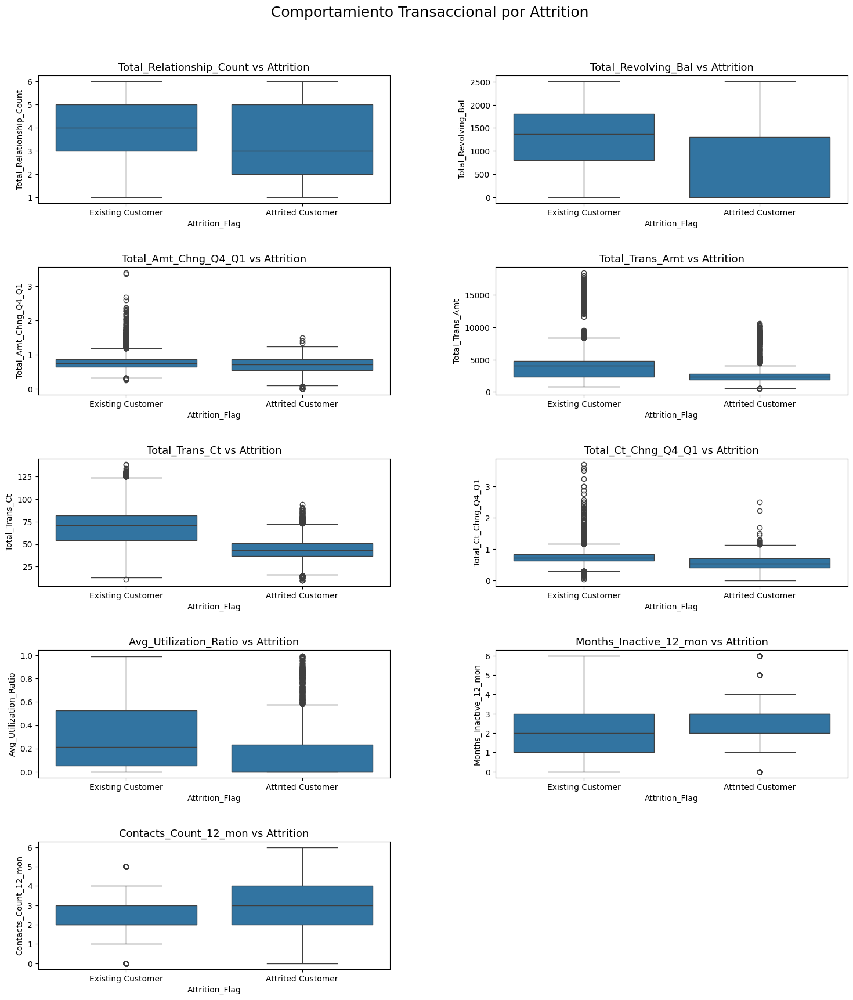

In [ ]:
# Variables a graficar
boxplot_vars = [
    "Total_Relationship_Count", "Total_Revolving_Bal", "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio", "Months_Inactive_12_mon", "Contacts_Count_12_mon"
]

# Layout: 2 columnas, 5 filas
ncols = 2
nrows = (len(boxplot_vars) + 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, nrows * 4))
axes = axes.flatten()

# Graficar cada boxplot
for i, var in enumerate(boxplot_vars):
    sns.boxplot(x="Attrition_Flag", y=var, data=work, ax=axes[i])
    axes[i].set_title(f"{var} vs Attrition", fontsize=13)
    axes[i].tick_params(axis='x', rotation=0)

# Eliminar ejes vacíos si sobran
for j in range(len(boxplot_vars), len(axes)):
    fig.delaxes(axes[j])

# Título general y espaciado
plt.suptitle("Comportamiento Transaccional por Attrition", fontsize=18, y=0.94)
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()



<Axes: xlabel='Customer_Age', ylabel='Total_Trans_Ct'>

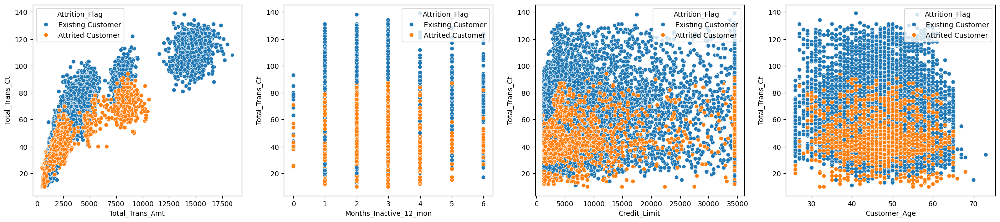

In [ ]:
# Relaciones entre frecuencia y monto transaccional

df_frequency = pd.concat([
    work['Customer_Age'],
    work['Total_Trans_Ct'],
    work['Total_Trans_Amt'],
    work['Months_Inactive_12_mon'],
    work['Credit_Limit'],
    work['Attrition_Flag']], axis=1)

fig, ax = plt.subplots(ncols=4, figsize=(25,5))
sns.scatterplot(data=df_frequency, y="Total_Trans_Ct", x="Total_Trans_Amt", hue="Attrition_Flag", ax=ax[0])
sns.scatterplot(data=df_frequency, y="Total_Trans_Ct", x="Months_Inactive_12_mon", hue="Attrition_Flag", ax=ax[1])
sns.scatterplot(data=df_frequency, y="Total_Trans_Ct", x="Credit_Limit", hue="Attrition_Flag", ax=ax[2])
sns.scatterplot(data=df_frequency, y="Total_Trans_Ct", x="Customer_Age", hue="Attrition_Flag", ax=ax[3])


In [ ]:
# Lista de variables categóricas
categoricas = ['Gender', 'Marital_Status', 'Education_Level', 'Income_Category', 'Card_Category']

# Diccionario para guardar resultados
tablas_categ = {}

for col in categoricas:
    tablas_categ[col] = pd.crosstab(work[col], work['Attrition_Flag'], normalize='index')*100

# Mostrar resultados
for col, tabla in tablas_categ.items():
    print(f"\nDistribución de {col} según Attrition_Flag:")
    print(tabla.round(2))


Distribución de Gender según Attrition_Flag:
Attrition_Flag  Attrited Customer  Existing Customer
Gender                                              
F                           17.36              82.64
M                           14.62              85.38

Distribución de Marital_Status según Attrition_Flag:
Attrition_Flag  Attrited Customer  Existing Customer
Marital_Status                                      
Divorced                    16.18              83.82
Married                     15.35              84.65
Single                      16.91              83.09

Distribución de Education_Level según Attrition_Flag:
Attrition_Flag   Attrited Customer  Existing Customer
Education_Level                                      
College                      15.33              84.67
Doctorate                    21.37              78.63
Graduate                     15.64              84.36
High School                  15.40              84.60
Post-Graduate                18.08          

In [ ]:
# Agrupamos por Attrition_Flag y sacamos estadísticas del Credit_Limit
credit_limit_stats = work.groupby("Attrition_Flag")["Credit_Limit"].describe()

# También calculamos el promedio y mediana para resumir
credit_limit_mean = work.groupby("Attrition_Flag")["Credit_Limit"].mean()
credit_limit_median = work.groupby("Attrition_Flag")["Credit_Limit"].median()

print("Estadísticas de Credit_Limit según Attrition_Flag:\n")
print(credit_limit_stats)
print("\nPromedio del Credit_Limit por grupo:\n", credit_limit_mean)
print("\nMediana del Credit_Limit por grupo:\n", credit_limit_median)



Estadísticas de Credit_Limit según Attrition_Flag:

                    count         mean          std     min     25%     50%  \
Attrition_Flag                                                                
Attrited Customer  1627.0  8136.039459  9095.334105  1438.3  2114.0  4178.0   
Existing Customer  8500.0  8726.877518  9084.969807  1438.3  2602.0  4643.5   

                        75%      max  
Attrition_Flag                        
Attrited Customer   9933.50  34516.0  
Existing Customer  11252.75  34516.0  

Promedio del Credit_Limit por grupo:
 Attrition_Flag
Attrited Customer    8136.039459
Existing Customer    8726.877518
Name: Credit_Limit, dtype: float64

Mediana del Credit_Limit por grupo:
 Attrition_Flag
Attrited Customer    4178.0
Existing Customer    4643.5
Name: Credit_Limit, dtype: float64


**Comentarios:**

**1. Género y Attrition_Flag**  
Las mujeres presentan una tasa de cancelación ligeramente mayor (17.36%) que los hombres (14.62%). Esto sugiere que el género podría tener cierta influencia en la retención de clientes, aunque la diferencia no es muy marcada.

**2. Estado civil y Attrition_Flag**  
El grupo de clientes divorciados (16.18%) y solteros (16.94%) muestran mayores niveles de cancelación frente a los casados (15.13%). Los casados parecen ser un segmento más estable, lo que puede estar asociado a mayor estabilidad financiera.

**3. Nivel educativo y Attrition_Flag**  
Los clientes con **Doctorado** presentan la tasa de cancelación más alta (21.06%), seguidos por los de **Post-Graduate** (17.83%). En contraste, clientes con **College** y **High School** registran tasas menores (15.20%). Esto podría indicar que clientes con mayor nivel educativo tienen un perfil más exigente con el servicio bancario.

**4. Categoría de ingresos y Attrition_Flag**  
Los clientes de ingresos más altos '120K +' presentan una tasa de cancelación relativamente elevada (17.33%), mientras que el segmento '60K – 80K' muestra la menor (13.48%). Esto puede reflejar que los clientes de ingresos altos tienen más alternativas financieras y son menos leales.

**5. Tipo de tarjeta y Attrition_Flag**  
Los clientes con tarjeta **Platinum** tienen la tasa de cancelación más elevada (25%), seguidos de **Gold** (18.10%). En cambio, las tarjetas más masivas (**Blue** y **Silver**) presentan cancelaciones menores (16.10% y 14.77% respectivamente). Esto sugiere que incluso clientes premium no necesariamente son los más leales.

**6. Credit Limit y Attrition_Flag**  
- El límite promedio de crédito de los clientes que cancelan es **8136**, mientras que los que permanecen tienen en promedio **8726**.  
- La **mediana** también muestra diferencias: **4178** para los clientes que cancelan frente a **4643.5** en los que permanecen.  
- En general, los clientes con mayor límite de crédito tienden a mantener su relación con el banco, mientras que los que poseen límites más bajos muestran mayor propensión a la cancelación.



### 2.5. Visualización de los datos

En esta sección, realizaremos un análisis exploratorio para identificar relaciones entre las variables del dataset.
Como contamos con datos mixtos (numéricos y categóricos), aplicaremos dos enfoques:

1. Correlación numérica (Pearson): mide la relación lineal entre variables numéricas.

2. Correlación categórica (V de Cramer): mide la asociación entre variables categóricas.

Cramér V (categóricas) vs Attrition_Flag
Income_Category    0.041307
Gender             0.037002
Education_Level    0.035731
Marital_Status     0.020419
Card_Category      0.014853
dtype: float64

Matriz completa Cramér V (categóricas entre sí)
                 Gender  Education_Level  Marital_Status  Income_Category  \
Gender            1.000            0.026           0.014            0.839   
Education_Level   0.026            1.000           0.030            0.024   
Marital_Status    0.014            0.030           1.000            0.021   
Income_Category   0.839            0.024           0.021            1.000   
Card_Category     0.086            0.025           0.041            0.070   
Attrition_Flag    0.037            0.036           0.020            0.041   

                 Card_Category  Attrition_Flag  
Gender                   0.086           0.037  
Education_Level          0.025           0.036  
Marital_Status           0.041           0.020  
Income_Category    

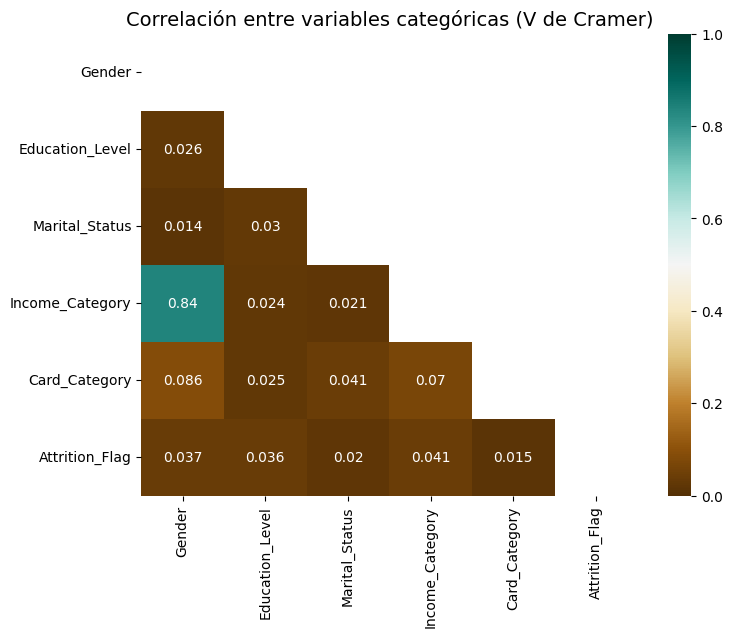

In [ ]:
# Variables categóricas
df_categorical = work[['Gender', 'Education_Level', 'Marital_Status',
                        'Income_Category','Card_Category','Attrition_Flag']]

# Codificación numérica
from sklearn import preprocessing
label = preprocessing.LabelEncoder()
df_categorical_encoded = pd.DataFrame()

for col in df_categorical.columns:
    df_categorical_encoded[col] = label.fit_transform(df_categorical[col])

# Función Cramér V
from scipy.stats import chi2_contingency
import numpy as np

def cramers_V(var1, var2):
    crosstab = np.array(pd.crosstab(var1, var2))
    stat = chi2_contingency(crosstab)[0]
    n = crosstab.sum()
    k = min(crosstab.shape) - 1
    return (stat / (n * k))**0.5

# 1) Correlación contra Attrition_Flag
cramer_vs_attrition = {}
for col in df_categorical_encoded.columns:
    if col != "Attrition_Flag":
        cramer_vs_attrition[col] = cramers_V(df_categorical_encoded[col],
                                             df_categorical_encoded["Attrition_Flag"])

print("Cramér V (categóricas) vs Attrition_Flag")
print(pd.Series(cramer_vs_attrition).sort_values(ascending=False))

# 2) Matriz completa
rows = []
for var1 in df_categorical_encoded:
    col = []
    for var2 in df_categorical_encoded:
        col.append(round(cramers_V(df_categorical_encoded[var1],
                                   df_categorical_encoded[var2]), 3))
    rows.append(col)

cramerv_matrix = pd.DataFrame(rows,
                              columns=df_categorical_encoded.columns,
                              index=df_categorical_encoded.columns)

print("\nMatriz completa Cramér V (categóricas entre sí)")
print(cramerv_matrix)

# Heatmap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
mask = np.triu(np.ones_like(cramerv_matrix, dtype=bool))
sns.heatmap(cramerv_matrix, mask=mask, annot=True, cmap="BrBG", vmin=0, vmax=1)
plt.title("Correlación entre variables categóricas (V de Cramer)", fontsize=14)
plt.show()


Correlación Pearson: numéricas vs Attrition_Flag_Binary (1=Existing, 0=Attrited)
Total_Trans_Ct              0.371403
Total_Ct_Chng_Q4_Q1         0.290054
Total_Revolving_Bal         0.263053
Avg_Utilization_Ratio       0.178410
Total_Trans_Amt             0.168598
Total_Relationship_Count    0.150005
Total_Amt_Chng_Q4_Q1        0.131063
Credit_Limit                0.023873
Avg_Open_To_Buy             0.000285
Months_on_book             -0.013687
Customer_Age               -0.018203
Dependent_count            -0.018991
Months_Inactive_12_mon     -0.152449
Contacts_Count_12_mon      -0.204491
Name: Attrition_Flag_Binary, dtype: float64

Top 5 positivas con el target:
Total_Trans_Ct           0.371403
Total_Ct_Chng_Q4_Q1      0.290054
Total_Revolving_Bal      0.263053
Avg_Utilization_Ratio    0.178410
Total_Trans_Amt          0.168598
Name: Attrition_Flag_Binary, dtype: float64

Top 5 negativas con el target:
Contacts_Count_12_mon    -0.204491
Months_Inactive_12_mon   -0.152449
Dependent

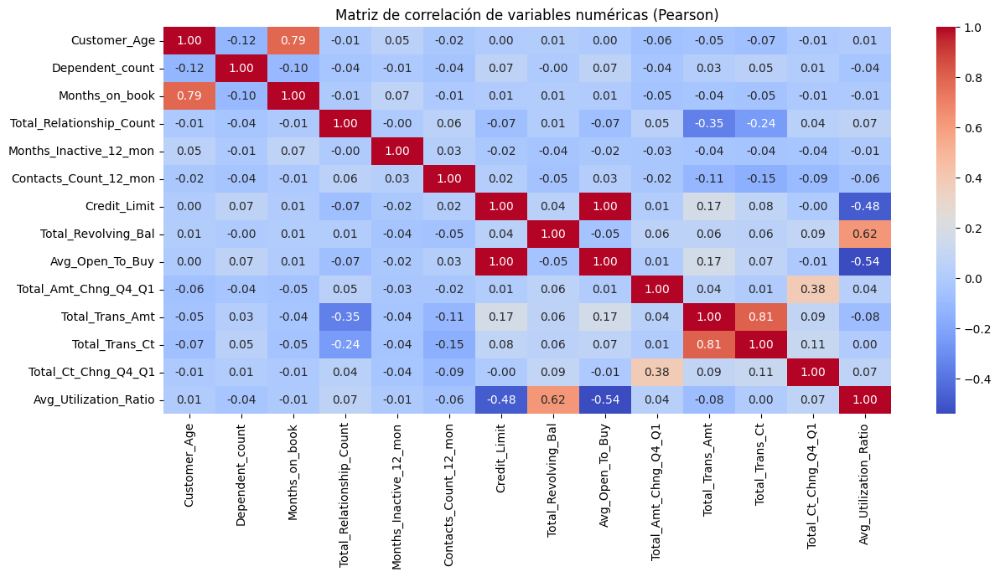

In [ ]:
# Crear copia del dataframe original
work_corr = work.copy()

# Crear variable binaria del target (si no existe)
# 1 = Existing Customer, 0 = Attrited Customer
if "Attrition_Flag_Binary" not in work_corr.columns:
    work_corr["Attrition_Flag_Binary"] = work_corr["Attrition_Flag"].apply(
        lambda x: 1 if x == "Existing Customer" else 0
    )

# Seleccionar solo columnas numéricas (excepto CLIENTNUM)
df_numerical = work_corr.select_dtypes(include=['int64', 'float64']).drop(columns=["CLIENTNUM"], errors="ignore")

# 1) Correlación de cada numérica con el target
pearson_vs_target = df_numerical.corr(method="pearson")["Attrition_Flag_Binary"].drop("Attrition_Flag_Binary")

print("Correlación Pearson: numéricas vs Attrition_Flag_Binary (1=Existing, 0=Attrited)")
print(pearson_vs_target.sort_values(ascending=False))

# 2) Top 5 positivas y negativas
print("\nTop 5 positivas con el target:")
print(pearson_vs_target.sort_values(ascending=False).head(5))

print("\nTop 5 negativas con el target:")
print(pearson_vs_target.sort_values(ascending=True).head(5))

# 3) Matriz interna entre numéricas (sin el target ni CLIENTNUM)
num_corr_internal = df_numerical.drop(columns=["Attrition_Flag_Binary"], errors="ignore").corr(method="pearson")

print("\nMatriz Pearson interna - Variables Numéricas")
print(num_corr_internal)

# 4) Heatmap para la matriz interna
plt.figure(figsize=(14, 6))
sns.heatmap(num_corr_internal, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de correlación de variables numéricas (Pearson)")
plt.show()



Correlación de las variables numéricas con el objetivo (Attrition_Flag_Binary):

Attrition_Flag_Binary       1.000000
Total_Trans_Ct              0.371403
Total_Ct_Chng_Q4_Q1         0.290054
Total_Revolving_Bal         0.263053
Avg_Utilization_Ratio       0.178410
Total_Trans_Amt             0.168598
Total_Relationship_Count    0.150005
Total_Amt_Chng_Q4_Q1        0.131063
Credit_Limit                0.023873
Avg_Open_To_Buy             0.000285
Months_on_book             -0.013687
Customer_Age               -0.018203
Dependent_count            -0.018991
Months_Inactive_12_mon     -0.152449
Contacts_Count_12_mon      -0.204491
Name: Attrition_Flag_Binary, dtype: float64


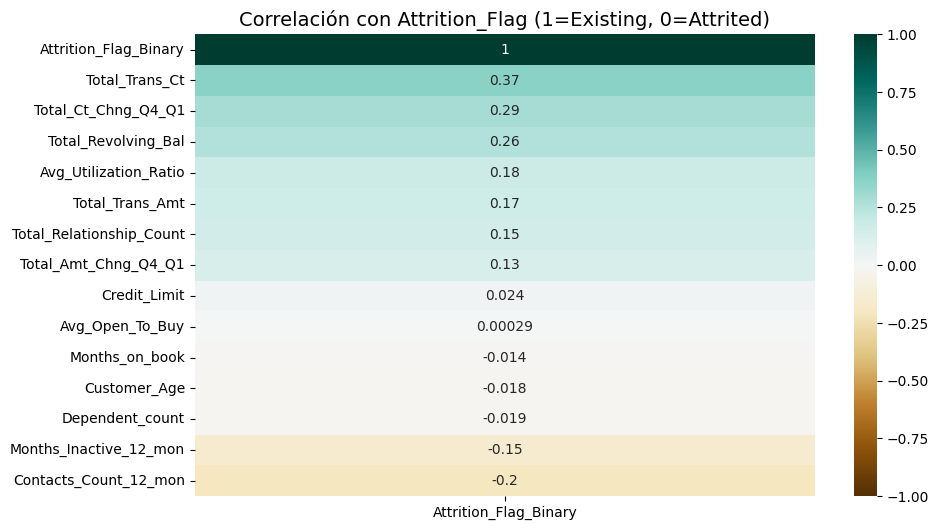

In [ ]:
# Variables más correlacionadas con el objetivo

# Copia y creación de variable binaria objetivo (ya está en work_corr)
df_corr = work_corr.copy()

# Seleccionar numéricas, excluyendo CLIENTNUM
num_corr = df_corr.select_dtypes(include=['int64', 'float64']).drop(columns=["CLIENTNUM"], errors="ignore").corr()

# Ordenar correlaciones contra la variable objetivo
corr_target = num_corr['Attrition_Flag_Binary'].sort_values(ascending=False)

# Mostrar correlaciones en texto
print("Correlación de las variables numéricas con el objetivo (Attrition_Flag_Binary):\n")
print(corr_target)

# Heatmap de correlación contra el objetivo
plt.figure(figsize=(10, 6))
sns.heatmap(
    num_corr[['Attrition_Flag_Binary']].sort_values(by='Attrition_Flag_Binary', ascending=False),
    annot=True, cmap="BrBG", vmin=-1, vmax=1
)
plt.title("Correlación con Attrition_Flag (1=Existing, 0=Attrited)", fontsize=14)
plt.show()



**Comentario:**

La correlación muestra que la retención de clientes está fuertemente asociada con la actividad transaccional, destacando el número total de transacciones (Total_Trans_Ct, 0.37) y el cambio en transacciones trimestre a trimestre (Total_Ct_Chng_Q4_Q1, 0.29), junto con el saldo revolvente (0.26) y el ratio de utilización (0.18). En contraste, la cancelación del servicio se relaciona con mayores contactos al banco en 12 meses (-0.20) y más meses de inactividad (-0.15). Variables demográficas como edad, número de dependientes o años en el banco apenas presentan influencia, y las variables categóricas muestran una relación casi nula, lo que confirma que el comportamiento transaccional es el factor clave para explicar la decisión de los clientes.

# 3. Modelización

In [ ]:
# Librerias
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd


In [ ]:
#Codia de dataframe
balanceo = work_codificado.copy()

In [ ]:
# Para enriquecer el modelo vamos a agregar variables derivadas
# Variables derivadas numéricas
balanceo["Trans_Amt_per_Trans"] = balanceo["Total_Trans_Amt"] / (balanceo["Total_Trans_Ct"] + 1)
balanceo["Revolving_to_Relationship"] = balanceo["Total_Revolving_Bal"] / (balanceo["Total_Relationship_Count"] + 1)
balanceo["Contact_Intensity"] = balanceo["Contacts_Count_12_mon"] / (balanceo["Months_Inactive_12_mon"] + 1)
balanceo["Trans_per_Month"] = balanceo["Total_Trans_Ct"] / (balanceo["Months_on_book"] + 1)
balanceo["Dependents_per_Relationship"] = balanceo["Dependent_count"] / (balanceo["Total_Relationship_Count"] + 1)
balanceo["Revolving_per_Month"] = balanceo["Total_Revolving_Bal"] / (balanceo["Months_on_book"] + 1)
balanceo["Trans_Contact_Ratio"] = balanceo["Total_Trans_Ct"] / (balanceo["Contacts_Count_12_mon"] + 1)

# Combinación categórica
balanceo["Education_Marital_Combo"] = balanceo["Education_Level"].astype(str) + "_" + balanceo["Marital_Status"].astype(str)

# Codificación de combinación categórica - Label Encoding
from sklearn.preprocessing import LabelEncoder
le_combo = LabelEncoder()
balanceo["Education_Marital_Combo_encoded"] = le_combo.fit_transform(balanceo["Education_Marital_Combo"])

# Confirmar nuevas columnas
print("Nuevas variables derivadas agregadas:")
print(balanceo.columns[-9:])

Nuevas variables derivadas agregadas:
Index(['Trans_Amt_per_Trans', 'Revolving_to_Relationship', 'Contact_Intensity',
       'Trans_per_Month', 'Dependents_per_Relationship', 'Revolving_per_Month',
       'Trans_Contact_Ratio', 'Education_Marital_Combo',
       'Education_Marital_Combo_encoded'],
      dtype='object')


In [ ]:
print(balanceo.dtypes)

CLIENTNUM                            int64
Attrition_Flag                       int64
Customer_Age                         int64
Gender                               int64
Dependent_count                      int64
Education_Level                      int64
Marital_Status                       int64
Income_Category                      int64
Card_Category                        int64
Months_on_book                       int64
Total_Relationship_Count             int64
Months_Inactive_12_mon               int64
Contacts_Count_12_mon                int64
Credit_Limit                         int64
Total_Revolving_Bal                  int64
Avg_Open_To_Buy                      int64
Total_Amt_Chng_Q4_Q1                 int64
Total_Trans_Amt                      int64
Total_Trans_Ct                       int64
Total_Ct_Chng_Q4_Q1                  int64
Avg_Utilization_Ratio                int64
Trans_Amt_per_Trans                float64
Revolving_to_Relationship          float64
Contact_Int

In [ ]:
# Definir X e y
y = balanceo['Attrition_Flag']   # 0 = Existing, 1 = Attrited
X = balanceo.drop(columns=['CLIENTNUM', 'Attrition_Flag','Education_Marital_Combo'])

In [ ]:
# Partición train/test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [ ]:
# Escalado (fit en train, transform en test)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Ajustar en X_train (pandas -> numpy result)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

In [ ]:
# Oversampling
ros = RandomOverSampler(random_state=42)
X_train_over, y_train_over = ros.fit_resample(X_train_scaled, y_train)

print("Obs. Datos originales:", y_train.shape[0])
print("Obs. Oversampling:", y_train_over.shape[0])
print(y_train_over.value_counts())


Obs. Datos originales: 8101
Obs. Oversampling: 13598
Attrition_Flag
0    6799
1    6799
Name: count, dtype: int64


In [ ]:
# Undersampling
rus = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = rus.fit_resample(X_train_scaled, y_train)

print("\nObs. Datos originales:", y_train.shape[0])
print("Obs. Undersampling:", y_train_under.shape[0])
print(y_train_under.value_counts())


Obs. Datos originales: 8101
Obs. Undersampling: 2604
Attrition_Flag
0    1302
1    1302
Name: count, dtype: int64


In [ ]:
# Híbrido (SMOTETomek)
hib = SMOTETomek(random_state=42)
X_train_hib, y_train_hib = hib.fit_resample(X_train_scaled, y_train)

print("\nObs. Datos originales:", y_train.shape[0])
print("Obs. Híbrido (SMOTETomek):", y_train_hib.shape[0])
print(y_train_hib.value_counts())


Obs. Datos originales: 8101
Obs. Híbrido (SMOTETomek): 13582
Attrition_Flag
0    6791
1    6791
Name: count, dtype: int64


In [ ]:
# Como vamos a usar el balanceo hibrido y evaluar varios modelos es mejor guardar el .pkl de este metodo de balanceo
import pickle

# Guardar datos balanceados híbridos
with open("X_train_hib.pkl", "wb") as f:
    pickle.dump(X_train_hib, f)

with open("y_train_hib.pkl", "wb") as f:
    pickle.dump(y_train_hib, f)

# Guardar también el test (para usar igual en todos los modelos)
with open("X_test_scaled.pkl", "wb") as f:
    pickle.dump(X_test_scaled, f)

with open("y_test.pkl", "wb") as f:
    pickle.dump(y_test, f)

In [ ]:
# Evaluación comparativa

resultados = []

def evaluar_y_guardar(nombre, X_tr, y_tr, X_te, y_te):
    modelo = LogisticRegression(random_state=42, max_iter=2000)
    modelo.fit(X_tr, y_tr)

    # Predicciones
    y_tr_pred = modelo.predict(X_tr)
    y_te_pred = modelo.predict(X_te)

    resultados.append({
        "Método": nombre,
        "Accuracy Train": accuracy_score(y_tr, y_tr_pred),
        "Precision Train": precision_score(y_tr, y_tr_pred),
        "Recall Train": recall_score(y_tr, y_tr_pred),
        "F1 Train": f1_score(y_tr, y_tr_pred),
        "Accuracy Test": accuracy_score(y_te, y_te_pred),
        "Precision Test": precision_score(y_te, y_te_pred),
        "Recall Test": recall_score(y_te, y_te_pred),
        "F1 Test": f1_score(y_te, y_te_pred),
    })

In [ ]:
evaluar_y_guardar("Original", X_train_scaled, y_train, X_test_scaled, y_test)
evaluar_y_guardar("Oversampling", X_train_over, y_train_over, X_test_scaled, y_test)
evaluar_y_guardar("Undersampling", X_train_under, y_train_under, X_test_scaled, y_test)
evaluar_y_guardar("Híbrido", X_train_hib, y_train_hib, X_test_scaled, y_test)

In [ ]:
resumen_balanceo = pd.DataFrame(resultados).round(3)
display(resumen_balanceo)

,Método,Accuracy Train,Precision Train,Recall Train,F1 Train,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Original,0.882,0.900,0.968,0.932,0.875,0.895,0.964,0.928
1,Oversampling,0.794,0.805,0.777,0.791,0.777,0.950,0.775,0.854
2,Undersampling,0.788,0.795,0.776,0.786,0.782,0.949,0.782,0.858
3,Híbrido,0.809,0.823,0.787,0.805,0.782,0.946,0.785,0.858


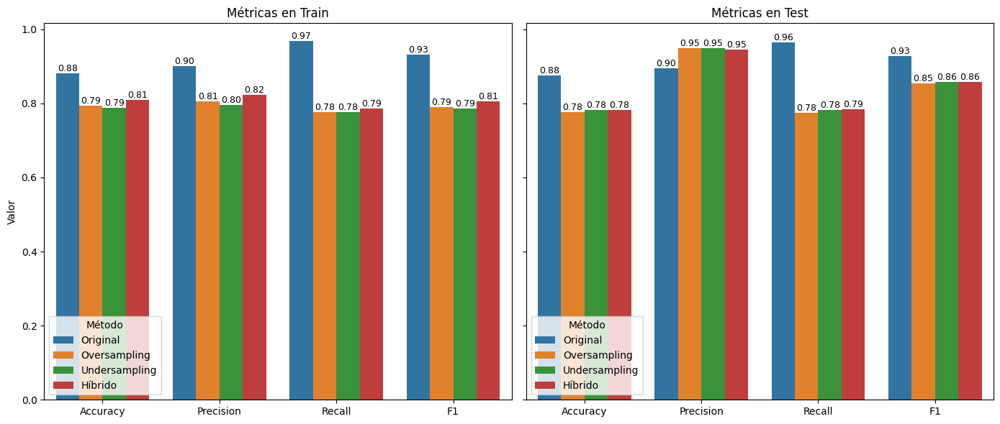

In [ ]:
# Metricas
cols_metricas = ["Accuracy Train","Precision Train","Recall Train","F1 Train",
                 "Accuracy Test","Precision Test","Recall Test","F1 Test"]

resumen_balanceo[cols_metricas] = resumen_balanceo[cols_metricas].astype(float)

# Gráfica Train
df_train = resumen_balanceo.melt(
    id_vars="Método",
    value_vars=["Accuracy Train","Precision Train","Recall Train","F1 Train"],
    var_name="Métrica",
    value_name="Valor"
)
df_train["Métrica"] = df_train["Métrica"].str.replace(" Train","")

# Gráfica Test
df_test = resumen_balanceo.melt(
    id_vars="Método",
    value_vars=["Accuracy Test","Precision Test","Recall Test","F1 Test"],
    var_name="Métrica",
    value_name="Valor"
)
df_test["Métrica"] = df_test["Métrica"].str.replace(" Test","")

# Plot conjunto
fig, axes = plt.subplots(1, 2, figsize=(14,6), sharey=True)

orden_metricas = ["Accuracy","Precision","Recall","F1"]

sns.barplot(
    data=df_train, x="Métrica", y="Valor", hue="Método",
    order=orden_metricas, ax=axes[0]
)
axes[0].set_title("Métricas en Train")
axes[0].set_ylabel("Valor")
axes[0].set_xlabel("")

sns.barplot(
    data=df_test, x="Métrica", y="Valor", hue="Método",
    order=orden_metricas, ax=axes[1]
)
axes[1].set_title("Métricas en Test")
axes[1].set_ylabel("")
axes[1].set_xlabel("")

# Mostrar valores encima de cada barra
for ax in axes:
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", fontsize=9)

plt.tight_layout()
plt.show()

**Comentarios:**


De acuerdo con los resultados obtenidos, el método Híbrido (SMOTETomek) será el que se utilizará para el proyecto. Este enfoque logra el mejor equilibrio entre desempeño en entrenamiento y generalización en test. En entrenamiento, alcanza un F1 de 0.81, mientras que en test mantiene un F1 competitivo de 0.86, superior al de Oversampling (0.79) y Undersampling (0.79), pero con mejor Recall (0.79) que ambos.

Además, el método Híbrido presenta una Accuracy en test de 0.78, ligeramente superior a los métodos puros, y una Precision de 0.945, lo que indica que no sacrifica exactitud al mejorar la sensibilidad. Esta combinación de métricas demuestra que SMOTETomek mejora la detección de la clase minoritaria sin comprometer la estabilidad del modelo.

Por tanto, se adopta el método Híbrido como estrategia de balanceo para el proyecto.

# 4. Modelos Supervisados

## 4.1. Árboles

### 4.1.1. Random Forest

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ruta_modelos = "/content/drive/MyDrive/PROYECTO UNI/Modelos"

In [ ]:
# Librerias para random forest hibrido

import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc,
    f1_score, balanced_accuracy_score,
    matthews_corrcoef, precision_recall_curve
)

In [ ]:
# Cargar datos balanceados híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_rf = {
    'n_estimators': [200, 300],
    'max_depth': [6, 8, 10],
    'max_features': ['sqrt', 'log2']
}

grid_rf = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid_rf,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_rf.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (Random Forest):")
print(grid_rf.best_estimator_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=200; total time=   5.2s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=200; total time=   3.6s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=200; total time=   5.4s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=200; total time=   3.3s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=200; total time=   2.8s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=300; total time=   3.4s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=300; total time=   3.4s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=300; total time=   3.6s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=300; total time=   2.9s
[CV] END ...max_depth=6, max_features=sqrt, n_estimators=300; total time=   2.8s
[CV] END ...max_depth=6, max_features=log2, n_estimators=200; total time=   1.8s
[CV] END ...max_depth=6, max_features=log2, n_es

In [ ]:
# Entrenar modelo final
best_model_rf = grid_rf.best_estimator_
best_model_rf.model_name = "Random Forest"
best_model_rf.fit(X_train_res, y_train_res)

RandomForestClassifier(max_depth=10, n_estimators=300, random_state=42)

In [ ]:
# Guardar modelo
joblib.dump(best_model_rf, f"{ruta_modelos}/modelo_random_forest.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_random_forest.pkl']

In [ ]:
# Probabilidades del modelo entrenado
y_pred_prob_rf = best_model_rf.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_rf = None

print("F1 por umbral (Random Forest):")
for t in thresholds:
    y_pred_thresh_rf = (y_pred_prob_rf >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_rf)
    auc_score = roc_auc_score(y_test, y_pred_prob_rf)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_rf = t

print(f"Umbral óptimo (Random Forest): {umbral_optimo_rf} con F1 = {round(mejor_f1, 3)}")

F1 por umbral (Random Forest):
Umbral 0.3 → F1: 0.94 | AUC: 0.933
Umbral 0.4 → F1: 0.939 | AUC: 0.933
Umbral 0.5 → F1: 0.928 | AUC: 0.933
Umbral 0.6 → F1: 0.923 | AUC: 0.933
Umbral óptimo (Random Forest): 0.3 con F1 = 0.94


In [ ]:
# Predicciones binarias con el umbral óptimo
y_pred_rf = (y_pred_prob_rf >= umbral_optimo_rf).astype(int)

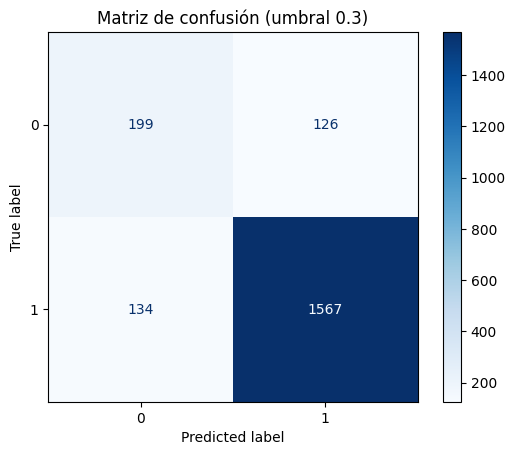

In [ ]:
# Matriz de confusión
disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo_rf})")
plt.show()

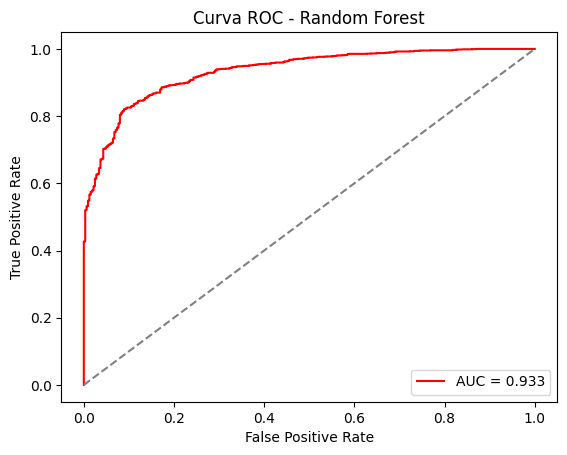

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_rf)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title(f"Curva ROC - {best_model_rf.model_name}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

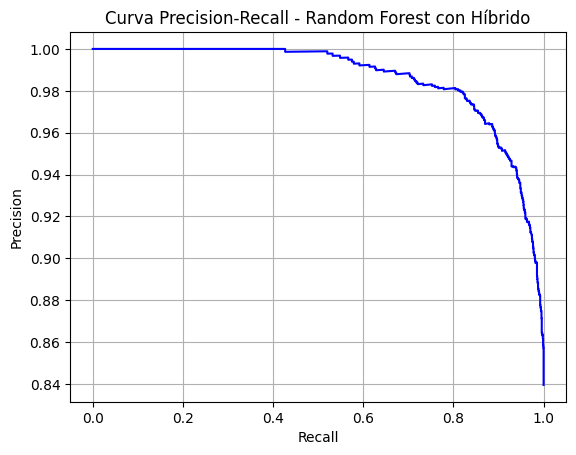

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_rf)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - Random Forest con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
auc_rf = roc_auc_score(y_test, y_pred_prob_rf)
print(f"AUC: {auc_rf:.3f}\n")
print("Reporte de clasificación (Random Forest):")
print(classification_report(y_test, y_pred_rf))

AUC: 0.933

Reporte de clasificación (Random Forest):
              precision    recall  f1-score   support

           0       0.72      0.60      0.65       325
           1       0.93      0.96      0.94      1701

    accuracy                           0.90      2026
   macro avg       0.82      0.78      0.80      2026
weighted avg       0.89      0.90      0.89      2026



In [ ]:
# Métricas adicionales
print("Métricas adicionales (Random Forest):")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_rf), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_rf), 3))

# Control de sobreajuste
print("Control de sobreajuste (Random Forest):")
print("Train F1:", round(f1_score(y_train_res, best_model_rf.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_rf), 3))

Métricas adicionales (Random Forest):
Balanced Accuracy: 0.776
Matthews Correlation Coefficient: 0.598
Control de sobreajuste (Random Forest):
Train F1: 0.94
Test F1: 0.94


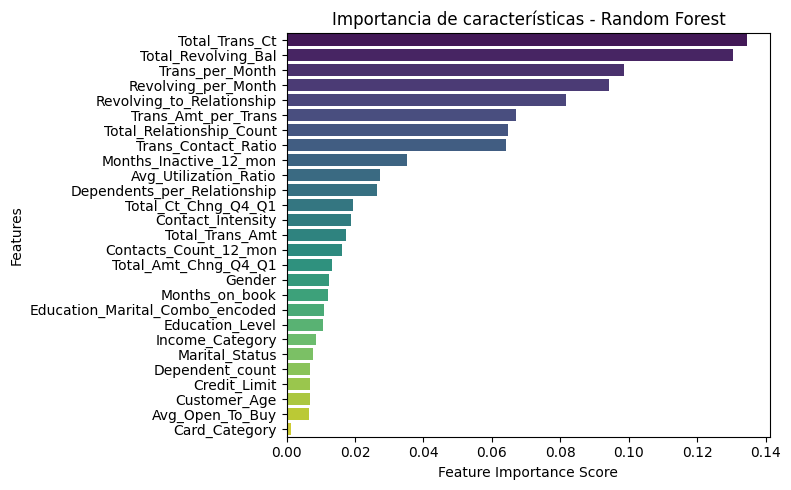

In [ ]:
# Importancia de variables
try:
    feature_scores = pd.Series(
        best_model_rf.feature_importances_,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    feature_scores = pd.Series(
        best_model_rf.feature_importances_,
        index=[f"Feature_{i}" for i in range(X_train_res.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores, y=feature_scores.index, palette="viridis")
plt.title("Importancia de características - Random Forest")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### 4.1.2. XGBoost

In [ ]:
# Librerias

import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc,
    f1_score, balanced_accuracy_score,
    matthews_corrcoef, precision_recall_curve
)

In [ ]:
# Cargar datos híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_xgb = {
    'n_estimators': [200, 300],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_xgb = GridSearchCV(
    XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'),
    param_grid_xgb,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_xgb.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (XGBoost):")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=0.8; total time=   0.6s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=0.8; total time=   0.6s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=1.0; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=1.0; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, n_estimators=200, subsample=1.0; total time=   0.7s
[CV] END c

In [ ]:
# Entrenar con el mejor modelo
best_model_xgb = grid_xgb.best_estimator_
best_model_xgb.model_name = "XGBOOST"
best_model_xgb.fit(X_train_res, y_train_res)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
# Guardar modelo
joblib.dump(best_model_xgb, f"{ruta_modelos}/modelo_xgboost.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_xgboost.pkl']

In [ ]:
from sklearn.metrics import f1_score, roc_auc_score, classification_report, balanced_accuracy_score, matthews_corrcoef

# Predicciones de probabilidad (asegúrate de que best_model_xgb ya está entrenado)
y_pred_prob_xgb = best_model_xgb.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_xgb = None

print("F1 por umbral (XGBoost):")
for t in thresholds:
    y_pred_thresh_xgb = (y_pred_prob_xgb >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_xgb)
    auc_score = roc_auc_score(y_test, y_pred_prob_xgb)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_xgb = t

print(f"Umbral óptimo (XGBoost): {umbral_optimo_xgb} con F1 = {round(mejor_f1, 3)}")

F1 por umbral (XGBoost):
Umbral 0.3 → F1: 0.945 | AUC: 0.939
Umbral 0.4 → F1: 0.946 | AUC: 0.939
Umbral 0.5 → F1: 0.943 | AUC: 0.939
Umbral 0.6 → F1: 0.941 | AUC: 0.939
Umbral óptimo (XGBoost): 0.4 con F1 = 0.946


In [ ]:
y_pred_xgb = (y_pred_prob_xgb >= umbral_optimo_xgb).astype(int)

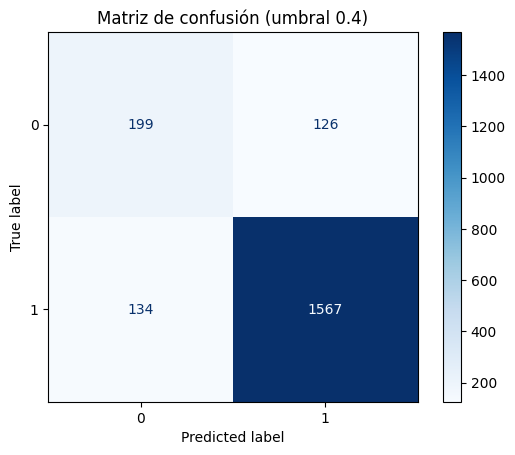

In [ ]:
# Matriz de confusión
disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo_xgb})")
plt.show()

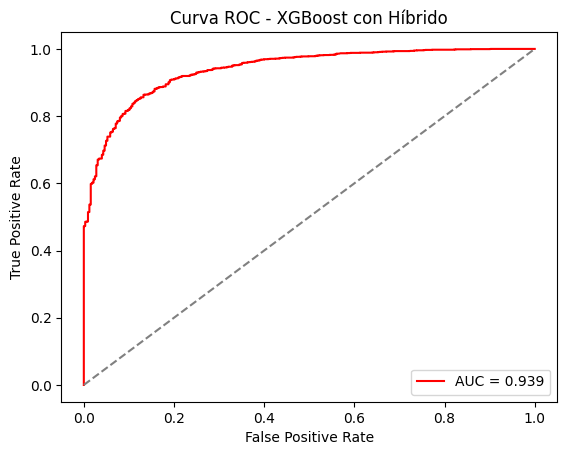

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_xgb)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - XGBoost con Híbrido")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

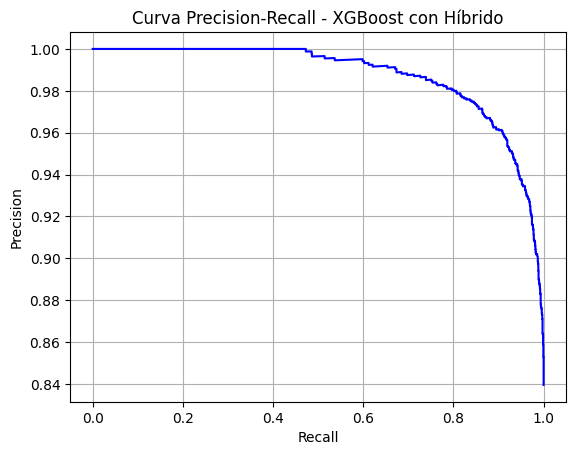

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_xgb)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - XGBoost con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
auc_xgb = roc_auc_score(y_test, y_pred_prob_xgb)
print(f"AUC: {auc_xgb:.3f}\n")
print("Reporte de clasificación (XGBoost):")
print(classification_report(y_test, y_pred_xgb))

AUC: 0.939

Reporte de clasificación (XGBoost):
              precision    recall  f1-score   support

           0       0.76      0.64      0.69       325
           1       0.93      0.96      0.95      1701

    accuracy                           0.91      2026
   macro avg       0.84      0.80      0.82      2026
weighted avg       0.90      0.91      0.91      2026



In [ ]:
# Métricas adicionales
print("Métricas adicionales:")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_xgb), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_xgb), 3))

# Control de sobreajuste
print("Control de sobreajuste:")
print("Train F1:", round(f1_score(y_train_res, best_model_xgb.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_xgb), 3))

Métricas adicionales:
Balanced Accuracy: 0.799
Matthews Correlation Coefficient: 0.641
Control de sobreajuste:
Train F1: 0.98
Test F1: 0.946


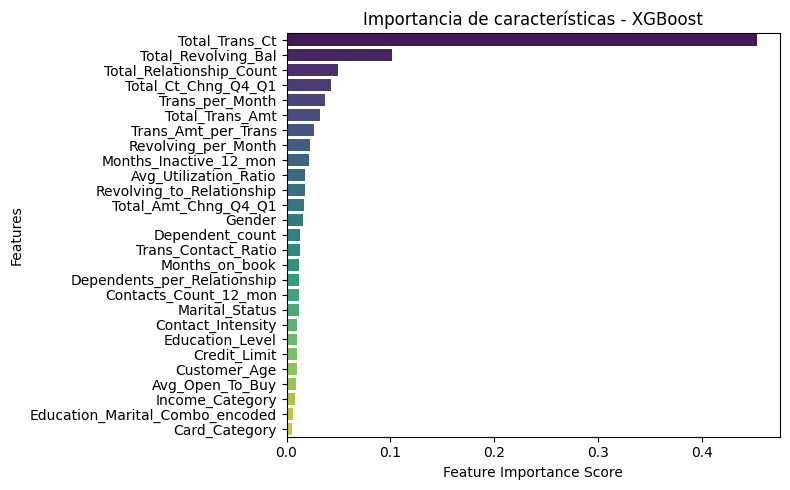

In [ ]:
# Importancia de variables
try:
    feature_scores = pd.Series(
        best_model_xgb.feature_importances_,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    feature_scores = pd.Series(
        best_model_xgb.feature_importances_,
        index=[f"Feature_{i}" for i in range(X_train_res.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores, y=feature_scores.index, palette="viridis")
plt.title("Importancia de características - XGBoost")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### 4.1.3. LGBM (LightGBM)

In [ ]:
# Librerías
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc,
    f1_score, balanced_accuracy_score,
    matthews_corrcoef, precision_recall_curve
)


In [ ]:
# Cargar datos híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_lgbm = {
    'n_estimators': [200, 300],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05],
    'num_leaves': [31, 50]
}

grid_lgbm = GridSearchCV(
    LGBMClassifier(random_state=42),
    param_grid_lgbm,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_lgbm.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (LightGBM):")
print(grid_lgbm.best_estimator_)

Se han truncado las últimas 5000 líneas del flujo de salida.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [ ]:
# Entrenar modelo final
best_model_lgbm = grid_lgbm.best_estimator_
best_model_lgbm.model_name = "LightGBM"
best_model_lgbm.fit(X_train_res, y_train_res)

[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6449
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(learning_rate=0.05, max_depth=10, n_estimators=200,
               num_leaves=50, random_state=42)

In [ ]:
# Guardar modelo
joblib.dump(best_model_lgbm, f"{ruta_modelos}/modelo_lgbm.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_lgbm.pkl']

In [ ]:
from sklearn.metrics import f1_score, roc_auc_score

# Predicciones de probabilidad
y_pred_prob_lgbm = best_model_lgbm.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_lgbm = None

print("F1 por umbral (LightGBM):")
for t in thresholds:
    y_pred_thresh_lgbm = (y_pred_prob_lgbm >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_lgbm)
    auc_score = roc_auc_score(y_test, y_pred_prob_lgbm)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_lgbm = t

print(f"Umbral óptimo (LightGBM): {umbral_optimo_lgbm} con F1 = {round(mejor_f1, 3)}")

F1 por umbral (LightGBM):
Umbral 0.3 → F1: 0.946 | AUC: 0.942
Umbral 0.4 → F1: 0.949 | AUC: 0.942
Umbral 0.5 → F1: 0.945 | AUC: 0.942
Umbral 0.6 → F1: 0.941 | AUC: 0.942
Umbral óptimo (LightGBM): 0.4 con F1 = 0.949


In [ ]:
# Predicciones binarias con el umbral óptimo
y_pred_lgbm = (y_pred_prob_lgbm >= umbral_optimo_lgbm).astype(int)

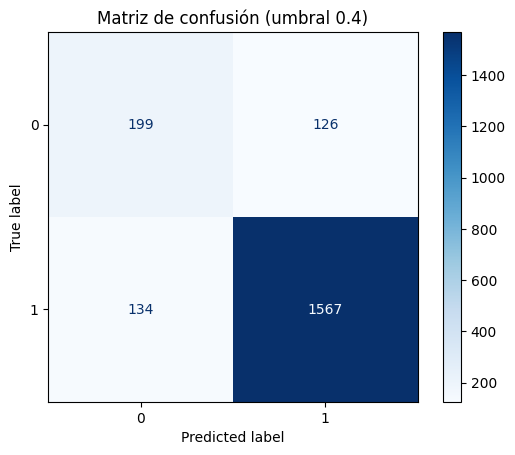

In [ ]:
# Matriz de confusión

disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo_lgbm})")
plt.show()

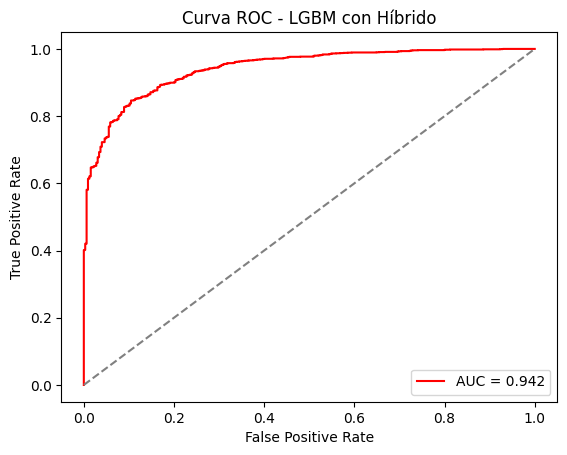

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_lgbm)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - LGBM con Híbrido")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

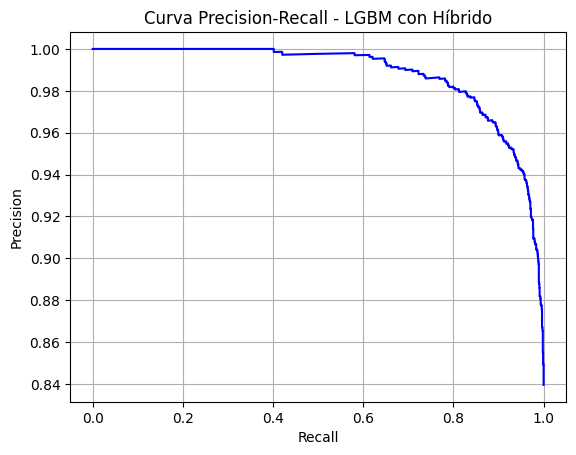

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_lgbm)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - LGBM con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
auc_lgbm = roc_auc_score(y_test, y_pred_prob_lgbm)
print(f"AUC: {auc_lgbm:.3f}\n")
print("Reporte de clasificación (LGBM)")
print(classification_report(y_test, y_pred_lgbm))

AUC: 0.942

Reporte de clasificación (LGBM)
              precision    recall  f1-score   support

           0       0.78      0.64      0.70       325
           1       0.93      0.96      0.95      1701

    accuracy                           0.91      2026
   macro avg       0.85      0.80      0.82      2026
weighted avg       0.91      0.91      0.91      2026



In [ ]:
# Métricas adicionales
print("Métricas adicionales:")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_lgbm), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_lgbm), 3))

# Control de sobreajuste
print("Control de sobreajuste:")
print("Train F1:", round(f1_score(y_train_res, best_model_lgbm.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_lgbm), 3))

Métricas adicionales:
Balanced Accuracy: 0.801
Matthews Correlation Coefficient: 0.653
Control de sobreajuste:
Train F1: 0.969
Test F1: 0.949


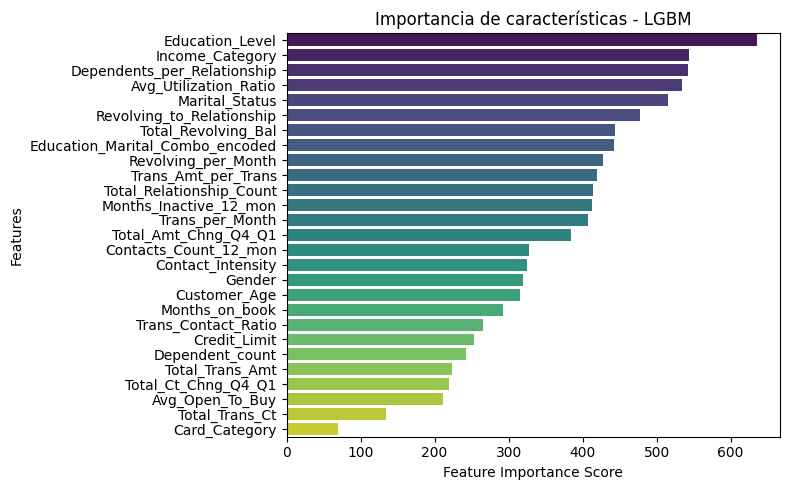

In [ ]:
# Importancia de variables
try:
    feature_scores = pd.Series(
        best_model_lgbm.feature_importances_,
        index=X_train.columns  # si es DataFrame
    ).sort_values(ascending=False)
except AttributeError:
    feature_scores = pd.Series(
        best_model_lgbm.feature_importances_,
        index=[f"Feature_{i}" for i in range(X_train_res.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores, y=feature_scores.index, palette="viridis")
plt.title("Importancia de características - LGBM")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

### 4.1.4. CatBoost

In [ ]:
!pip install catboost

In [ ]:
# Librerías
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    balanced_accuracy_score, matthews_corrcoef,
    ConfusionMatrixDisplay, roc_curve, auc
)
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import joblib

In [ ]:
# Cargar datos balanceados híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# GridSearchCV para tuning
param_grid_cat = {
    'iterations': [200, 300],
    'depth': [6, 8],
    'learning_rate': [0.01, 0.05]
}

grid_cat = GridSearchCV(
    CatBoostClassifier(verbose=0, random_state=42),
    param_grid_cat,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc",
    n_jobs=-1
)

grid_cat.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (CatBoost):")
print(grid_cat.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
Mejor modelo encontrado (CatBoost):


In [ ]:
# Entrenar con el mejor modelo
best_model_cat = grid_cat.best_estimator_
best_model_cat.model_name = "CatBoost"
best_model_cat.fit(X_train_res, y_train_res)

In [ ]:
# Guardar modelo en Drive
joblib.dump(best_model_cat, f"{ruta_modelos}/modelo_catboost.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_catboost.pkl']

In [ ]:
# Predicciones
y_pred_prob_cat = best_model_cat.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_cat = None

print("\nF1 por umbral (CatBoost):")
for t in thresholds:
    y_pred_thresh_cat = (y_pred_prob_cat >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_cat)
    auc_score = roc_auc_score(y_test, y_pred_prob_cat)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_cat = t

print(f"Umbral óptimo (CatBoost): {umbral_optimo_cat} con F1 = {round(mejor_f1, 3)}")

# Predicciones binarias con el umbral óptimo
y_pred_cat = (y_pred_prob_cat >= umbral_optimo_cat).astype(int)



F1 por umbral (CatBoost):
Umbral 0.3 → F1: 0.946 | AUC: 0.94
Umbral 0.4 → F1: 0.946 | AUC: 0.94
Umbral 0.5 → F1: 0.945 | AUC: 0.94
Umbral 0.6 → F1: 0.938 | AUC: 0.94
Umbral óptimo (CatBoost): 0.3 con F1 = 0.946


In [ ]:
# Métricas principales

auc_cat = roc_auc_score(y_test, y_pred_prob_cat)
print(f"AUC: {auc_cat:.3f}\n")
print("Reporte de clasificación (CatBoost):")
print(classification_report(y_test, y_pred_cat))

AUC: 0.940

Reporte de clasificación (CatBoost):
              precision    recall  f1-score   support

           0       0.82      0.54      0.65       325
           1       0.92      0.98      0.95      1701

    accuracy                           0.91      2026
   macro avg       0.87      0.76      0.80      2026
weighted avg       0.90      0.91      0.90      2026



In [ ]:
# Métricas adicionales

print("Métricas adicionales:")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_cat), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_cat), 3))

# Control de sobreajuste

print("Control de sobreajuste:")
print("Train F1:", round(f1_score(y_train_res, best_model_cat.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_cat), 3))

Métricas adicionales:
Balanced Accuracy: 0.758
Matthews Correlation Coefficient: 0.616
Control de sobreajuste:
Train F1: 0.97
Test F1: 0.946


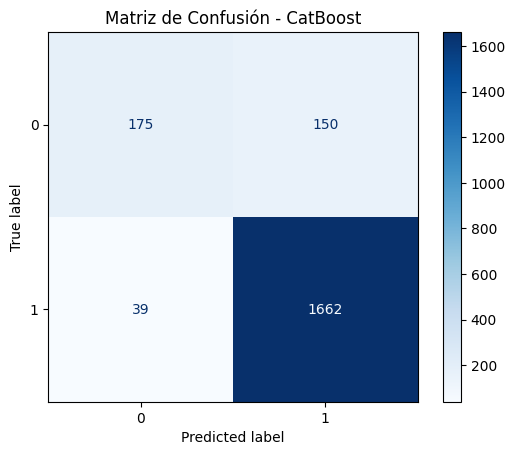

In [ ]:
# Matriz de confusión
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_cat, cmap=plt.cm.Blues)
plt.title(f"Matriz de Confusión - {best_model_cat.model_name}")
plt.show()

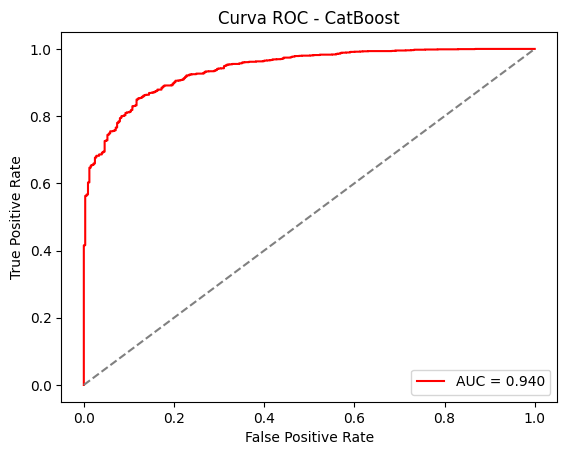

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_cat)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title(f"Curva ROC - {best_model_cat.model_name}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

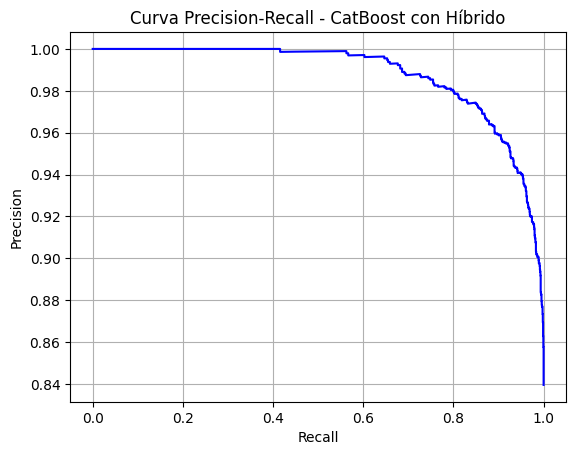

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_cat)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - CatBoost con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred))


Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.60      0.61      0.60       325
           1       0.93      0.92      0.92      1701

    accuracy                           0.87      2026
   macro avg       0.76      0.77      0.76      2026
weighted avg       0.87      0.87      0.87      2026



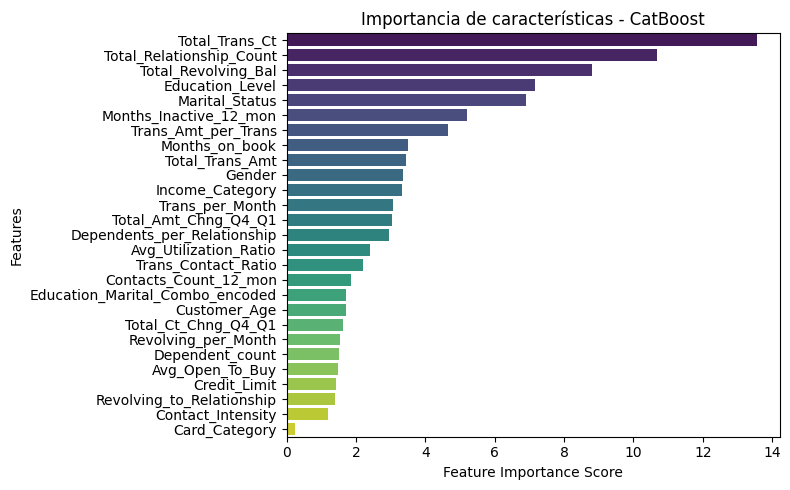

In [ ]:
# Importancia de variables
try:
    feature_scores_cat = pd.Series(
        best_model_cat.feature_importances_,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    feature_scores_cat = pd.Series(
        best_model_cat.feature_importances_,
        index=[f"Feature_{i}" for i in range(X_train.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores_cat, y=feature_scores_cat.index, palette="viridis")
plt.title("Importancia de características - CatBoost")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

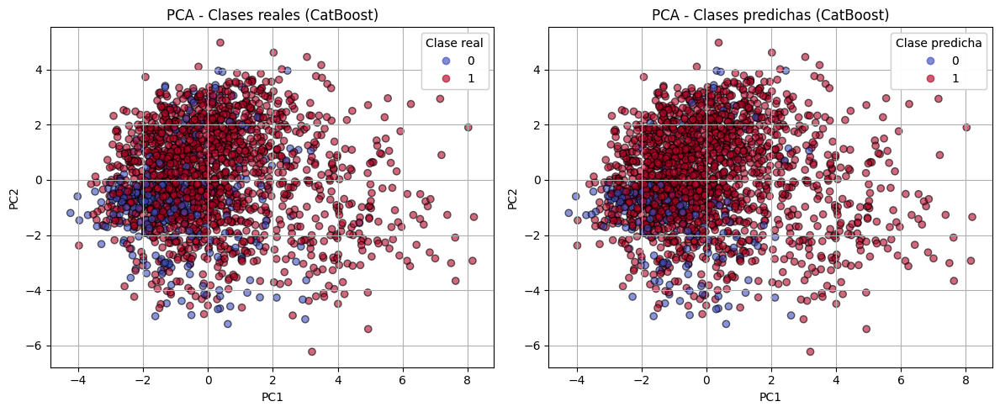

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Separabilidad con PCA (CatBoost)

pca = PCA(n_components=2)
X_pca_cat = pca.fit_transform(X_test)

plt.figure(figsize=(12, 5))

# PCA coloreado por clase real
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(
    X_pca_cat[:, 0], X_pca_cat[:, 1],
    c=y_test, cmap='coolwarm', alpha=0.6, edgecolor='k'
)
plt.title("PCA - Clases reales (CatBoost)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
legend1 = plt.legend(*scatter1.legend_elements(), title="Clase real")
plt.gca().add_artist(legend1)

# PCA coloreado por clase predicha
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(
    X_pca_cat[:, 0], X_pca_cat[:, 1],
    c=y_pred_cat, cmap='coolwarm', alpha=0.6, edgecolor='k'
)
plt.title("PCA - Clases predichas (CatBoost)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
legend2 = plt.legend(*scatter2.legend_elements(), title="Clase predicha")
plt.gca().add_artist(legend2)

plt.tight_layout()
plt.show()


## 4.2. Regresiones

### 4.2.1. Regresión Logística

In [ ]:
# Librerías
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc,
    f1_score, balanced_accuracy_score,
    matthews_corrcoef, precision_recall_curve
)

In [ ]:
# Cargar datos híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_logreg = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l2'],
    'solver': ['lbfgs']
}

grid_logreg = GridSearchCV(
    LogisticRegression(max_iter=1000, random_state=42),
    param_grid_logreg,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_logreg.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (Regresión Logística):")
print(grid_logreg.best_estimator_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.2s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.3s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.3s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   3.2s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.2s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.3s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.2s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.2s
[CV] END ......................C=1, penalty=l2, solver=lbfgs; total time=   0.4s
[CV] END ......................C=1, penalty=l2, s

In [ ]:
# Entrenar modelo final
best_model_logreg = grid_logreg.best_estimator_
best_model_logreg.model_name = "Regresión Logística"
best_model_logreg.fit(X_train_res, y_train_res)

LogisticRegression(C=10, max_iter=1000, random_state=42)

In [ ]:
# Guardar modelo
joblib.dump(best_model_logreg, f"{ruta_modelos}/modelo_logistica.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_logistica.pkl']

In [ ]:
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    balanced_accuracy_score, matthews_corrcoef
)

# Predicciones de probabilidad
y_pred_prob_logreg = best_model_logreg.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_logreg = None

print("F1 por umbral (Regresión Logística):")
for t in thresholds:
    y_pred_thresh_logreg = (y_pred_prob_logreg >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_logreg)
    auc_score = roc_auc_score(y_test, y_pred_prob_logreg)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_logreg = t

print(f"Umbral óptimo (Regresión Logística): {umbral_optimo_logreg} con F1 = {round(mejor_f1, 3)}")

# Predicciones binarias con el umbral óptimo
y_pred_logreg = (y_pred_prob_logreg >= umbral_optimo_logreg).astype(int)

F1 por umbral (Regresión Logística):
Umbral 0.3 → F1: 0.915 | AUC: 0.853
Umbral 0.4 → F1: 0.891 | AUC: 0.853
Umbral 0.5 → F1: 0.858 | AUC: 0.853
Umbral 0.6 → F1: 0.823 | AUC: 0.853
Umbral óptimo (Regresión Logística): 0.3 con F1 = 0.915


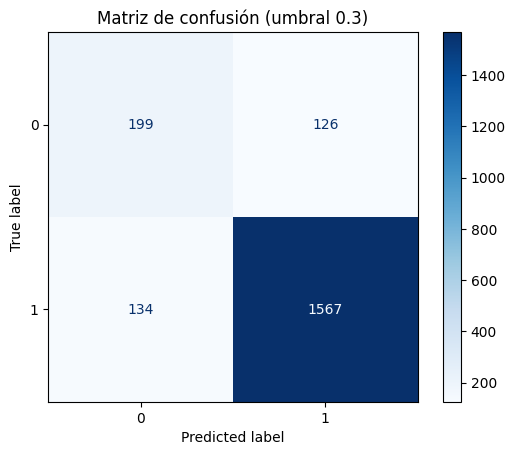

In [ ]:
# Matriz de confusión
disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo})")
plt.show()

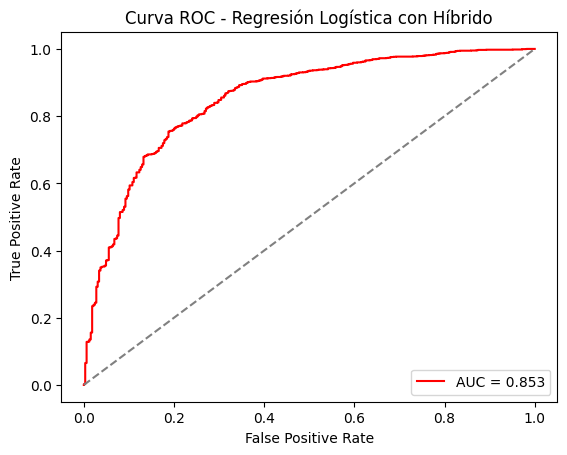

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_logreg)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - Regresión Logística con Híbrido")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

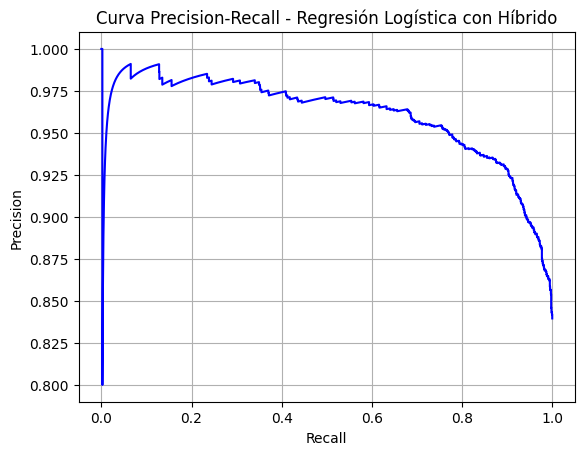

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_logreg)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - Regresión Logística con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
auc_logreg = roc_auc_score(y_test, y_pred_prob_logreg)
print(f"AUC: {auc_logreg:.3f}\n")
print("Reporte de clasificación (Regresión Logística):")
print(classification_report(y_test, y_pred_logreg))

AUC: 0.853

Reporte de clasificación (Regresión Logística):
              precision    recall  f1-score   support

           0       0.55      0.64      0.59       325
           1       0.93      0.90      0.91      1701

    accuracy                           0.86      2026
   macro avg       0.74      0.77      0.75      2026
weighted avg       0.87      0.86      0.86      2026



In [ ]:
# Métricas adicionales

print("Métricas adicionales (Regresión Logística):")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_logreg), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_logreg), 3))

# Control de sobreajuste

print("Control de sobreajuste (Regresión Logística):")
print("Train F1:", round(f1_score(y_train_res, best_model_logreg.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_logreg), 3))

Métricas adicionales (Regresión Logística):
Balanced Accuracy: 0.769
Matthews Correlation Coefficient: 0.509
Control de sobreajuste (Regresión Logística):
Train F1: 0.804
Test F1: 0.915


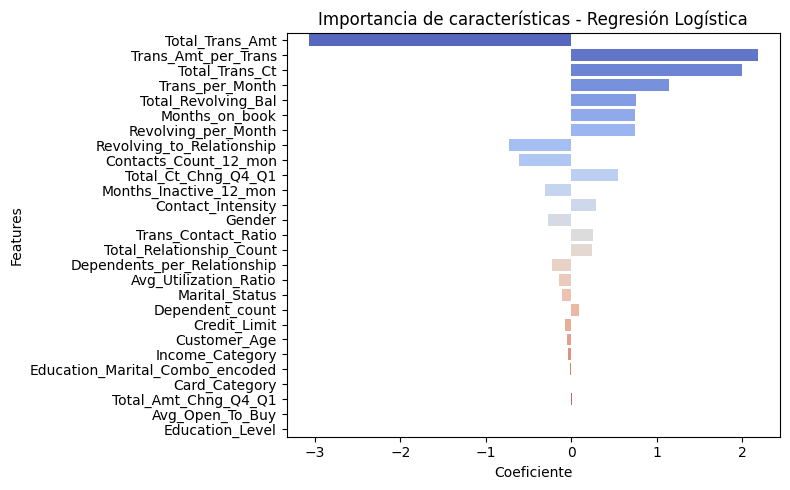

In [ ]:
# Importancia de variables (coeficientes)
coefs = pd.Series(
    best_model_logreg.coef_[0],
    index=X_train.columns
).sort_values(key=abs, ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=coefs, y=coefs.index, palette="coolwarm")
plt.title("Importancia de características - Regresión Logística")
plt.xlabel("Coeficiente")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

Top 15 Odds Ratios:
Trans_Amt_per_Trans         8.814963
Total_Trans_Ct              7.332651
Trans_per_Month             3.144599
Total_Revolving_Bal         2.125217
Months_on_book              2.114014
Revolving_per_Month         2.093881
Total_Ct_Chng_Q4_Q1         1.722467
Contact_Intensity           1.337547
Trans_Contact_Ratio         1.287739
Total_Relationship_Count    1.277608
Dependent_count             1.096411
Total_Amt_Chng_Q4_Q1        1.005045
Education_Level             0.999399
Avg_Open_To_Buy             0.996331
Card_Category               0.989236
dtype: float64


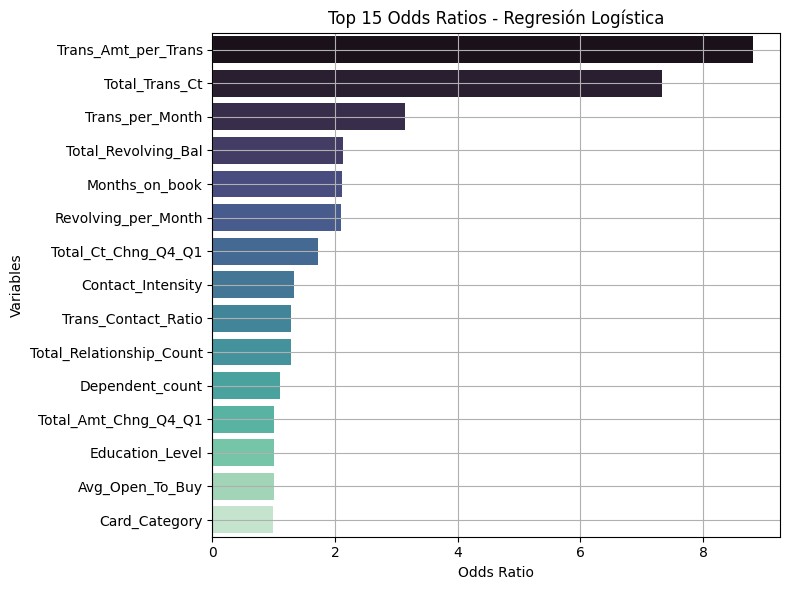

In [ ]:
# Calcular odds ratios
odds_ratios = np.exp(best_model_logreg.coef_[0])
odds_df = pd.Series(odds_ratios, index=X_train.columns).sort_values(ascending=False)

# Mostrar top 15
print("Top 15 Odds Ratios:")
print(odds_df.head(15))

# Visualización
plt.figure(figsize=(8, 6))
sns.barplot(x=odds_df.head(15), y=odds_df.head(15).index, palette="mako")
plt.title("Top 15 Odds Ratios - Regresión Logística")
plt.xlabel("Odds Ratio")
plt.ylabel("Variables")
plt.grid(True)
plt.tight_layout()
plt.show()

**Top 15 Odds Ratios – Regresión Logística**
| Variable                  | Odds Ratio | Interpretación ejecutiva                                                  |
|---------------------------|------------|---------------------------------------------------------------------------|
| Trans_Amt_per_Trans       | 8.81       | Alto gasto por transacción multiplica el riesgo de abandono ×8.8         |
| Total_Trans_Ct            | 7.33       | Mayor número de transacciones se asocia a mayor probabilidad de churn    |
| Trans_per_Month           | 3.14       | Frecuencia mensual elevada indica uso intensivo antes de cierre          |
| Total_Revolving_Bal       | 2.13       | Saldo rotativo alto duplica el riesgo de abandono                        |
| Months_on_book            | 2.11       | Clientes con más antigüedad tienen mayor probabilidad de cerrar ciclo    |
| Revolving_per_Month       | 2.09       | Uso mensual del crédito rotativo eleva el riesgo                         |
| Total_Ct_Chng_Q4_Q1       | 1.72       | Cambios en transacciones reflejan inestabilidad                          |
| Contact_Intensity         | 1.34       | Más contactos en meses inactivos puede indicar fricción o insatisfacción |
| Trans_Contact_Ratio       | 1.29       | Relación entre transacciones y contactos sugiere comportamiento errático |
| Total_Relationship_Count  | 1.28       | Más relaciones también se asocian a mayor riesgo (posible saturación)    |
| Dependent_count           | 1.10       | Leve aumento, posiblemente por carga financiera                          |
| Total_Amt_Chng_Q4_Q1      | 1.00       | Cambio de monto no tiene efecto significativo                            |
| Education_Level           | 1.00       | Nivel educativo no influye directamente en abandono                      |
| Avg_Open_To_Buy           | 0.996      | Capacidad de compra ligeramente protectora                               |
| Card_Category             | 0.989      | Tipo de tarjeta tiene efecto marginal en retención                       |


**Comentarios:**


El modelo revela que el comportamiento transaccional es el principal predictor de abandono. Variables como Trans_Amt_per_Trans y Total_Trans_Ct tienen un impacto multiplicativo fuerte sobre el riesgo de churn. También se observa que clientes con mayor antigüedad (Months_on_book) y saldos rotativos elevados (Total_Revolving_Bal) presentan mayor probabilidad de cierre. Este análisis permite priorizar acciones de retención sobre segmentos con uso intensivo, comportamiento errático o señales de saturación.

### 4.2.2. Regresión ElasticNet

In [ ]:
# Librerías
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report, roc_curve, auc,
    f1_score, balanced_accuracy_score,
    matthews_corrcoef, precision_recall_curve
)

In [ ]:
# Cargar datos balanceados híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_enet = {
    'C': [0.01, 0.1, 1, 10],
    'l1_ratio': [0.1, 0.5, 0.9],  # proporción L1/L2
    'penalty': ['elasticnet'],
    'solver': ['saga']
}

grid_enet = GridSearchCV(
    LogisticRegression(max_iter=10000, random_state=42),
    param_grid_enet,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_enet.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (ElasticNet):")
print(grid_enet.best_estimator_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END C=0.01, l1_ratio=0.1, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.1, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.1, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.1, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.1, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.5, penalty=elasticnet, solver=saga; total time=   0.5s
[CV] END C=0.01, l1_ratio=0.5, penalty=elasticnet, solver=saga; total time=   0.4s
[CV] END C=0.01, l1_ratio=0.5, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.5, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.5, penalty=elasticnet, solver=saga; total time=   0.3s
[CV] END C=0.01, l1_ratio=0.9, penalty=elasticnet, solver=saga; total time=   0.4s
[CV] END C=0.01, l1_ratio=

In [ ]:
# Entrenar modelo final
best_model_enet = grid_enet.best_estimator_
best_model_enet.model_name = "Regresión ElasticNet"
best_model_enet.fit(X_train_res, y_train_res)

LogisticRegression(C=1, l1_ratio=0.5, max_iter=10000, penalty='elasticnet',
                   random_state=42, solver='saga')

In [ ]:
# Guardar modelo
joblib.dump(best_model_enet, f"{ruta_modelos}/modelo_elasticnet.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_elasticnet.pkl']

In [ ]:
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    balanced_accuracy_score, matthews_corrcoef
)

# Predicciones de probabilidad
y_pred_prob_enet = best_model_enet.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_enet = None

print("F1 por umbral (ElasticNet):")
for t in thresholds:
    y_pred_thresh_enet = (y_pred_prob_enet >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_enet)
    auc_score = roc_auc_score(y_test, y_pred_prob_enet)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_enet = t

print(f"Umbral óptimo (ElasticNet): {umbral_optimo_enet} con F1 = {round(mejor_f1, 3)}")

# Predicciones binarias con el umbral óptimo
y_pred_enet = (y_pred_prob_enet >= umbral_optimo_enet).astype(int)

F1 por umbral (ElasticNet):
Umbral 0.3 → F1: 0.914 | AUC: 0.853
Umbral 0.4 → F1: 0.892 | AUC: 0.853
Umbral 0.5 → F1: 0.859 | AUC: 0.853
Umbral 0.6 → F1: 0.823 | AUC: 0.853
Umbral óptimo (ElasticNet): 0.3 con F1 = 0.914


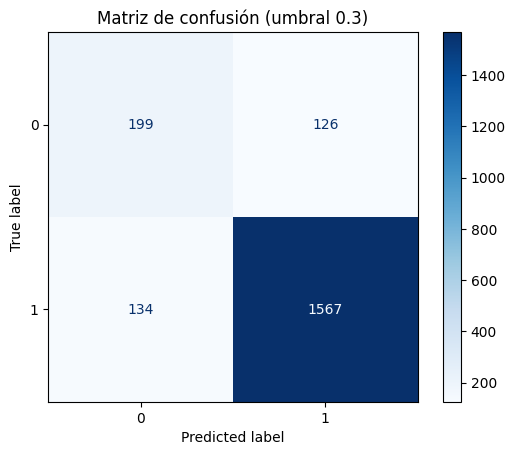

In [ ]:
# Matriz de confusión
disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo})")
plt.show()

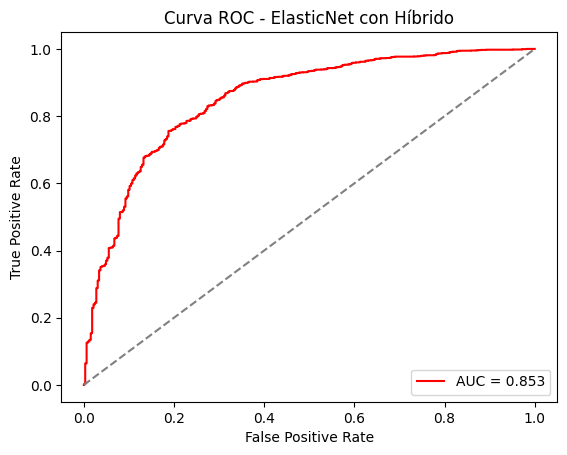

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_enet)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - ElasticNet con Híbrido")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

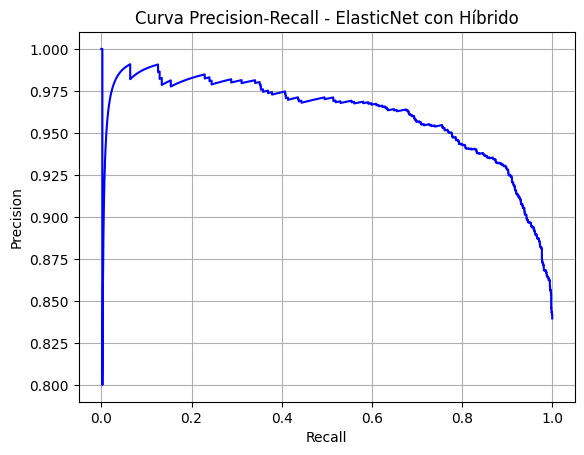

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_enet)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - ElasticNet con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
auc_enet = roc_auc_score(y_test, y_pred_prob_enet)
print(f"AUC: {auc_enet:.3f}\n")
print("Reporte de clasificación (ElasticNet):")
print(classification_report(y_test, y_pred_enet))

AUC: 0.853

Reporte de clasificación (ElasticNet):
              precision    recall  f1-score   support

           0       0.55      0.63      0.59       325
           1       0.93      0.90      0.91      1701

    accuracy                           0.86      2026
   macro avg       0.74      0.77      0.75      2026
weighted avg       0.87      0.86      0.86      2026



In [ ]:
# Métricas adicionales

print("Métricas adicionales (ElasticNet):")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_enet), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_enet), 3))
# Control de sobreajuste

print("Control de sobreajuste (ElasticNet):")
print("Train F1:", round(f1_score(y_train_res, best_model_enet.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_enet), 3))

Métricas adicionales (ElasticNet):
Balanced Accuracy: 0.768
Matthews Correlation Coefficient: 0.506
Control de sobreajuste (ElasticNet):
Train F1: 0.805
Test F1: 0.914


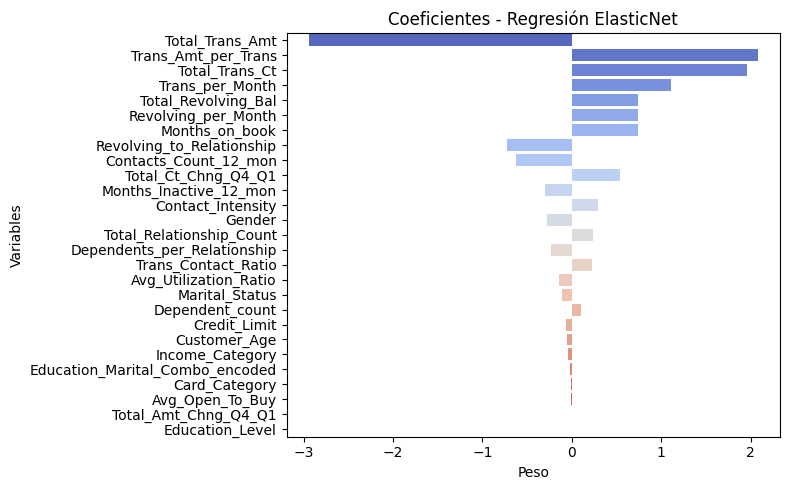

In [ ]:
# Visualización de coeficientes
coefs = pd.Series(
    best_model_enet.coef_[0],
    index=X_train.columns
).sort_values(key=abs, ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=coefs, y=coefs.index, palette="coolwarm")
plt.title("Coeficientes - Regresión ElasticNet")
plt.xlabel("Peso")
plt.ylabel("Variables")
plt.tight_layout()
plt.show()

Top 15 Odds Ratios:
Trans_Amt_per_Trans         7.992327
Total_Trans_Ct              7.137484
Trans_per_Month             3.040926
Total_Revolving_Bal         2.103613
Revolving_per_Month         2.100281
Months_on_book              2.085595
Total_Ct_Chng_Q4_Q1         1.720575
Contact_Intensity           1.337028
Total_Relationship_Count    1.268474
Trans_Contact_Ratio         1.256823
Dependent_count             1.104763
Total_Amt_Chng_Q4_Q1        1.006844
Education_Level             1.000000
Avg_Open_To_Buy             0.990234
Card_Category               0.989487
dtype: float64


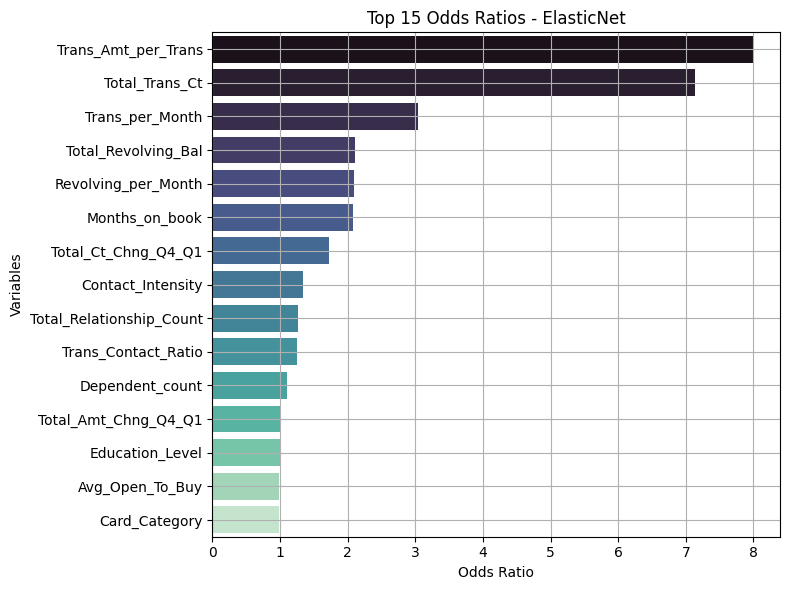

In [ ]:
odds_ratios = np.exp(best_model_enet.coef_[0])
odds_df = pd.Series(odds_ratios, index=X_train.columns).sort_values(ascending=False)

# Mostrar top 15
print("Top 15 Odds Ratios:")
print(odds_df.head(15))

# Visualización
plt.figure(figsize=(8, 6))
sns.barplot(x=odds_df.head(15), y=odds_df.head(15).index, palette="mako")
plt.title("Top 15 Odds Ratios - ElasticNet")
plt.xlabel("Odds Ratio")
plt.ylabel("Variables")
plt.grid(True)
plt.tight_layout()
plt.show()

**Top 15 Odds Ratios – ElasticNet**
| Variable                  | Odds Ratio | Interpretación ejecutiva                                                  |
|---------------------------|------------|---------------------------------------------------------------------------|
| Trans_Amt_per_Trans       | 7.99       | Alto gasto por transacción multiplica el riesgo de abandono ×8           |
| Total_Trans_Ct            | 7.14       | Mayor número de transacciones se asocia a mayor probabilidad de churn    |
| Trans_per_Month           | 3.04       | Frecuencia mensual elevada indica uso intensivo antes de cierre          |
| Total_Revolving_Bal       | 2.10       | Saldo rotativo alto duplica el riesgo de abandono                        |
| Revolving_per_Month       | 2.10       | Uso mensual del crédito rotativo eleva el riesgo                         |
| Months_on_book            | 2.09       | Clientes con más antigüedad tienen mayor probabilidad de cerrar ciclo    |
| Total_Ct_Chng_Q4_Q1       | 1.72       | Cambios en transacciones reflejan inestabilidad                          |
| Contact_Intensity         | 1.34       | Más contactos en meses inactivos puede indicar fricción o insatisfacción |
| Total_Relationship_Count  | 1.27       | Más relaciones también se asocian a mayor riesgo (posible saturación)    |
| Trans_Contact_Ratio       | 1.26       | Relación entre transacciones y contactos sugiere comportamiento errático |
| Dependent_count           | 1.10       | Leve aumento, posiblemente por carga financiera                          |
| Total_Amt_Chng_Q4_Q1      | 1.01       | Cambio de monto no tiene efecto significativo                            |
| Education_Level           | 1.00       | Nivel educativo no influye directamente en abandono                      |
| Avg_Open_To_Buy           | 0.99       | Capacidad de compra ligeramente protectora                               |
| Card_Category             | 0.99       | Tipo de tarjeta tiene efecto marginal en retención                       |


**Comentarios:**

El modelo ElasticNet confirma que el comportamiento transaccional es el principal motor del abandono. Variables como Trans_Amt_per_Trans, Total_Trans_Ct y Trans_per_Month tienen un impacto multiplicativo fuerte. También se observa que clientes con saldos rotativos altos y mayor antigüedad presentan mayor riesgo. Este análisis permite priorizar estrategias de retención sobre segmentos con uso intensivo, balances elevados o señales de saturación.

#

## 4.3. Otros

### 4.3.1. Naive Bayes

In [ ]:
# Librerías
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np

from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    balanced_accuracy_score, matthews_corrcoef
)

In [ ]:
# Cargar datos balanceados híbridos
with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_nb = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}

grid_nb = GridSearchCV(
    GaussianNB(),
    param_grid_nb,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_nb.fit(X_train_res, y_train_res)
print("Mejor modelo encontrado (Naive Bayes):")
print(grid_nb.best_estimator_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

In [ ]:
# Guardar modelo
joblib.dump(nb_model, f"{ruta_modelos}/modelo_naive_bayes.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_naive_bayes.pkl']

In [ ]:
# Entrenar modelo final
best_model_nb = grid_nb.best_estimator_
best_model_nb.model_name = "Naive Bayes"
best_model_nb.fit(X_train_res, y_train_res)

GaussianNB(var_smoothing=1e-05)

In [ ]:
# Predicciones de probabilidad
y_pred_prob_nb = best_model_nb.predict_proba(X_test)[:, 1]

# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_nb = None

print("\nF1 por umbral (Naive Bayes):")
for t in thresholds:
    y_pred_thresh_nb = (y_pred_prob_nb >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_nb)
    auc_score = roc_auc_score(y_test, y_pred_prob_nb)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_nb = t

print(f"Umbral óptimo (Naive Bayes): {umbral_optimo_nb} con F1 = {round(mejor_f1, 3)}")

# Predicciones binarias con el umbral óptimo
y_pred_nb = (y_pred_prob_nb >= umbral_optimo_nb).astype(int)


F1 por umbral (Naive Bayes):
Umbral 0.3 → F1: 0.813 | AUC: 0.813
Umbral 0.4 → F1: 0.796 | AUC: 0.813
Umbral 0.5 → F1: 0.776 | AUC: 0.813
Umbral 0.6 → F1: 0.764 | AUC: 0.813
Umbral óptimo (Naive Bayes): 0.3 con F1 = 0.813


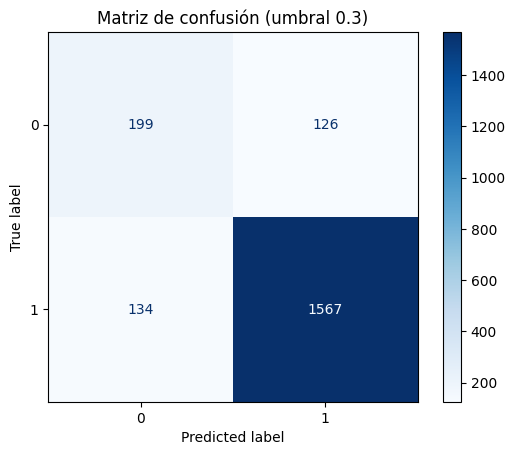

In [ ]:
# Matriz de confusión
disp = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, cmap=plt.cm.Blues
)
disp.ax_.set_title(f"Matriz de confusión (umbral {umbral_optimo_nb})")
plt.show()

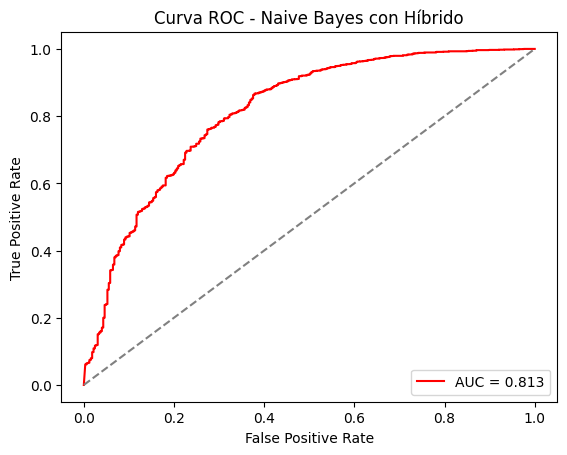

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_nb)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - Naive Bayes con Híbrido")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

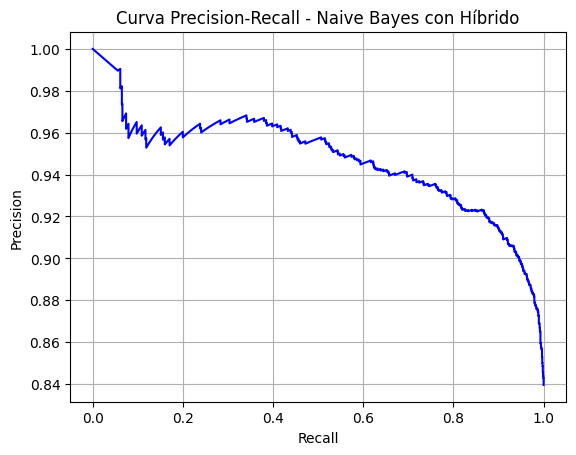

In [ ]:
# Curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_nb)

plt.figure()
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - Naive Bayes con Híbrido")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

In [ ]:
# Reporte de clasificación
print("Reporte de clasificación (Naive Bayes):")
print(classification_report(y_test, y_pred_nb))

Reporte de clasificación (Naive Bayes):
              precision    recall  f1-score   support

           0       0.34      0.74      0.46       325
           1       0.94      0.72      0.81      1701

    accuracy                           0.72      2026
   macro avg       0.64      0.73      0.64      2026
weighted avg       0.84      0.72      0.76      2026



In [ ]:
# Métricas adicionales

print("Métricas adicionales:")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_nb), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_nb), 3))

# Control de sobreajuste

print("Control de sobreajuste:")
print("Train F1:", round(f1_score(y_train_res, best_model_nb.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_nb), 3))

Métricas adicionales:
Balanced Accuracy: 0.732
Matthews Correlation Coefficient: 0.355
Control de sobreajuste:
Train F1: 0.739
Test F1: 0.813


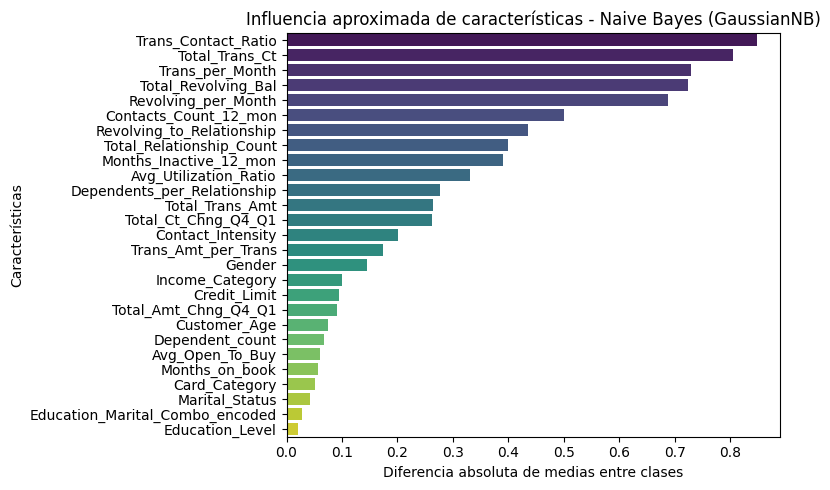

In [ ]:
# Importancia de las variables
try:
    # Diferencia absoluta de medias entre clases como medida de influencia
    diff_means = np.abs(best_model_nb.theta_[0] - best_model_nb.theta_[1])
    feature_scores_nb = pd.Series(
        diff_means,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    # Si no hay nombres de columnas
    diff_means = np.abs(best_model_nb.theta_[0] - best_model_nb.theta_[1])
    feature_scores_nb = pd.Series(
        diff_means,
        index=[f"Feature_{i}" for i in range(X_train.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores_nb, y=feature_scores_nb.index, palette="viridis")
plt.title("Influencia aproximada de características - Naive Bayes (GaussianNB)")
plt.xlabel("Diferencia absoluta de medias entre clases")
plt.ylabel("Características")
plt.tight_layout()
plt.show()

# 5. Modelos No Supervisados

### 5.1. PCA

In [ ]:
!pip install factor-analyzer


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 475.8 kB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor-analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=521c1a30f740489d814ae048b6929ceb5842f52532ff0012fc439a45ef7f6d7d
  Stored in directory: /root/.cache/pip/wheels/a2/af/06/f4d4ed4d9d714fda437fb1583629417319603c2266e7b233cc
Successfully built factor-analyzer


In [ ]:
# Librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from factor_analyzer import calculate_bartlett_sphericity, calculate_kmo

In [ ]:
variables_pca = banco_codi.drop(columns=["CLIENTNUM", "Attrition_Flag"])


In [ ]:
variables_pca = variables_pca.select_dtypes(include=["int64", "float64"])
print("Columnas finales para PCA:")
print(variables_pca.columns)


Columnas finales para PCA:
Index(['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
       'Income_Category', 'Months_on_book', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown', 'Card_Category_Gold',
       'Card_Category_Platinum', 'Card_Category_Silver', 'AgeGroup',
       'Credit_Limit_log', 'Total_Trans_Amt_log'],
      dtype='object')


In [ ]:
# Test de Esfericidad de Bartlett

chi_square_value, p_value = calculate_bartlett_sphericity(variables_pca)
print(f"Valor de Chi-Cuadrado: {chi_square_value}")
print(f"p-valor: {p_value}")

if p_value < 0.05:
    print("Es adecuado aplicar PCA.")
else:
    print("PCA puede no ser adecuado.")

print("\nValores nulos por columna:\n", variables_pca.isnull().sum())

Valor de Chi-Cuadrado: 501169.9373810618
p-valor: 0.0
Es adecuado aplicar PCA.

Valores nulos por columna:
 Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Income_Category             0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Marital_Status_Married      0
Marital_Status_Single       0
Marital_Status_Unknown      0
Card_Category_Gold          0
Card_Category_Platinum      0
Card_Category_Silver        0
AgeGroup                    0
Credit_Limit_log            0
Total_Trans_Amt_log         0
dtype: int64


In [ ]:
# KMO

kmo_all, kmo_model = calculate_kmo(banco_codi)

print("\nKMO por variable:")
print(kmo_all)

print(f"\nKMO del modelo: {kmo_model}")
if kmo_model >= 0.6:
    print("La adecuación muestral es suficiente.")
else:
    print("La adecuación muestral NO es suficiente.")


KMO por variable:
[0.29546756 0.59903559 0.62605956 0.69381295 0.70520365 0.5018472
 0.68542299 0.84985606 0.80522792 0.63419757 0.78284971 0.578505
 0.20145379 0.5811614  0.54699856 0.76772075 0.73120321 0.61459341
 0.8159348  0.37064661 0.35702207 0.13317586 0.78455029 0.70232731
 0.91039329 0.66103631 0.87406598 0.65887311]

KMO del modelo: 0.6188003391555245
La adecuación muestral es suficiente.


In [ ]:
# Entrenamiento PCA
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(variables_pca)

modelo_pca = pca_pipe.named_steps['pca']

# Varianza explicada
var_exp = modelo_pca.explained_variance_ratio_
var_acum = np.cumsum(var_exp)

# Número de componentes que explican al menos el 75% de la varianza
n_componentes_75 = np.argmax(var_acum >= 0.75) + 1
print(f"\nNúmero de componentes que explican al menos el 75% de la varianza: {n_componentes_75}")


Número de componentes que explican al menos el 75% de la varianza: 11


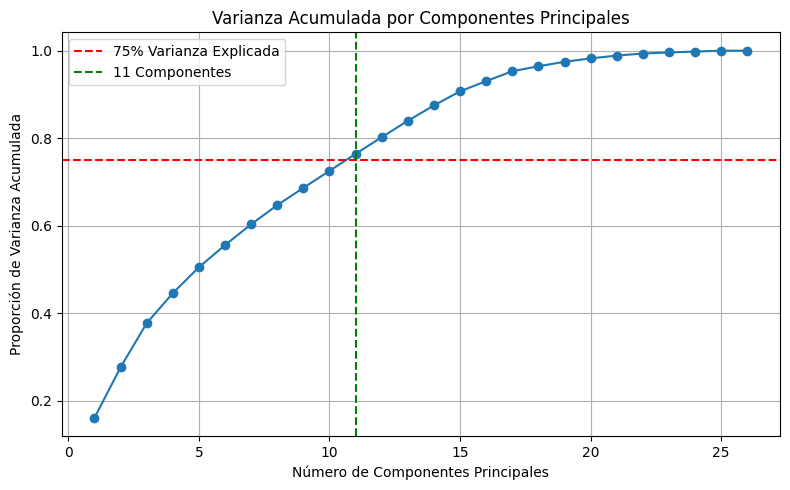

In [ ]:
# Gráfico varianza acumulada
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(var_exp)+1), var_acum, marker='o', linestyle='-')
plt.axhline(y=0.75, color='r', linestyle='--', label='75% Varianza Explicada')
plt.axvline(x=n_componentes_75, color='g', linestyle='--', label=f'{n_componentes_75} Componentes')
plt.title('Varianza Acumulada por Componentes Principales')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Proporción de Varianza Acumulada')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Loadings
num_componentes = modelo_pca.components_.shape[0]
nombres_componentes = [f'PC{i+1}' for i in range(num_componentes)]

df_componentes_principales = pd.DataFrame(
    data=modelo_pca.components_,
    columns=variables_pca.columns,
    index=nombres_componentes
)

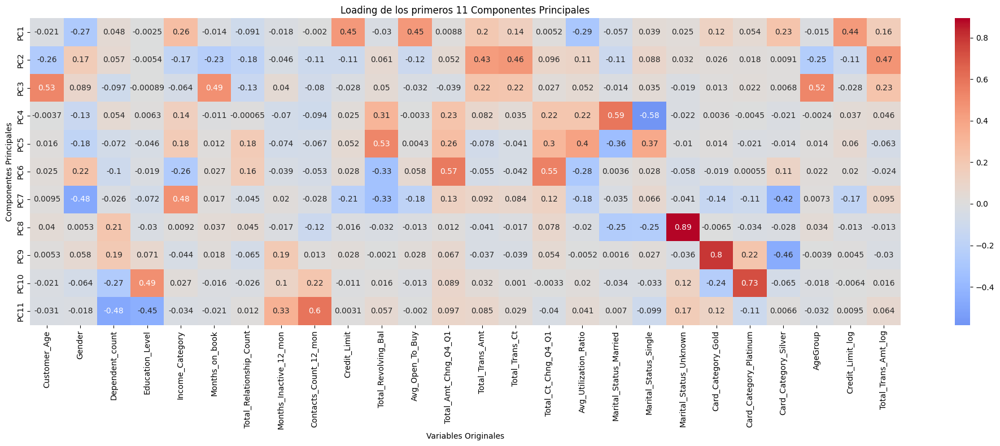

In [ ]:
# Seleccionar solo los loadings de los componentes necesarios
componentes_importantes = df_componentes_principales.iloc[:n_componentes_75, :]

plt.figure(figsize=(20, 8))
sns.heatmap(componentes_importantes, annot=True, cmap='coolwarm', center=0)
plt.title(f'Loading de los primeros {n_componentes_75} Componentes Principales')
plt.xlabel('Variables Originales')
plt.ylabel('Componentes Principales')
plt.tight_layout()
plt.show()

In [ ]:
# Proyecciones

proyecciones = pca_pipe.transform(variables_pca)

proyecciones = pd.DataFrame(
    proyecciones[:, :10],
    columns=[f'PC{i+1}' for i in range(10)]
)

print("\nProyecciones PCA (10 primeros componentes):")
proyecciones.head()


Proyecciones PCA (10 primeros componentes):


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.759142,-2.082007,-1.358344,2.383011,1.384675,3.839244,1.238936,0.218649,0.244323,-0.187640
1,-0.568192,-0.337681,-0.371025,1.906860,5.267001,9.852911,1.188332,1.400792,1.320916,-0.331259
2,-0.354427,-1.266079,-0.357615,4.303382,3.166547,8.916677,3.679429,0.908234,0.796474,0.342411
3,-2.324856,0.185801,-1.206748,2.527522,4.108465,4.327283,-0.413267,4.531546,1.162252,0.091446
4,-0.447493,-0.879719,-2.868271,3.890133,3.023568,8.443034,3.031091,0.869057,0.575382,-0.689945


### 5.2. t-SNE

In [ ]:
# Librerias
from sklearn.manifold import TSNE, trustworthiness
from sklearn.preprocessing import StandardScaler
from itertools import product

In [ ]:
# Escalar datos
scaler = StandardScaler()
scaled_data = scaler.fit_transform(variables_pca)

In [ ]:
# Rango de parámetros
n_samples = scaled_data.shape[0]
perplexities = [p for p in [5, 10, 30, 50] if p < n_samples]  # perplexity < n_samples
learning_rates = [10, 100, 200, 500]
early_exaggerations = [12, 24, 36]

In [ ]:
# Probar combinaciones de parámetros
resultados = []
for perp, lr, ee in product(perplexities, learning_rates, early_exaggerations):
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        learning_rate=lr,
        early_exaggeration=ee,
        n_iter=1000,
        random_state=42,
        init='random'
    )

    embedding = tsne.fit_transform(scaled_data)
    trust = trustworthiness(scaled_data, embedding, n_neighbors=10)

    resultados.append({
        'perplexity': perp,
        'learning_rate': lr,
        'early_exaggeration': ee,
        'trustworthiness': trust,
        'embedding': embedding
    })

In [ ]:
# Convertir a DataFrame para análisis
resultados_df = pd.DataFrame(resultados)

In [ ]:
# Ordenar por mejor trustworthiness
mejor = resultados_df.sort_values(by='trustworthiness', ascending=False).iloc[0]

In [ ]:
print("Mejor combinación encontrada")
print(f"Perplexity: {mejor['perplexity']}")
print(f"Learning Rate: {mejor['learning_rate']}")
print(f"Early Exaggeration: {mejor['early_exaggeration']}")
print(f"Trustworthiness: {mejor['trustworthiness']:.4f}")

Mejor combinación encontrada
Perplexity: 30
Learning Rate: 200
Early Exaggeration: 24
Trustworthiness: 0.9875


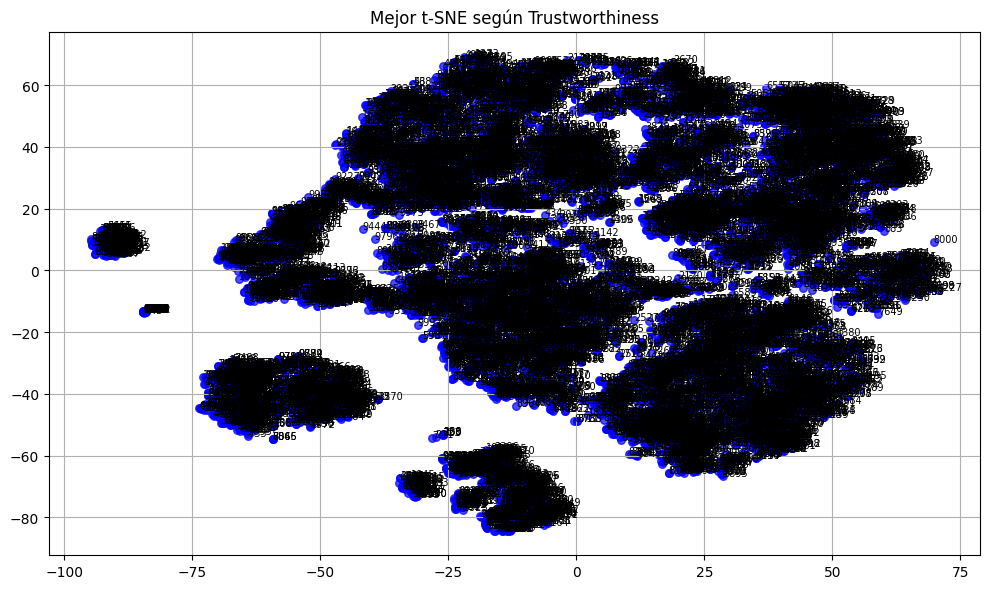

In [ ]:
# Visualizar mejor embedding
best_embedding = mejor['embedding']
plt.figure(figsize=(10, 6))
plt.scatter(best_embedding[:, 0], best_embedding[:, 1], s=30, color='blue', alpha=0.7)

# Etiquetas (opcional: index de tus datos o una columna específica de banco_codi)
for i, name in enumerate(variables_pca.index):
    plt.text(best_embedding[i, 0], best_embedding[i, 1], str(name), fontsize=7)

plt.title("Mejor t-SNE según Trustworthiness")
plt.grid(True)
plt.tight_layout()
plt.show()

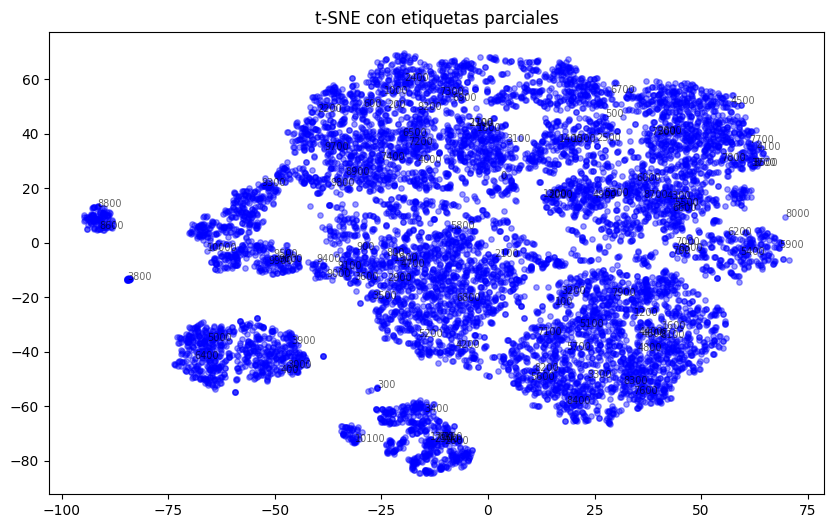

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(best_embedding[:, 0], best_embedding[:, 1], s=15, color='blue', alpha=0.4)

# Mostrar solo cada 100 etiquetas
for i, name in enumerate(variables_pca.index):
    if i % 100 == 0:
        plt.text(best_embedding[i, 0], best_embedding[i, 1], str(name),
                 fontsize=7, alpha=0.6)

plt.title("t-SNE con etiquetas parciales")
plt.show()


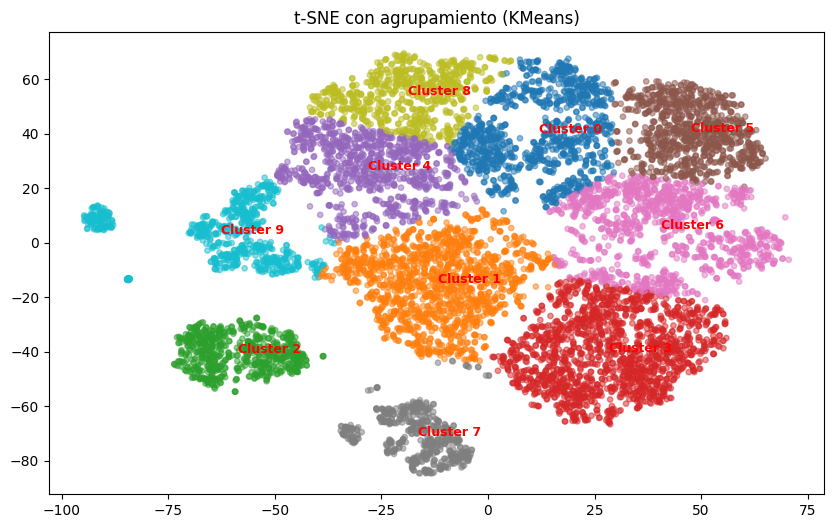

In [ ]:
from sklearn.cluster import KMeans

# Aplicar clustering sobre el embedding
kmeans = KMeans(n_clusters=10, random_state=42).fit(best_embedding)
labels = kmeans.labels_

plt.figure(figsize=(10, 6))
# Colorear por cluster
plt.scatter(best_embedding[:, 0], best_embedding[:, 1], c=labels, cmap="tab10", s=15, alpha=0.5)

# Mostrar solo los centroides
centers = kmeans.cluster_centers_
for i, (x, y) in enumerate(centers):
    plt.text(x, y, f"Cluster {i}", fontsize=9, weight="bold", color="red")

plt.title("t-SNE con agrupamiento (KMeans)")
plt.show()


### 5.3. K-Means Clustering

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn import metrics

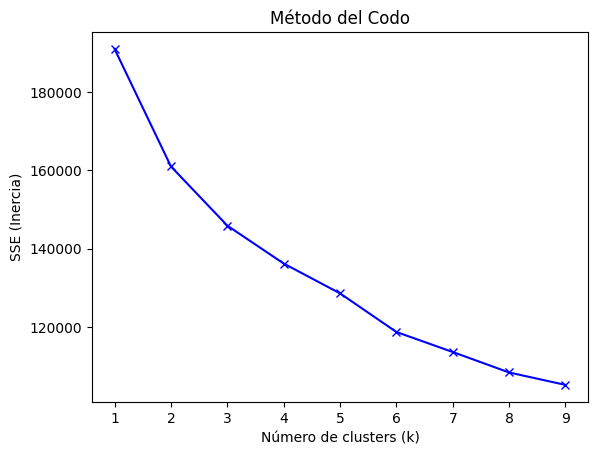

In [ ]:
# Método del codo (SSE)

sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(proyecciones)
    sse[k] = kmeans.inertia_

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel("Número de clusters (k)")
plt.ylabel("SSE (Inercia)")
plt.title("Método del Codo")
plt.show()

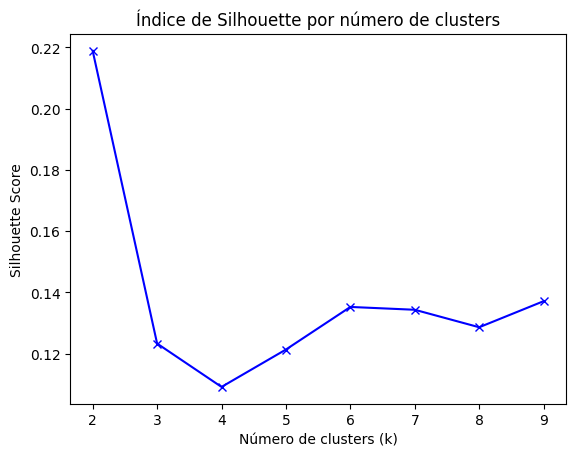

In [ ]:
# Silhouette Score para varios k

sc = {}
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(proyecciones)
    labels = kmeans.predict(proyecciones)
    sc[k] = silhouette_score(proyecciones, labels)

plt.figure()
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Índice de Silhouette por número de clusters")
plt.show()

In [ ]:
# Entrenar modelo final con k=3
kmeans = KMeans(n_clusters=3, random_state=1)
proyecciones_copy = proyecciones.copy(deep=True)
proyecciones_copy['KMeans_Labels'] = kmeans.fit_predict(proyecciones)

# Crear df1
df1 = banco_codi.copy()



In [ ]:
df1.drop(columns=["CLIENTNUM", "Attrition_Flag", "Marital_Status_Married", "Marital_Status_Single","Marital_Status_Unknown", "Card_Category_Gold", "Card_Category_Platinum", "Card_Category_Silver"], inplace=True)

In [ ]:
df1['KMeans_Labels'] = proyecciones_copy['KMeans_Labels']

In [ ]:
# Evaluación del clustering
silhouette = metrics.silhouette_score(proyecciones, proyecciones_copy['KMeans_Labels'])
calinski = metrics.calinski_harabasz_score(proyecciones, proyecciones_copy['KMeans_Labels'])
davies = metrics.davies_bouldin_score(proyecciones, proyecciones_copy['KMeans_Labels'])

print(f"Silhouette Score: {silhouette}")
print(f"Calinski-Harabasz Score: {calinski}")
print(f"Davies-Bouldin Score: {davies}")

Silhouette Score: 0.12326644636700596
Calinski-Harabasz Score: 1563.6780835559975
Davies-Bouldin Score: 2.133087009705761


In [ ]:
# Resumen por clusters

numeric_columns = df1.select_dtypes(include=[np.number]).columns
median = df1.groupby('KMeans_Labels')[numeric_columns].median()
median.index = [f'Group {int(i)} Median' for i in median.index]
df_kmeans = median.T
print(df_kmeans)

                          Group 0 Median  Group 1 Median  Group 2 Median
Customer_Age                   54.000000       46.000000       42.000000
Gender                          1.000000        0.000000        1.000000
Dependent_count                 2.000000        3.000000        3.000000
Education_Level                 2.000000        1.000000        2.000000
Income_Category                 1.000000        4.000000        1.000000
Months_on_book                 43.000000       36.000000       34.000000
Total_Relationship_Count        4.000000        3.000000        4.000000
Months_Inactive_12_mon          2.000000        2.000000        2.000000
Contacts_Count_12_mon           3.000000        2.000000        2.000000
Credit_Limit                 3316.500000    21358.000000     3278.000000
Total_Revolving_Bal          1334.500000     1260.000000     1251.000000
Avg_Open_To_Buy              2015.000000    20178.000000     2125.000000
Total_Amt_Chng_Q4_Q1            0.722000        0.7

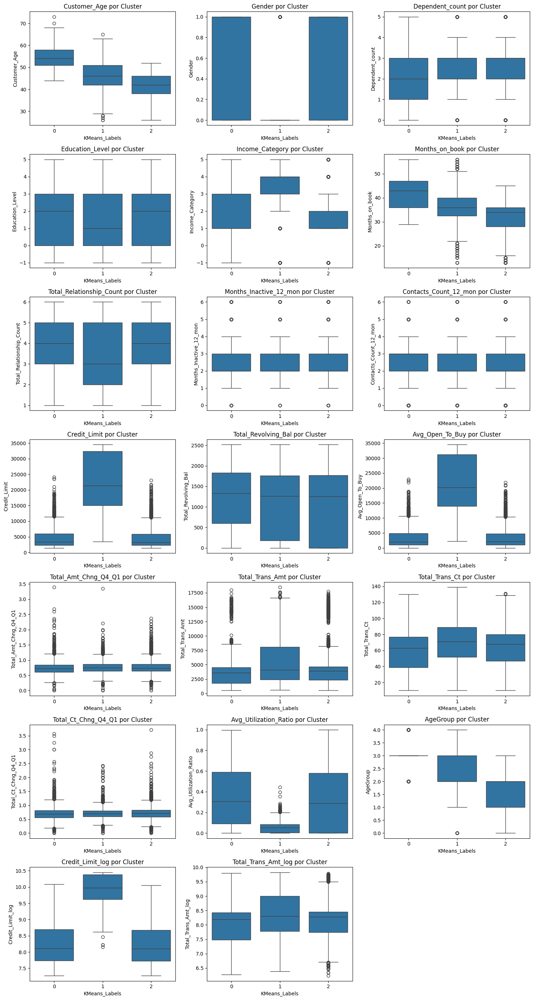

In [ ]:
# Visualización Boxplots por cluster

cols_visualise = df1.select_dtypes(include=['int64', 'float64']).columns
plots_per_row = 3
total_plots = len(cols_visualise)
total_rows = math.ceil(total_plots / plots_per_row)

fig, axes = plt.subplots(total_rows, plots_per_row, figsize=(plots_per_row * 5, total_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cols_visualise):
    ax = axes[i]
    sns.boxplot(x='KMeans_Labels', y=col, data=df1, ax=ax)
    ax.set_title(f"{col} por Cluster")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

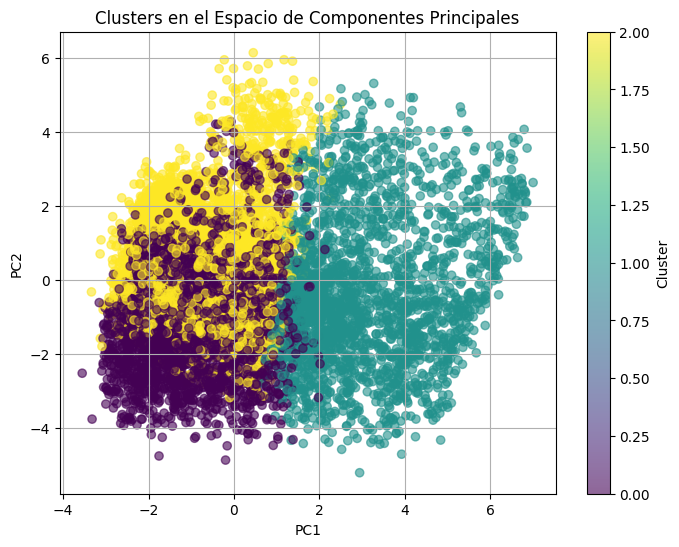

In [ ]:
# Visualización en plano PCA (PC1 vs PC2)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(proyecciones['PC1'], proyecciones['PC2'],
                      c=proyecciones_copy['KMeans_Labels'], cmap='viridis', alpha=0.6)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters en el Espacio de Componentes Principales')
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.show()

### 5.4. K-Medoids

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import math

In [ ]:
# Seleccionar columnas numéricas, excluyendo 'kmedoLabels', 'CLIENTNUM' y 'Attrition_Flag'
cols_visualise = banco_codi.select_dtypes(include=['int64', 'float64']).columns.drop(
    ["CLIENTNUM", "Attrition_Flag", "Marital_Status_Married", "Marital_Status_Single","Marital_Status_Unknown", "Card_Category_Gold", "Card_Category_Platinum", "Card_Category_Silver"], errors='ignore'
)

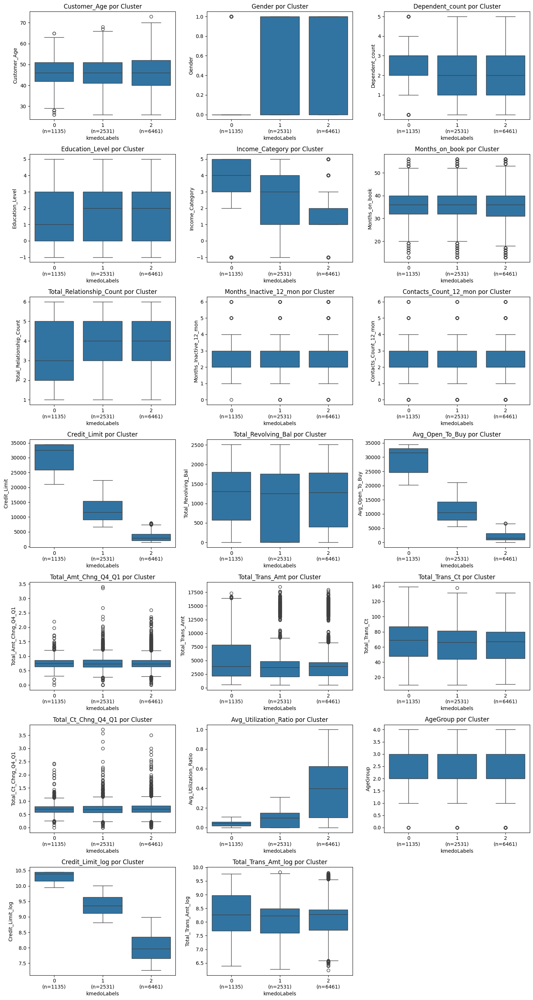

In [ ]:
# Configurar la cuadrícula de subgráficos
plots_per_row = 3
total_plots = len(cols_visualise)
total_rows = math.ceil(total_plots / plots_per_row)

fig, axes = plt.subplots(total_rows, plots_per_row, figsize=(plots_per_row * 5, total_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cols_visualise):
    ax = axes[i]
    sns.boxplot(x='kmedoLabels', y=col, data=banco_codi, ax=ax)

    # Añadir n de cada grupo en las etiquetas del eje x
    counts = banco_codi.groupby('kmedoLabels')[col].count()
    labels = [f"{label}\n(n={counts[label]})" if label in counts else str(label) for label in sorted(banco_codi['kmedoLabels'].unique())]
    ax.set_xticklabels(labels)

    ax.set_title(f"{col} por Cluster")

# Eliminar ejes vacíos
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
# Metricas
X = banco_codi.select_dtypes(include=[np.number]).drop(
    columns=['kmedoLabels', 'CLIENTNUM', 'Attrition_Flag'], errors='ignore'
)
labels = banco_codi['kmedoLabels']

# Calcular métricas
silhouette_score = metrics.silhouette_score(X, labels)
calinski_harabasz_score = metrics.calinski_harabasz_score(X, labels)
davies_bouldin_score = metrics.davies_bouldin_score(X, labels)

print(f"Silhouette Score: {silhouette_score:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz_score:.2f}")
print(f"Davies-Bouldin Score: {davies_bouldin_score:.4f}")

Silhouette Score: 0.5758
Calinski-Harabasz Score: 27314.47
Davies-Bouldin Score: 0.6544


* Silhouette Score: 0.5758

  Indica una separación moderada a buena entre los 3 clusters.


* Calinski-Harabasz Score: 27,314.47

  Refleja una gran diferencia entre clusters y baja dispersión interna.


* Davies-Bouldin Score: 0.6544

  Sugiere un solapamiento bajo, con margen para optimización.

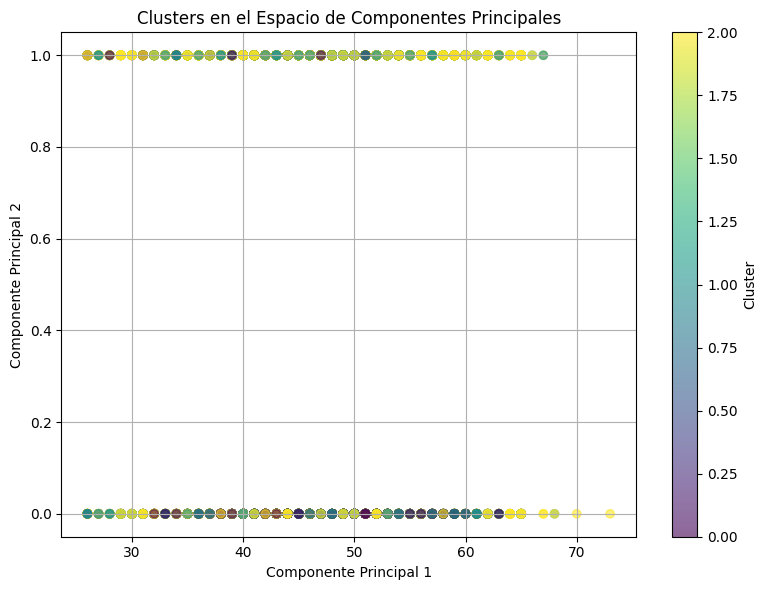

In [ ]:
# Asegurar que los índices estén alineados
banco_codi = banco_codi.reset_index(drop=True)
variables_pca = variables_pca.reset_index(drop=True)

# Crear el DataFrame 'proyecciones'
proyecciones = pd.DataFrame({
    'PC1': variables_pca.iloc[:, 0],  # Primera componente principal
    'PC2': variables_pca.iloc[:, 1],  # Segunda componente principal
    'kmedoLabels': banco_codi['kmedoLabels']  # Etiquetas de clusters
})

# Verificación de columnas
PC1 = proyecciones['PC1']
PC2 = proyecciones['PC2']
etiquetas_clusters = proyecciones['kmedoLabels']

# Graficar
plt.figure(figsize=(8, 6))
scatter = plt.scatter(PC1, PC2, c=etiquetas_clusters, cmap='viridis', alpha=0.6)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Clusters en el Espacio de Componentes Principales')
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

# 6. Redes Nueronales

### 6.1. ANN (MLPClassifier)

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    balanced_accuracy_score, matthews_corrcoef,
    ConfusionMatrixDisplay, roc_curve, auc
)
import matplotlib.pyplot as plt

In [ ]:
# Carga de datos

with open("X_train_hib.pkl", "rb") as f:
    X_train_res = pickle.load(f)

with open("y_train_hib.pkl", "rb") as f:
    y_train_res = pickle.load(f)

with open("X_test_scaled.pkl", "rb") as f:
    X_test = pickle.load(f)

with open("y_test.pkl", "rb") as f:
    y_test = pickle.load(f)

print("Datos cargados correctamente")
print("Train:", X_train_res.shape, y_train_res.shape)
print("Test:", X_test.shape, y_test.shape)

Datos cargados correctamente
Train: (13582, 27) (13582,)
Test: (2026, 27) (2026,)


In [ ]:
# Tuning con GridSearchCV
param_grid_ann = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'tanh'],
    'alpha': [0.0001, 0.001],
    'solver': ['adam', 'sgd']
}

grid_ann = GridSearchCV(
    MLPClassifier(max_iter=1000, random_state=42),
    param_grid_ann,
    refit=True,
    verbose=2,
    cv=5,
    scoring="roc_auc"
)

grid_ann.fit(X_train_res, y_train_res)

print("Mejor modelo encontrado (ANN - MLPClassifier):")
print(grid_ann.best_estimator_)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=adam; total time=  26.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=adam; total time=  24.7s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=adam; total time=  21.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=adam; total time=  18.7s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=adam; total time=  22.5s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=sgd; total time=  29.0s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=sgd; total time=  20.2s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=sgd; total time=  23.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), solver=sgd; total time=  17.9s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(

In [ ]:
# Entrenar modelo final

best_model_ann = grid_ann.best_estimator_
best_model_ann.model_name = "ANN (MLPClassifier)"
best_model_ann.fit(X_train_res, y_train_res)

MLPClassifier(alpha=0.001, max_iter=1000, random_state=42)

In [ ]:
# Guardar modelo
joblib.dump(best_model_ann, f"{ruta_modelos}/modelo_xgboost.pkl")

['/content/drive/MyDrive/PROYECTO UNI/Modelos/modelo_xgboost.pkl']

In [ ]:
# Predicciones de probabilidad
y_pred_prob_ann = best_model_ann.predict_proba(X_test)[:, 1]
# Búsqueda del umbral óptimo según F1
thresholds = [0.3, 0.4, 0.5, 0.6]
mejor_f1 = -1
umbral_optimo_ann = None

print("\nF1 por umbral (ANN):")
for t in thresholds:
    y_pred_thresh_ann = (y_pred_prob_ann >= t).astype(int)
    f1 = f1_score(y_test, y_pred_thresh_ann)
    auc_score = roc_auc_score(y_test, y_pred_prob_ann)
    print(f"Umbral {t} → F1: {round(f1, 3)} | AUC: {round(auc_score, 3)}")
    if f1 > mejor_f1:
        mejor_f1 = f1
        umbral_optimo_ann = t

print(f"Umbral óptimo (ANN): {umbral_optimo_ann} con F1 = {round(mejor_f1, 3)}")

# Predicciones binarias con el umbral óptimo

y_pred_ann = (y_pred_prob_ann >= umbral_optimo_ann).astype(int)


F1 por umbral (ANN):
Umbral 0.3 → F1: 0.928 | AUC: 0.914
Umbral 0.4 → F1: 0.926 | AUC: 0.914
Umbral 0.5 → F1: 0.923 | AUC: 0.914
Umbral 0.6 → F1: 0.921 | AUC: 0.914
Umbral óptimo (ANN): 0.3 con F1 = 0.928


In [ ]:
# Métricas principales

auc_ann = roc_auc_score(y_test, y_pred_prob_ann)
print(f"AUC: {auc_ann:.3f}\n")
print("Reporte de clasificación (ANN):")
print(classification_report(y_test, y_pred_ann))

AUC: 0.914

Reporte de clasificación (ANN):
              precision    recall  f1-score   support

           0       0.62      0.63      0.62       325
           1       0.93      0.93      0.93      1701

    accuracy                           0.88      2026
   macro avg       0.77      0.78      0.78      2026
weighted avg       0.88      0.88      0.88      2026



In [ ]:

# Métricas adicionales

print("Métricas adicionales:")
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred_ann), 3))
print("Matthews Correlation Coefficient:", round(matthews_corrcoef(y_test, y_pred_ann), 3))

# Control de sobreajuste

print("Control de sobreajuste:")
print("Train F1:", round(f1_score(y_train_res, best_model_ann.predict(X_train_res)), 3))
print("Test F1:", round(f1_score(y_test, y_pred_ann), 3))

Métricas adicionales:
Balanced Accuracy: 0.778
Matthews Correlation Coefficient: 0.553
Control de sobreajuste:
Train F1: 0.986
Test F1: 0.928


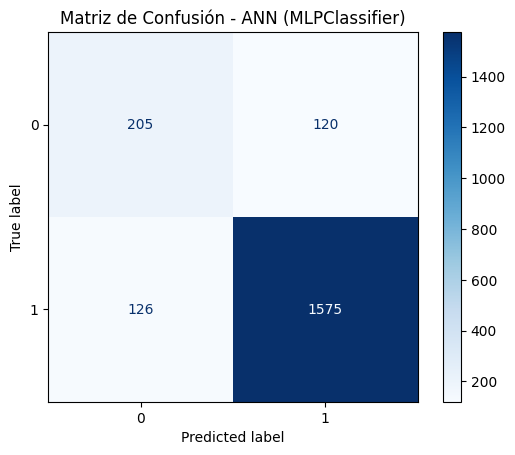

In [ ]:
# Matriz de confusión

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_ann, cmap=plt.cm.Blues)
plt.title(f"Matriz de Confusión - {best_model_ann.model_name}")
plt.show()

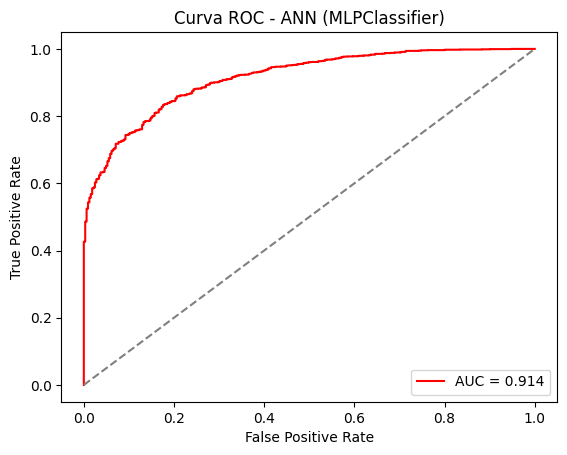

In [ ]:
# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_ann)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title(f"Curva ROC - {best_model_ann.model_name}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

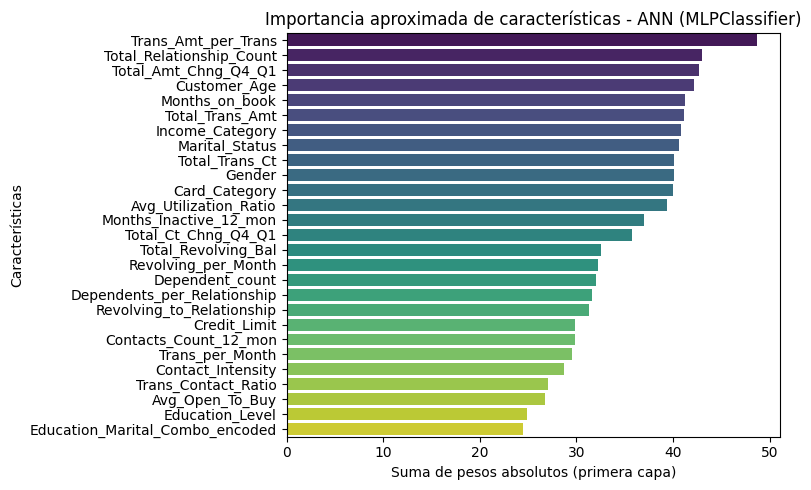

In [ ]:
# Importancia de variables en ANN (MLPClassifier)
try:
    # Pesos de la primera capa (input → primera capa oculta)
    first_layer_weights = best_model_ann.coefs_[0]

    # Suma de valores absolutos de los pesos por variable
    feature_importance_ann = np.sum(np.abs(first_layer_weights), axis=1)

    # Crear Series ordenada
    feature_scores_ann = pd.Series(
        feature_importance_ann,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    # Si no hay nombres de columnas
    feature_scores_ann = pd.Series(
        feature_importance_ann,
        index=[f"Feature_{i}" for i in range(X_train_res.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores_ann, y=feature_scores_ann.index, palette="viridis")
plt.title("Importancia aproximada de características - ANN (MLPClassifier)")
plt.xlabel("Suma de pesos absolutos (primera capa)")
plt.ylabel("Características")
plt.tight_layout()
plt.show()

In [ ]:
!pip install graphviz

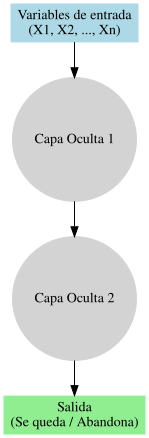

In [ ]:
from graphviz import Digraph
from IPython.display import display

dot = Digraph(comment="Neural Network", format="png")

# Capa de entrada
dot.node("X", "Variables de entrada\n(X1, X2, ..., Xn)", shape="box", style="filled", color="lightblue")

# Capas ocultas
dot.node("H1", "Capa Oculta 1", shape="circle", style="filled", color="lightgray")
dot.node("H2", "Capa Oculta 2", shape="circle", style="filled", color="lightgray")

# Capa de salida
dot.node("Y", "Salida\n(Se queda / Abandona)", shape="box", style="filled", color="lightgreen")

# Conexiones
dot.edges([("X","H1"), ("H1","H2"), ("H2","Y")])


display(dot)


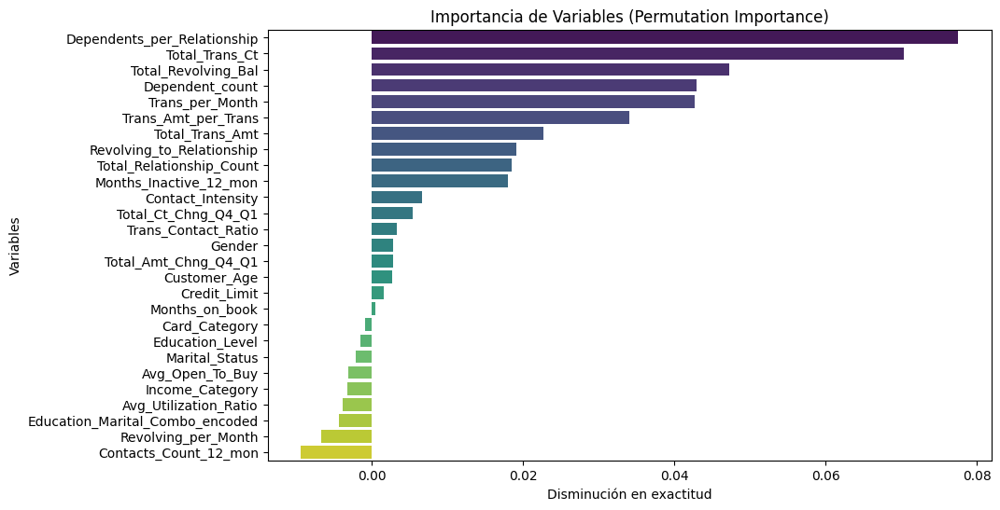

In [ ]:
# Importancia de variables

# Variables
original_feature_names = X_train.columns.tolist()

# Importancia de variables con permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(
    best_mlp, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1
)

importances = perm_importance.importances_mean

# Ordenar de mayor a menor
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(
    x=importances[indices],
    y=np.array(original_feature_names)[indices],
    palette="viridis"
)
plt.title("Importancia de Variables (Permutation Importance)")
plt.xlabel("Disminución en exactitud")
plt.ylabel("Variables")
plt.show()


# Resultados

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report, roc_auc_score

# Diccionario con modelos, predicciones binarias y probabilidades
modelos = {
    "Random Forest": (y_pred_rf, y_pred_prob_rf, umbral_optimo_rf),
    "XGBoost": (y_pred_xgb, y_pred_prob_xgb, umbral_optimo_xgb),
    "LightGBM": (y_pred_lgbm, y_pred_prob_lgbm, umbral_optimo_lgbm),
    "Logistic Regression": (y_pred_logreg, y_pred_prob_logreg, umbral_optimo_logreg),
    "ElasticNet": (y_pred_enet, y_pred_prob_enet, umbral_optimo_enet),
    "CatBoost": (y_pred_cat, y_pred_prob_cat, umbral_optimo_cat),
    "ANN (MLP)": (y_pred_ann, y_pred_prob_ann, umbral_optimo_ann),
    "Naive Bayes": (y_pred_nb, y_pred_prob_nb, umbral_optimo_nb)
}

# Lista para guardar resultados
resultados = []

for nombre, (y_pred, y_prob, umbral) in modelos.items():
    # Extraer solo el weighted avg del classification_report
    report = classification_report(y_test, y_pred, output_dict=True)
    weighted_avg = report["weighted avg"]

    resultados.append({
        "Modelo": nombre,
        "Umbral óptimo": umbral,
        "Precision": round(weighted_avg["precision"], 3),
        "Recall": round(weighted_avg["recall"], 3),
        "F1-score": round(weighted_avg["f1-score"], 3),
        "AUC": round(roc_auc_score(y_test, y_prob), 3)
    })

# Crear DataFrame final
df_metricas = pd.DataFrame(resultados)
print(df_metricas)

                Modelo  Umbral óptimo  Precision  Recall  F1-score    AUC
0        Random Forest            0.3      0.893   0.898     0.894  0.933
1              XGBoost            0.4      0.904   0.909     0.905  0.939
2             LightGBM            0.4      0.908   0.912     0.909  0.942
3  Logistic Regression            0.3      0.868   0.859     0.863  0.853
4           ElasticNet            0.3      0.867   0.858     0.862  0.853
5             CatBoost            0.3      0.901   0.907     0.899  0.940
6            ANN (MLP)            0.3      0.879   0.879     0.879  0.914
7          Naive Bayes            0.3      0.840   0.723     0.757  0.813


| Modelo              | Umbral óptimo | Precision | Recall | F1-score |  AUC  |
|---------------------|---------------|-----------|--------|----------|-------|
| Random Forest       | 0.3           | 0.893     | 0.898  | 0.894    | 0.933 |
| XGBoost             | 0.4           | 0.904     | 0.909  | 0.905    | 0.939 |
| LightGBM            | 0.4           | 0.908     | 0.912  | 0.909    | 0.942 |
| Logistic Regression | 0.3           | 0.868     | 0.859  | 0.863    | 0.853 |
| ElasticNet          | 0.3           | 0.867     | 0.858  | 0.862    | 0.853 |
| CatBoost            | 0.3           | 0.901     | 0.907  | 0.899    | 0.940 |
| ANN (MLP)           | 0.3           | 0.879     | 0.879  | 0.879    | 0.914 |
| Naive Bayes         | 0.3           | 0.840     | 0.723  | 0.757    | 0.813 |



**Análisis:**

Tras evaluar ocho algoritmos distintos, observamos que los modelos basados en *gradient boosting* (LightGBM, XGBoost y CatBoost) dominaron el rendimiento global, con F1-scores cercanos o superiores al 0.90 y AUC por encima de 0.939, lo que refleja una excelente capacidad de discriminación y un equilibrio sólido entre precisión y recall. LightGBM obtuvo el mejor F1 (0.909) y AUC (0.942), seguido muy de cerca por XGBoost y CatBoost. Sin embargo, la elección final recae en **CatBoost** por varias razones estratégicas: ofrece un rendimiento prácticamente equivalente a los líderes (F1=0.899, AUC=0.940), pero con ventajas adicionales en facilidad de implementación, manejo nativo de variables categóricas y menor necesidad de preprocesamiento, lo que reduce el riesgo de errores y acelera el flujo de trabajo. Además, CatBoost es menos sensible a la configuración de hiperparámetros que otros métodos de boosting, lo que aporta estabilidad y reproducibilidad en entornos de producción. Frente a modelos lineales como Logistic Regression y ElasticNet, que aunque más interpretables presentan menor AUC (0.853), CatBoost logra un salto significativo en capacidad predictiva. En comparación con ANN (MLP), mantiene un rendimiento superior en AUC y similar en F1, con menor complejidad de entrenamiento. Por último, supera ampliamente a Naive Bayes, que mostró un recall bajo (0.723) y un F1 de apenas 0.757. En conclusión, CatBoost representa la mejor combinación de rendimiento, estabilidad y eficiencia para este caso de uso, maximizando la precisión y la capacidad de generalización sin sacrificar la simplicidad operativa.


**Métricas del modelo seleccionado**


In [ ]:
y_pred_cat = (y_pred_prob_cat >= umbral_optimo_cat).astype(int)

print("Reporte de clasificación (CatBoost):")
print(classification_report(y_test, y_pred_cat))

balanced_acc = balanced_accuracy_score(y_test, y_pred_cat)
mcc = matthews_corrcoef(y_test, y_pred_cat)
train_f1 = f1_score(y_train_res, best_model_cat.predict(X_train_res))
test_f1 = f1_score(y_test, y_pred_cat)
auc_cat = roc_auc_score(y_test, y_pred_prob_cat)

print(f"Balanced Accuracy: {balanced_acc:.3f}")
print(f"MCC: {mcc:.3f}")
print(f"Train F1: {train_f1:.3f}")
print(f"Test F1: {test_f1:.3f}")
print(f"AUC: {auc_cat:.3f}")

Reporte de clasificación (CatBoost):
              precision    recall  f1-score   support

           0       0.82      0.54      0.65       325
           1       0.92      0.98      0.95      1701

    accuracy                           0.91      2026
   macro avg       0.87      0.76      0.80      2026
weighted avg       0.90      0.91      0.90      2026

Balanced Accuracy: 0.758
MCC: 0.616
Train F1: 0.970
Test F1: 0.946
AUC: 0.940


**Comentarios:**

El modelo CatBoost muestra un buen rendimiento general con una precisión del 91%, pero presenta un desequilibrio en el desempeño entre las clases. La clase 1 tiene una precisión de 92% y un recall de 98%, lo que indica un buen manejo de los casos mayoritarios. Sin embargo, en la clase 0, el recall es bajo (54%), lo que sugiere que el modelo no está identificando bien los casos minoritarios, a pesar de aplicar balanceo híbrido. El AUC de 0.940 y el F1-score de prueba de 0.946 reflejan una alta capacidad de discriminación y buena generalización. El MCC de 0.616 y la balanced accuracy de 0.758 muestran que, aunque el modelo es robusto, hay margen para mejorar el desempeño en la clase minoritaria.

**Curva ROC**

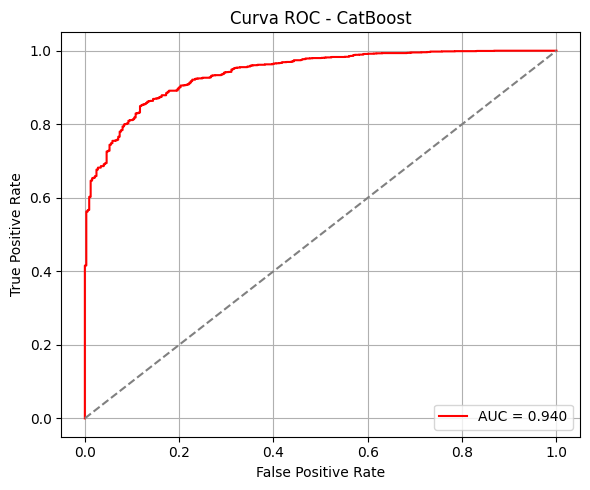

In [ ]:
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_cat)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='red', label=f'AUC = {roc_auc:.3f}')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title("Curva ROC - CatBoost")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

**Comentarios:**

La curva ROC del modelo CatBoost muestra un excelente rendimiento con un AUC de 0.940, lo que indica una alta capacidad para discriminar entre las clases positivas y negativas. La curva se aleja significativamente de la línea diagonal, lo que sugiere que el modelo está funcionando bien, con una tasa de verdaderos positivos mucho mayor que la de falsos positivos.

**Curva Precision-Recall**

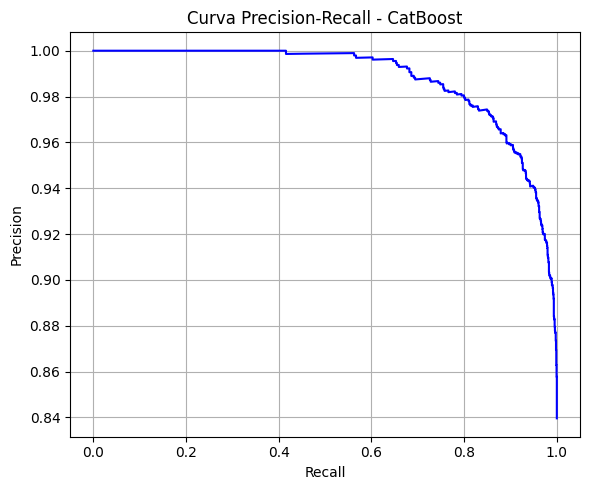

In [ ]:
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob_cat)
plt.figure(figsize=(6, 5))
plt.plot(recall, precision, color='blue')
plt.title("Curva Precision-Recall - CatBoost")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.tight_layout()
plt.show()

**Comentarios:**
La curva Precision-Recall del modelo CatBoost muestra un comportamiento excelente, con una precisión cercana al 1 en los primeros valores de recall. Esto sugiere que el modelo tiene un rendimiento muy bueno en la mayoría de los casos cuando intenta identificar las clases positivas, con poca disminución en precisión incluso cuando el recall aumenta. Sin embargo, la caída pronunciada en la parte final de la curva indica que a medida que el recall sigue subiendo, la precisión disminuye significativamente. Esto puede estar relacionado con el modelo prediciendo más instancias como positivas (lo que aumenta el recall) pero perdiendo precisión en esas predicciones. En general, el modelo tiene un buen desempeño, aunque este comportamiento puede indicar una tendencia a clasificar más casos de la clase positiva, lo que afecta la precisión en los valores más altos de recall.

**Matriz de confusión**

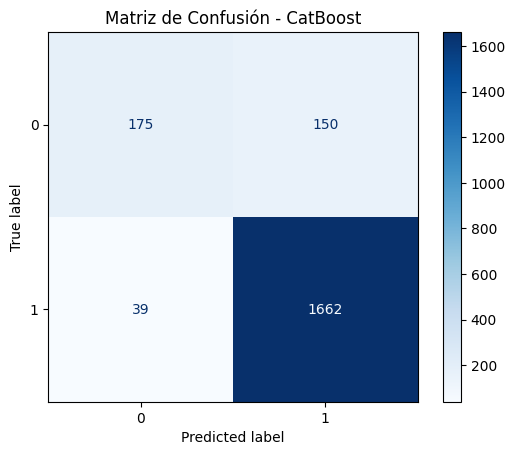

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_cat, cmap=plt.cm.Blues)
plt.title("Matriz de Confusión - CatBoost")
plt.show()

**Comentarios:**


La matriz de confusión muestra que el modelo CatBoost clasifica bien en general, con 1662 aciertos en la clase 1 y 150 aciertos en la clase 0. Sin embargo, comete errores al predecir 39 instancias de la clase 1 como clase 0 y 175 instancias de la clase 0 como clase 1. Aunque el modelo tiene un buen desempeño, los errores en la clase 0 (falsos negativos y falsos positivos) muestran que hay margen para mejorar.

**Importancia de variables**

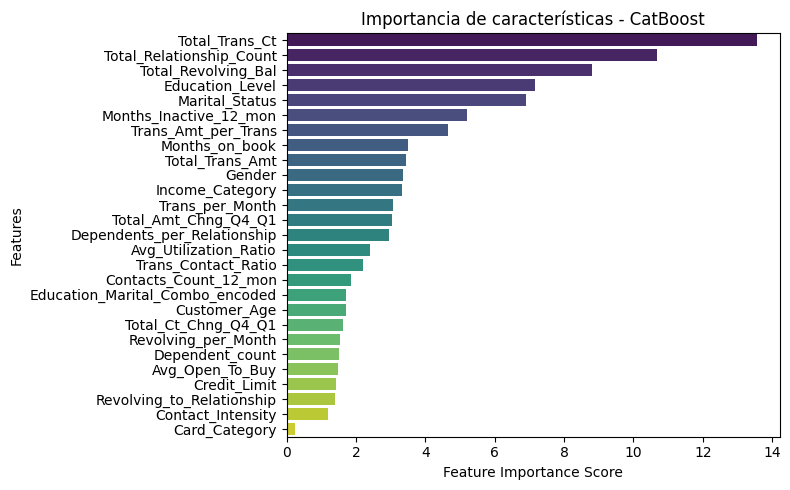

In [ ]:
try:
    feature_scores_cat = pd.Series(
        best_model_cat.feature_importances_,
        index=X_train.columns
    ).sort_values(ascending=False)
except AttributeError:
    feature_scores_cat = pd.Series(
        best_model_cat.feature_importances_,
        index=[f"Feature_{i}" for i in range(X_train.shape[1])]
    ).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_scores_cat, y=feature_scores_cat.index, palette="viridis")
plt.title("Importancia de características - CatBoost")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

**Comentarios:**

El gráfico muestra que las características más importantes para el modelo CatBoost son Total_Trans_Ct (total de transacciones) y Total_Relationship_Count (número de relaciones), seguidas por Total_Revolving_Bal (saldo rotatorio), Education_Level (nivel educativo) y Marital_Status (estado civil). Estas variables tienen la mayor influencia en las predicciones. En cambio, características como Card_Category (categoría de tarjeta) y Revolving_to_Relationship (relación revolving-relación) tienen poca relevancia, indicando que no aportan mucho al modelo.

**PCA - Separabilidad**

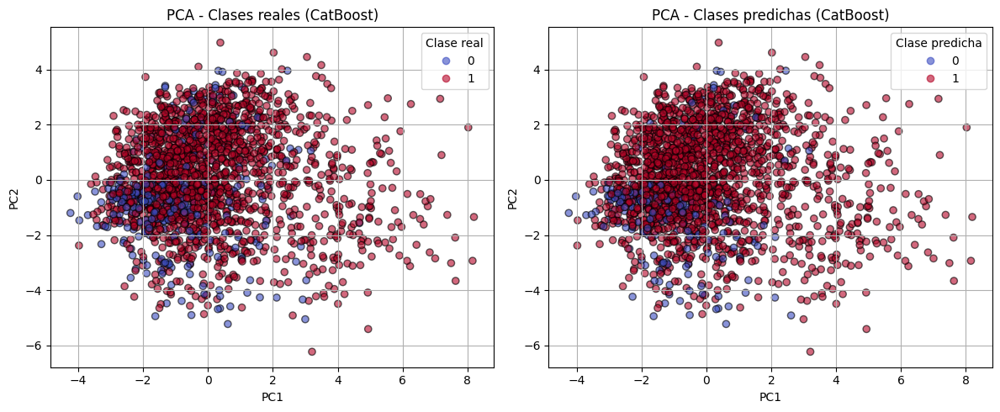

In [ ]:
pca = PCA(n_components=2)
X_pca_cat = pca.fit_transform(X_test)

plt.figure(figsize=(12, 5))

# Clases reales
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(X_pca_cat[:, 0], X_pca_cat[:, 1], c=y_test, cmap='coolwarm', alpha=0.6, edgecolor='k')
plt.title("PCA - Clases reales (CatBoost)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.legend(*scatter1.legend_elements(), title="Clase real")

# Clases predichas
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(X_pca_cat[:, 0], X_pca_cat[:, 1], c=y_pred_cat, cmap='coolwarm', alpha=0.6, edgecolor='k')
plt.title("PCA - Clases predichas (CatBoost)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.legend(*scatter2.legend_elements(), title="Clase predicha")

plt.tight_layout()
plt.show()

**Comentarios:**
La gráfica PCA muestra que el modelo CatBoost tiene un buen rendimiento general al clasificar las clases, pero todavía comete errores en algunas instancias. En la representación de las clases reales, las clases 0 y 1 están algo separadas, pero con algo de superposición. En las predicciones, aunque la mayoría de los puntos están bien clasificados, aún se observan errores donde las predicciones de clase 1 se mezclan con la clase 0, lo que indica que el modelo tiene dificultades para diferenciar algunas instancias. Esto refleja que, aunque el modelo funciona bien, hay margen para mejorar en ciertos casos.

# Conclusiones y Recomendaciones

El análisis comparativo de ocho algoritmos de clasificación evidenció que los modelos basados en gradient boosting (LightGBM, XGBoost y CatBoost) alcanzaron el mejor rendimiento, con F1-scores cercanos o superiores a 0.90 y AUC por encima de 0.939. Entre ellos, CatBoost fue seleccionado como modelo final por su equilibrio entre rendimiento y estabilidad, logrando un F1-score de 0.899, AUC de 0.940, precisión del 90.1 % y recall del 90.7 % en promedio ponderado. Destacó especialmente en la clase positiva (recall del 98 % y F1 de 0.95), aunque en la clase negativa el recall fue menor (0.54), lo que sugiere margen de mejora en la detección de esta categoría. El Balanced Accuracy de 0.758 y el MCC de 0.616 confirman un desempeño robusto, mientras que la cercanía entre el F1 en entrenamiento (0.970) y en prueba (0.946) indica buena capacidad de generalización sin sobreajuste significativo.

Se recomienda implementar CatBoost en producción utilizando el umbral óptimo de 0.3, monitorear periódicamente métricas clave como F1, AUC y Balanced Accuracy, y explorar técnicas adicionales de balanceo o ajuste de pesos para mejorar el recall de la clase minoritaria. Asimismo, se sugiere emplear análisis de interpretabilidad, como la importancia de variables y valores SHAP, para comprender el impacto de cada predictor y facilitar la toma de decisiones. Finalmente, se aconseja establecer un plan de reentrenamiento periódico para mantener la vigencia del modelo frente a posibles cambios en la distribución de los datos.